# Home Credit Default Risk (HCDR)

The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/). The goal of this project is to predict whether or not a client will repay a loan. In order to make sure that people who struggle to get loans due to insufficient or non-existent credit histories have a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.


## Some of the challenges

1. Dataset size 
   * (688 meg compressed) with millions of rows of data
   * 2.71 Gig of data uncompressed
* Dealing with missing data
* Imbalanced datasets
* Summarizing transaction data
 

# Kaggle API setup
Kaggle is a Data Science Competition Platform which shares a lot of datasets. In the past, it was troublesome to submit your result as your have to go through the console in your browser and drag your files there. Now you can interact with Kaggle via the command line. E.g., 

```bash
! kaggle competitions files home-credit-default-risk
```

It is quite easy to setup, it takes me less than 15 minutes to finish a submission.

1. Install library
* Create a API Token (edit your profile on [Kaggle.com](https://www.kaggle.com/)); this produces `kaggle.json` file
* Put your JSON `kaggle.json` in the right place
* Access competition files; make submissions via the command (see examples below)
* Submit result

For more detailed information on setting the Kaggle API see [here](https://medium.com/@nokkk/make-your-kaggle-submissions-with-kaggle-official-api-f49093c04f8a) and [here](https://github.com/Kaggle/kaggle-api).



In [1]:
!pip install kaggle

In [2]:
!pwd


/Users/saisathwikreddyvarikoti/Documents/Courses/Sem 1/Applied-Machine-Learning/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2


In [3]:
!pwd

/Users/saisathwikreddyvarikoti/Documents/Courses/Sem 1/Applied-Machine-Learning/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2


In [4]:
!ls -l  ~/.kaggle/kaggle.json

-rw-r--r--@ 1 saisathwikreddyvarikoti  staff  67 Nov 13 16:41 /Users/saisathwikreddyvarikoti/.kaggle/kaggle.json


In [5]:
json_file_not_exists = True #Change this to false if you already have json from kaggle
if json_file_not_exists:
    !mkdir ~/.kaggle
    !cp kaggle.json ~/.kaggle

mkdir: /Users/saisathwikreddyvarikoti/.kaggle: File exists


In [6]:
json_file_not_exists = False #Change this to false if you already have json from kaggle
if json_file_not_exists:
    !chmod 600 ~/.kaggle/kaggle.json

In [7]:
! kaggle competitions files home-credit-default-risk

name                                 size  creationDate         
----------------------------------  -----  -------------------  
HomeCredit_columns_description.csv   37KB  2019-12-11 02:55:35  
credit_card_balance.csv             405MB  2019-12-11 02:55:35  
previous_application.csv            386MB  2019-12-11 02:55:35  
POS_CASH_balance.csv                375MB  2019-12-11 02:55:35  
application_train.csv               158MB  2019-12-11 02:55:35  
installments_payments.csv           690MB  2019-12-11 02:55:35  
sample_submission.csv               524KB  2019-12-11 02:55:35  
bureau.csv                          162MB  2019-12-11 02:55:35  
bureau_balance.csv                  358MB  2019-12-11 02:55:35  
application_test.csv                 25MB  2019-12-11 02:55:35  


# Dataset and how to download


## Back ground Home Credit Group

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

### Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.


## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview

The `HomeCredit_columns_description.csv` acts as a data dictioanry.

There are 7 different sources of data:

* __application_train/application_test (307k rows, and 48k rows):__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau (1.7 Million rows):__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance (27 Million rows):__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application (1.6 Million rows):__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE (10 Million rows):__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment (13.6 Million rows):__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.


### Table sizes

| S. No | Table Name            | Rows       | Features | Numerical Features | Categorical Features | Megabytes |
| -----: | --------------------- | ----------: | --------: | ------------------: | --------------------: | ---------: |
| 1     | application_train     | 307,511    | 122      | 106                | 16                   | 158MB     |
| 2     | application_test      | 48,744     | 121      | 105                | 16                   | 25MB      |
| 3     | bureau                | 1,716,428  | 17       | 14                 | 3                    | 162MB     |
| 4     | bureau_balance        | 27,299,925 | 3        | 2                  | 1                    | 358MB     |
| 5     | credit_card_balance   | 3,840,312  | 23       | 22                 | 1                    | 405MB     |
| 6     | installments_payments | 13,605,401 | 8        | 21                 | 16                   | 690MB     |
| 7     | previous_application  | 1,670,214  | 37       | 8                  | 0                    | 386MB     |
| 8     | POS_CASH_balance      | 10,001,358 | 8        | 7                  | 1                    | 375MB     |





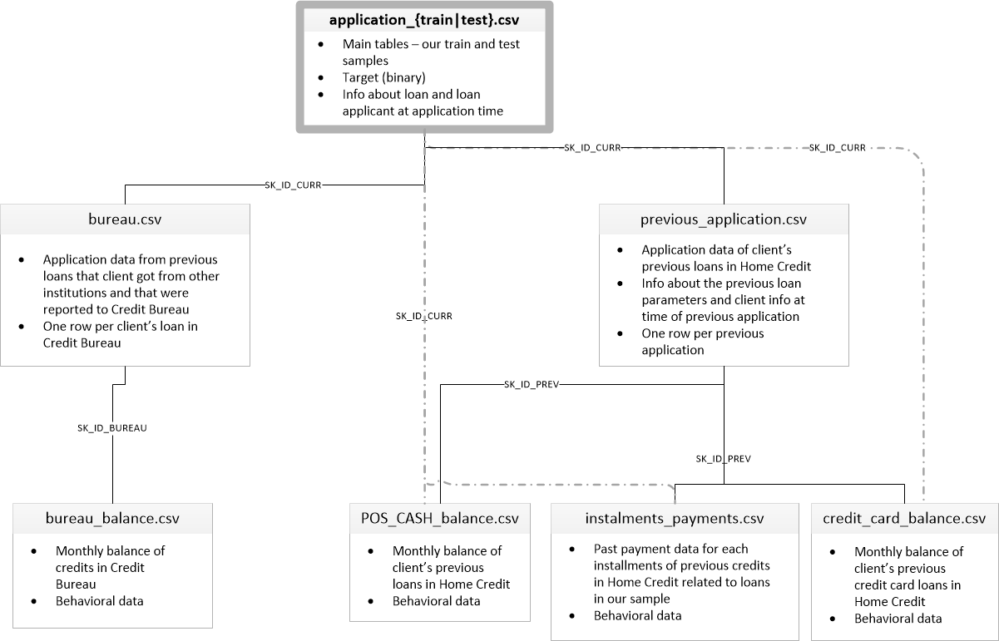

## Downloading the files via Kaggle API

Create a base directory:

```bash
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
```

Please download the project data files and data dictionary and unzip them using either of the following approaches:

1. Click on the `Download` button on the following [Data Webpage](https://www.kaggle.com/c/home-credit-default-risk/data) and unzip the  zip file to the `BASE_DIR`
2. If you plan to use the Kaggle API, please use the following steps.


In [8]:
DATA_DIR = "../Data/home-credit-default-risk"   #same level as course repo in the data directory
#DATA_DIR = os.path.join('./ddddd/')
!mkdir -p $DATA_DIR

In [9]:
!ls -l $DATA_DIR

total 6652136
-rw-rw-r--@ 1 saisathwikreddyvarikoti  staff      37383 Dec 11  2019 HomeCredit_columns_description.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff  392703158 Dec 11  2019 POS_CASH_balance.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff   26567651 Dec 11  2019 application_test.csv
-rw-rw-r--@ 1 saisathwikreddyvarikoti  staff  166133370 Dec 11  2019 application_train.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff  170016717 Dec 11  2019 bureau.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff  375592889 Dec 11  2019 bureau_balance.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff  424582605 Dec 11  2019 credit_card_balance.csv
-rw-r--r--@ 1 saisathwikreddyvarikoti  staff  721616255 Nov 12 18:01 home-credit-default-risk.zip
-rw-rw-r--  1 saisathwikreddyvarikoti  staff  723118349 Dec 11  2019 installments_payments.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff  404973293 Dec 11  2019 previous_application.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff     536202 Dec 11 

In [10]:
!chmod 755 $DATA_DIR

In [11]:
data_not_downloaded = False # change it to false if you already have data
if data_not_downloaded:
    ! kaggle competitions download -c home-credit-default-risk -p $DATA_DIR --force

In [12]:
!pwd 

/Users/saisathwikreddyvarikoti/Documents/Courses/Sem 1/Applied-Machine-Learning/I526_AML_Student/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2


In [13]:
!ls -l $DATA_DIR

total 6652136
-rw-rw-r--@ 1 saisathwikreddyvarikoti  staff      37383 Dec 11  2019 HomeCredit_columns_description.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff  392703158 Dec 11  2019 POS_CASH_balance.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff   26567651 Dec 11  2019 application_test.csv
-rw-rw-r--@ 1 saisathwikreddyvarikoti  staff  166133370 Dec 11  2019 application_train.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff  170016717 Dec 11  2019 bureau.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff  375592889 Dec 11  2019 bureau_balance.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff  424582605 Dec 11  2019 credit_card_balance.csv
-rw-r--r--@ 1 saisathwikreddyvarikoti  staff  721616255 Nov 12 18:01 home-credit-default-risk.zip
-rw-rw-r--  1 saisathwikreddyvarikoti  staff  723118349 Dec 11  2019 installments_payments.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff  404973293 Dec 11  2019 previous_application.csv
-rw-rw-r--  1 saisathwikreddyvarikoti  staff     536202 Dec 11 

In [14]:
#!rm -r  DATA_DIR

### Imports

In [15]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

In [16]:
unzippingReq = True #True
if unzippingReq: #please modify this code 
    zip_ref = zipfile.ZipFile(f'{DATA_DIR}/home-credit-default-risk.zip', 'r')
    # extractall():  Extract all members from the archive to the current working directory. path specifies a different directory to extract to
    zip_ref.extractall('{DATA_DIR}') 
    zip_ref.close()


## Data files overview
### Data Dictionary

As part of the data download comes a  Data Dictionary. It named `HomeCredit_columns_description.csv`

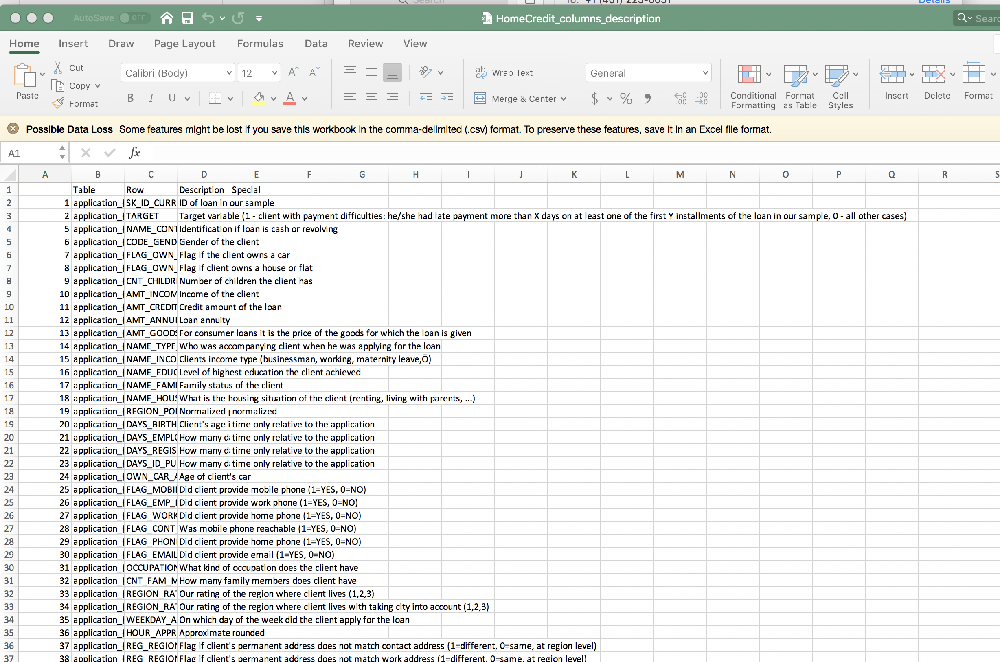

### Application train

In [17]:
ls -l ../Data/home-credit-default-risk/application_train.csv

-rw-rw-r--@ 1 saisathwikreddyvarikoti  staff  166133370 Dec 11  2019 ../Data/home-credit-default-risk/application_train.csv


In [18]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

# lets store the datasets in a dictionary so we can keep track of them easily
def load_data(in_path, name):
    df = pd.read_csv(in_path)
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    return df

datasets={}  # lets store the datasets in a dictionary so we can keep track of them easily
ds_name = 'application_train'
# DATA_DIR=f"{DATA_DIR}/home-credit-default-risk/"
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

datasets['application_train'].shape

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


(307511, 122)

In [19]:
DATA_DIR

'../Data/home-credit-default-risk'

### Application test


* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.


In [20]:
ds_name = 'application_test'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


The application dataset has the most information about the client: Gender, income, family status, education ...

### The Other datasets

* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [21]:
%%time
ds_names = ("application_train", "application_test", "bureau","bureau_balance","credit_card_balance","installments_payments",
            "previous_application","POS_CASH_balance")

for ds_name in ds_names:
    datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)


application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


bureau: shape is (1716428, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


bureau_balance: shape is (27299925, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB
None


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


credit_card_balance: shape is (3840312, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_C

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


installments_payments: shape is (13605401, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


previous_application: shape is (1670214, 37)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 1

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


POS_CASH_balance: shape is (10001358, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


CPU times: user 26.5 s, sys: 6.25 s, total: 32.7 s
Wall time: 34.7 s


## Dataset Size

In [22]:
for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')


dataset application_train       : [    307,511, 122]
dataset application_test        : [     48,744, 121]
dataset bureau                  : [  1,716,428, 17]
dataset bureau_balance          : [ 27,299,925, 3]
dataset credit_card_balance     : [  3,840,312, 23]
dataset installments_payments   : [ 13,605,401, 8]
dataset previous_application    : [  1,670,214, 37]
dataset POS_CASH_balance        : [ 10,001,358, 8]


# Exploratory Data Analysis

## Plot Function for Missing Values

In [23]:
def plot_missing_data(df, x, y):
    g=sns.displot(
        data = datasets[df].isna().melt(value_name="missing"),
        y="variable",
        hue="missing",
        multiple="fill",
        aspect=1.25
    )
    g.fig.set_figwidth(x)
    g.fig.set_figheight(y)

## Summary of Application train

In [24]:
datasets["application_train"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [25]:
datasets["application_train"].columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

In [26]:
datasets["application_train"].dtypes

SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object

In [27]:
datasets["application_train"].describe() #numerical only features

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [28]:
datasets["application_train"].describe(include='all') #look at all categorical and numerical

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511,307511,307511,307511,307511.000000,3.075110e+05,3.075110e+05,307499.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,278232,202448,202924,213312,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,278180.518577,0.080729,NaN,NaN,NaN,NaN,0.417052,1.687979e+05,5.990260e+05,27108.573909,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,NaN,NaN,NaN,NaN,0.722121,2.371231e+05,4.024908e+05,14493.737315,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,2.565000e+04,4.500000e+04,1615.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.125000e+05,2.700000e+05,16524.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.471500e+05,5.135310e+05,24903.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,NaN,NaN,NaN,NaN,1.000000,2.025000e+05,8.086500e+05,34596.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000


In [29]:
datasets["application_train"].corr()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,1.000000,-0.002108,-0.001129,-0.001820,-0.000343,-0.000433,-0.000232,0.000849,-0.001500,0.001366,...,0.000509,0.000167,0.001073,0.000282,-0.002672,-0.002193,0.002099,0.000485,0.001025,0.004659
TARGET,-0.002108,1.000000,0.019187,-0.003982,-0.030369,-0.012817,-0.039645,-0.037227,0.078239,-0.044932,...,-0.007952,-0.001358,0.000215,0.003709,0.000930,0.002704,0.000788,-0.012462,-0.002022,0.019930
CNT_CHILDREN,-0.001129,0.019187,1.000000,0.012882,0.002145,0.021374,-0.001827,-0.025573,0.330938,-0.239818,...,0.004031,0.000864,0.000988,-0.002450,-0.000410,-0.000366,-0.002436,-0.010808,-0.007836,-0.041550
AMT_INCOME_TOTAL,-0.001820,-0.003982,0.012882,1.000000,0.156870,0.191657,0.159610,0.074796,0.027261,-0.064223,...,0.003130,0.002408,0.000242,-0.000589,0.000709,0.002944,0.002387,0.024700,0.004859,0.011690
AMT_CREDIT,-0.000343,-0.030369,0.002145,0.156870,1.000000,0.770138,0.986968,0.099738,-0.055436,-0.066838,...,0.034329,0.021082,0.031023,-0.016148,-0.003906,0.004238,-0.001275,0.054451,0.015925,-0.048448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AMT_REQ_CREDIT_BUREAU_DAY,-0.002193,0.002704,-0.000366,0.002944,0.004238,0.002185,0.004677,0.001399,0.002255,0.000472,...,0.013281,0.001126,-0.000120,-0.001130,0.230374,1.000000,0.217412,-0.005258,-0.004416,-0.003355
AMT_REQ_CREDIT_BUREAU_WEEK,0.002099,0.000788,-0.002436,0.002387,-0.001275,0.013881,-0.001007,-0.002149,-0.001336,0.003072,...,-0.004640,-0.001275,-0.001770,0.000081,0.004706,0.217412,1.000000,-0.014096,-0.015115,0.018917
AMT_REQ_CREDIT_BUREAU_MON,0.000485,-0.012462,-0.010808,0.024700,0.054451,0.039148,0.056422,0.078607,0.001372,-0.034457,...,-0.001565,-0.002729,0.001285,-0.003612,-0.000018,-0.005258,-0.014096,1.000000,-0.007789,-0.004975
AMT_REQ_CREDIT_BUREAU_QRT,0.001025,-0.002022,-0.007836,0.004859,0.015925,0.010124,0.016432,-0.001279,-0.011799,0.015345,...,-0.005125,-0.001575,-0.001010,-0.002004,-0.002716,-0.004416,-0.015115,-0.007789,1.000000,0.076208


### Missing data for application train

In [30]:
percent = (datasets["application_train"].isnull().sum()/datasets["application_train"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_train"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
missing_application_train_data.head(20)

,Percent,Train Missing Count
COMMONAREA_MEDI,69.87,214865
COMMONAREA_AVG,69.87,214865
COMMONAREA_MODE,69.87,214865
NONLIVINGAPARTMENTS_MODE,69.43,213514
NONLIVINGAPARTMENTS_AVG,69.43,213514
NONLIVINGAPARTMENTS_MEDI,69.43,213514
FONDKAPREMONT_MODE,68.39,210295
LIVINGAPARTMENTS_MODE,68.35,210199
LIVINGAPARTMENTS_AVG,68.35,210199
LIVINGAPARTMENTS_MEDI,68.35,210199


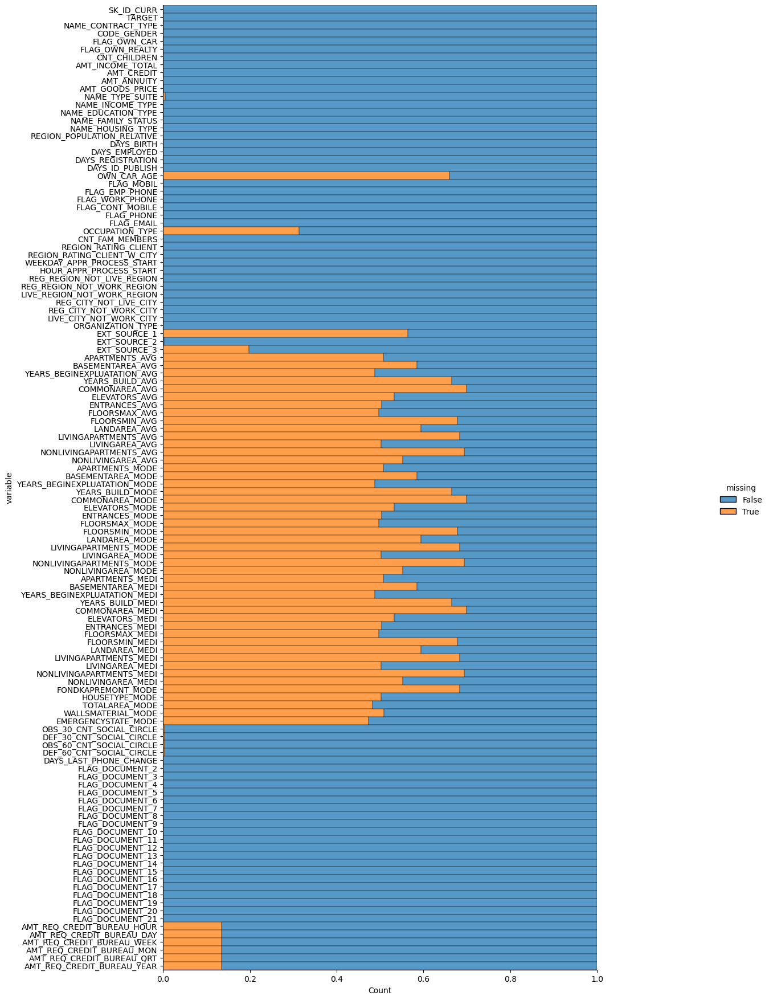

In [31]:
plot_missing_data("application_train", 18, 20)

## Summary of Application test

In [32]:
datasets["application_test"].info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB


In [33]:
datasets["application_test"].columns

Index(['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=121)

In [34]:
datasets["application_test"].dtypes

SK_ID_CURR                      int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
FLAG_OWN_REALTY                object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 121, dtype: object

In [35]:
datasets["application_test"].describe() #numerical only features

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [36]:
datasets["application_test"].describe(include='all') 

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744,48744,48744,48744,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
unique,NaN,2,2,2,2,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,48305,32678,32311,33658,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,277796.676350,NaN,NaN,NaN,NaN,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,NaN,NaN,NaN,NaN,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,NaN,NaN,NaN,NaN,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,NaN,NaN,NaN,NaN,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,NaN,NaN,NaN,NaN,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,NaN,NaN,NaN,NaN,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000


In [37]:
datasets["application_test"].corr()

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,1.000000,0.000635,0.001278,0.005014,0.007112,0.005097,0.003324,0.002325,-0.000845,0.001032,...,-0.006286,NaN,NaN,NaN,-0.000307,0.001083,0.001178,0.000430,-0.002092,0.003457
CNT_CHILDREN,0.000635,1.000000,0.038962,0.027840,0.056770,0.025507,-0.015231,0.317877,-0.238319,0.175054,...,-0.000862,NaN,NaN,NaN,0.006362,0.001539,0.007523,-0.008337,0.029006,-0.039265
AMT_INCOME_TOTAL,0.001278,0.038962,1.000000,0.396572,0.457833,0.401995,0.199773,0.054400,-0.154619,0.067973,...,-0.006624,NaN,NaN,NaN,0.010227,0.004989,-0.002867,0.008691,0.007410,0.003281
AMT_CREDIT,0.005014,0.027840,0.396572,1.000000,0.777733,0.988056,0.135694,-0.046169,-0.083483,0.030740,...,-0.000197,NaN,NaN,NaN,-0.001092,0.004882,0.002904,-0.000156,-0.007750,-0.034533
AMT_ANNUITY,0.007112,0.056770,0.457833,0.777733,1.000000,0.787033,0.150864,0.047859,-0.137772,0.064450,...,-0.010762,NaN,NaN,NaN,0.008428,0.006681,0.003085,0.005695,0.012443,-0.044901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AMT_REQ_CREDIT_BUREAU_DAY,0.001083,0.001539,0.004989,0.004882,0.006681,0.004865,-0.011773,-0.000386,-0.000785,-0.000152,...,-0.001515,NaN,NaN,NaN,0.151506,1.000000,0.035567,0.005877,0.006509,0.002002
AMT_REQ_CREDIT_BUREAU_WEEK,0.001178,0.007523,-0.002867,0.002904,0.003085,0.003358,-0.008321,0.012422,-0.014058,0.008692,...,0.009205,NaN,NaN,NaN,-0.002345,0.035567,1.000000,0.054291,0.024957,-0.000252
AMT_REQ_CREDIT_BUREAU_MON,0.000430,-0.008337,0.008691,-0.000156,0.005695,-0.000254,0.000105,0.014094,-0.013891,0.007414,...,-0.003248,NaN,NaN,NaN,0.023510,0.005877,0.054291,1.000000,0.005446,0.026118
AMT_REQ_CREDIT_BUREAU_QRT,-0.002092,0.029006,0.007410,-0.007750,0.012443,-0.008490,-0.026650,0.088752,-0.044351,0.046011,...,-0.010480,NaN,NaN,NaN,-0.003075,0.006509,0.024957,0.005446,1.000000,-0.013081


### Missing data for Application test

In [38]:
percent = (datasets["application_test"].isnull().sum()/datasets["application_test"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_test"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

,Percent,Test Missing Count
COMMONAREA_AVG,68.72,33495
COMMONAREA_MODE,68.72,33495
COMMONAREA_MEDI,68.72,33495
NONLIVINGAPARTMENTS_AVG,68.41,33347
NONLIVINGAPARTMENTS_MODE,68.41,33347
NONLIVINGAPARTMENTS_MEDI,68.41,33347
FONDKAPREMONT_MODE,67.28,32797
LIVINGAPARTMENTS_AVG,67.25,32780
LIVINGAPARTMENTS_MODE,67.25,32780
LIVINGAPARTMENTS_MEDI,67.25,32780


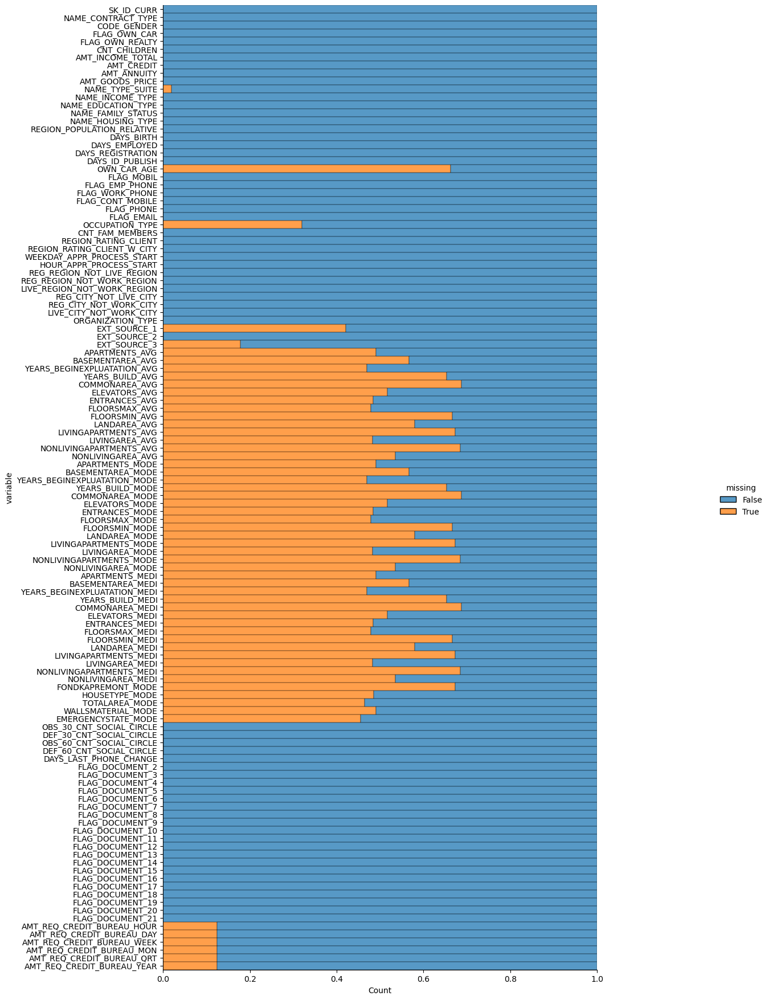

In [39]:
plot_missing_data("application_test", 18, 20)

## Summary of Bureau

In [40]:
datasets["bureau"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB


In [41]:
datasets["bureau"].columns

Index(['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
       'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE',
       'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY'],
      dtype='object')

In [42]:
datasets["bureau"].dtypes

SK_ID_CURR                  int64
SK_ID_BUREAU                int64
CREDIT_ACTIVE              object
CREDIT_CURRENCY            object
DAYS_CREDIT                 int64
CREDIT_DAY_OVERDUE          int64
DAYS_CREDIT_ENDDATE       float64
DAYS_ENDDATE_FACT         float64
AMT_CREDIT_MAX_OVERDUE    float64
CNT_CREDIT_PROLONG          int64
AMT_CREDIT_SUM            float64
AMT_CREDIT_SUM_DEBT       float64
AMT_CREDIT_SUM_LIMIT      float64
AMT_CREDIT_SUM_OVERDUE    float64
CREDIT_TYPE                object
DAYS_CREDIT_UPDATE          int64
AMT_ANNUITY               float64
dtype: object

In [43]:
datasets["bureau"].describe()

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1.716428e+06,4.896370e+05
mean,2.782149e+05,5.924434e+06,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,-5.937483e+02,1.571276e+04
std,1.029386e+05,5.322657e+05,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,7.207473e+02,3.258269e+05
min,1.000010e+05,5.000000e+06,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,-3.300000e+01,1.350000e+04
max,4.562550e+05,6.843457e+06,0.000000e+00,2.792000e+03,3.119900e+04,0.000000e+00,1.159872e+08,9.000000e+00,5.850000e+08,1.701000e+08,4.705600e+06,3.756681e+06,3.720000e+02,1.184534e+08


In [44]:
datasets["bureau"].describe(include="all")

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1716428,1716428,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1716428,1.716428e+06,4.896370e+05
unique,NaN,NaN,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,NaN,NaN
top,NaN,NaN,Closed,currency 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumer credit,NaN,NaN
freq,NaN,NaN,1079273,1715020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1251615,NaN,NaN
mean,2.782149e+05,5.924434e+06,NaN,NaN,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,NaN,-5.937483e+02,1.571276e+04
std,1.029386e+05,5.322657e+05,NaN,NaN,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,NaN,7.207473e+02,3.258269e+05
min,1.000010e+05,5.000000e+06,NaN,NaN,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,NaN,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,NaN,NaN,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,NaN,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,NaN,NaN,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,NaN,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,NaN,NaN,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,NaN,-3.300000e+01,1.350000e+04


In [45]:
datasets["bureau"].corr()

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
SK_ID_CURR,1.000000,0.000135,0.000266,0.000283,0.000456,-0.000648,0.001329,-0.000388,0.001179,-0.000790,-0.000304,-0.000014,0.000510,-0.002727
SK_ID_BUREAU,0.000135,1.000000,0.013015,-0.002628,0.009107,0.017890,0.002290,-0.000740,0.007962,0.005732,-0.003986,-0.000499,0.019398,0.001799
DAYS_CREDIT,0.000266,0.013015,1.000000,-0.027266,0.225682,0.875359,-0.014724,-0.030460,0.050883,0.135397,0.025140,-0.000383,0.688771,0.005676
CREDIT_DAY_OVERDUE,0.000283,-0.002628,-0.027266,1.000000,-0.007352,-0.008637,0.001249,0.002756,-0.003292,-0.002355,-0.000345,0.090951,-0.018461,-0.000339
DAYS_CREDIT_ENDDATE,0.000456,0.009107,0.225682,-0.007352,1.000000,0.248825,0.000577,0.113683,0.055424,0.081298,0.095421,0.001077,0.248525,0.000475
DAYS_ENDDATE_FACT,-0.000648,0.017890,0.875359,-0.008637,0.248825,1.000000,0.000999,0.012017,0.059096,0.019609,0.019476,-0.000332,0.751294,0.006274
AMT_CREDIT_MAX_OVERDUE,0.001329,0.002290,-0.014724,0.001249,0.000577,0.000999,1.000000,0.001523,0.081663,0.014007,-0.000112,0.015036,-0.000749,0.001578
CNT_CREDIT_PROLONG,-0.000388,-0.000740,-0.030460,0.002756,0.113683,0.012017,0.001523,1.000000,-0.008345,-0.001366,0.073805,0.000002,0.017864,-0.000465
AMT_CREDIT_SUM,0.001179,0.007962,0.050883,-0.003292,0.055424,0.059096,0.081663,-0.008345,1.000000,0.683419,0.003756,0.006342,0.104629,0.049146
AMT_CREDIT_SUM_DEBT,-0.000790,0.005732,0.135397,-0.002355,0.081298,0.019609,0.014007,-0.001366,0.683419,1.000000,-0.018215,0.008046,0.141235,0.025507


### Missing data for Bureau

In [46]:
percent = (datasets["bureau"].isnull().sum()/datasets["bureau"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["bureau"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

,Percent,Test Missing Count
AMT_ANNUITY,71.47,1226791
AMT_CREDIT_MAX_OVERDUE,65.51,1124488
DAYS_ENDDATE_FACT,36.92,633653
AMT_CREDIT_SUM_LIMIT,34.48,591780
AMT_CREDIT_SUM_DEBT,15.01,257669
DAYS_CREDIT_ENDDATE,6.15,105553
AMT_CREDIT_SUM,0.00,13
CREDIT_ACTIVE,0.00,0
CREDIT_CURRENCY,0.00,0
DAYS_CREDIT,0.00,0


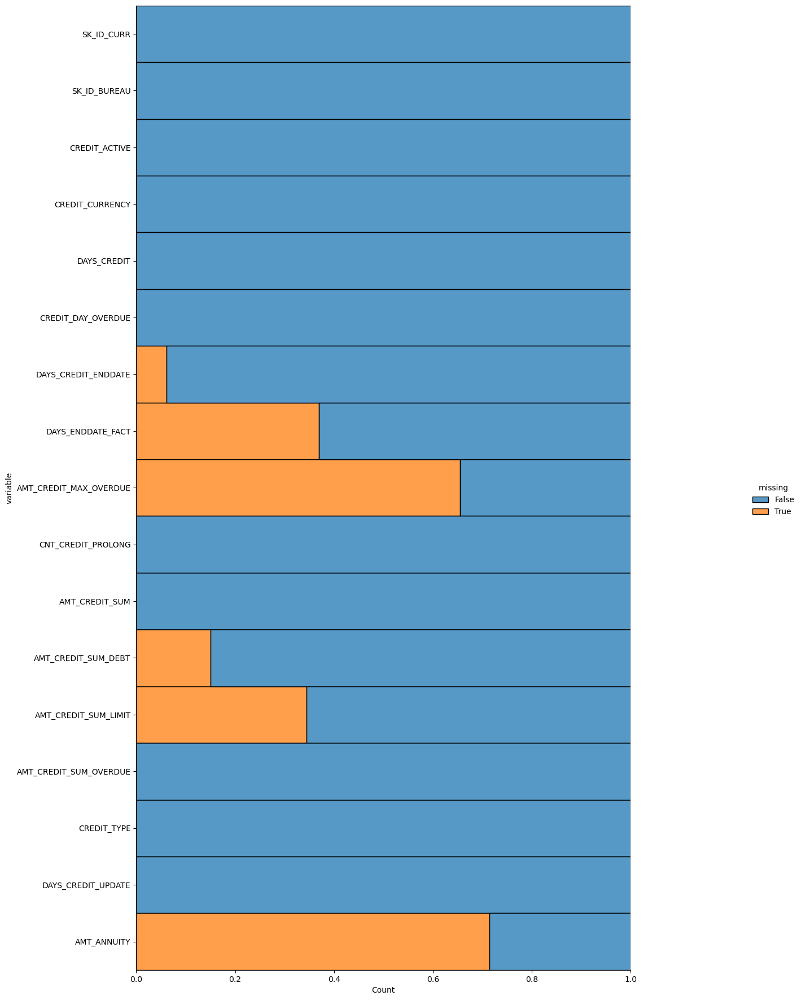

In [47]:
plot_missing_data("bureau",18,20)

## Summary of Bureau Balance

In [48]:
datasets["bureau_balance"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


In [49]:
datasets["bureau_balance"].columns

Index(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS'], dtype='object')

In [50]:
datasets["bureau_balance"].dtypes

SK_ID_BUREAU       int64
MONTHS_BALANCE     int64
STATUS            object
dtype: object

In [51]:
datasets["bureau_balance"].describe()

,SK_ID_BUREAU,MONTHS_BALANCE
count,2.729992e+07,2.729992e+07
mean,6.036297e+06,-3.074169e+01
std,4.923489e+05,2.386451e+01
min,5.001709e+06,-9.600000e+01
25%,5.730933e+06,-4.600000e+01
50%,6.070821e+06,-2.500000e+01
75%,6.431951e+06,-1.100000e+01
max,6.842888e+06,0.000000e+00


In [52]:
datasets["bureau_balance"].describe(include='all')

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
count,2.729992e+07,2.729992e+07,27299925
unique,NaN,NaN,8
top,NaN,NaN,C
freq,NaN,NaN,13646993
mean,6.036297e+06,-3.074169e+01,NaN
std,4.923489e+05,2.386451e+01,NaN
min,5.001709e+06,-9.600000e+01,NaN
25%,5.730933e+06,-4.600000e+01,NaN
50%,6.070821e+06,-2.500000e+01,NaN
75%,6.431951e+06,-1.100000e+01,NaN


In [53]:
datasets["bureau_balance"].corr()

,SK_ID_BUREAU,MONTHS_BALANCE
SK_ID_BUREAU,1.000000,0.011873
MONTHS_BALANCE,0.011873,1.000000


### Missing Data for Bureau Balance

In [54]:
percent = (datasets["bureau_balance"].isnull().sum()/datasets["bureau_balance"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["bureau_balance"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

,Percent,Test Missing Count
SK_ID_BUREAU,0.0,0
MONTHS_BALANCE,0.0,0
STATUS,0.0,0


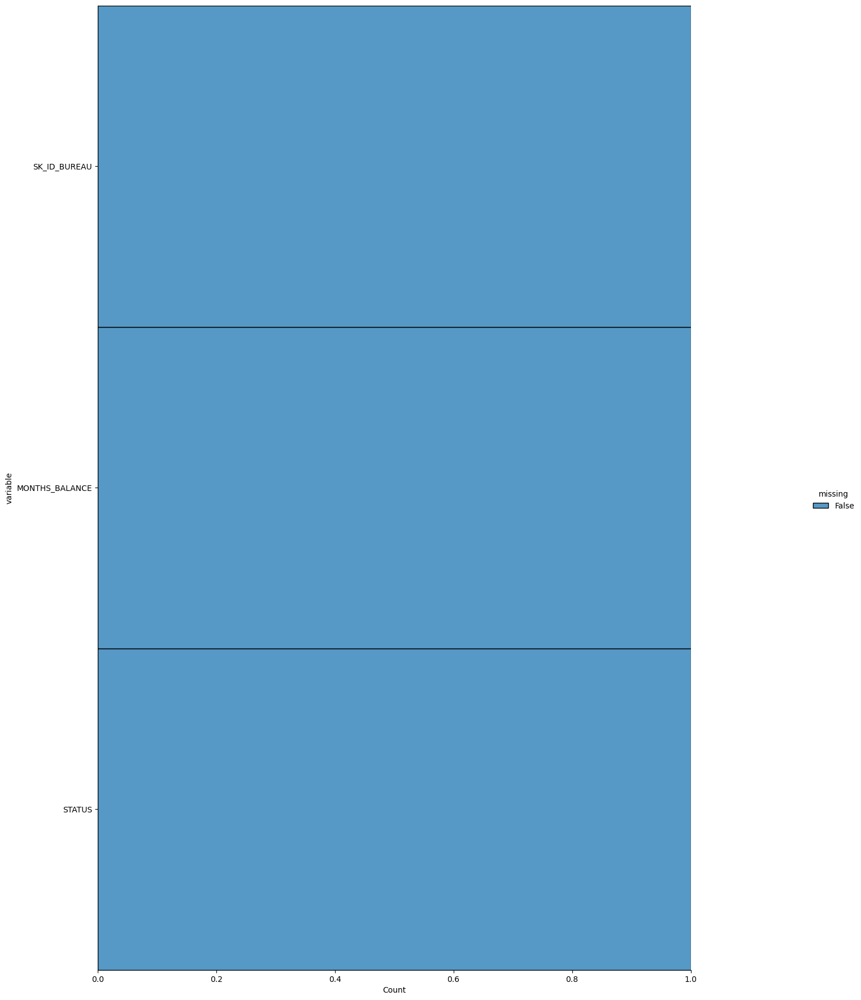

In [55]:
plot_missing_data("bureau_balance",18,20)

## Summary of POS_CASH_balance

In [56]:
datasets["POS_CASH_balance"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB


In [57]:
datasets["POS_CASH_balance"].columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')

In [58]:
datasets["POS_CASH_balance"].dtypes

SK_ID_PREV                 int64
SK_ID_CURR                 int64
MONTHS_BALANCE             int64
CNT_INSTALMENT           float64
CNT_INSTALMENT_FUTURE    float64
NAME_CONTRACT_STATUS      object
SK_DPD                     int64
SK_DPD_DEF                 int64
dtype: object

In [59]:
datasets["POS_CASH_balance"].describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,1.000136e+07,1.000136e+07,1.000136e+07,9.975287e+06,9.975271e+06,1.000136e+07,1.000136e+07
mean,1.903217e+06,2.784039e+05,-3.501259e+01,1.708965e+01,1.048384e+01,1.160693e+01,6.544684e-01
std,5.358465e+05,1.027637e+05,2.606657e+01,1.199506e+01,1.110906e+01,1.327140e+02,3.276249e+01
min,1.000001e+06,1.000010e+05,-9.600000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.434405e+06,1.895500e+05,-5.400000e+01,1.000000e+01,3.000000e+00,0.000000e+00,0.000000e+00
50%,1.896565e+06,2.786540e+05,-2.800000e+01,1.200000e+01,7.000000e+00,0.000000e+00,0.000000e+00
75%,2.368963e+06,3.674290e+05,-1.300000e+01,2.400000e+01,1.400000e+01,0.000000e+00,0.000000e+00
max,2.843499e+06,4.562550e+05,-1.000000e+00,9.200000e+01,8.500000e+01,4.231000e+03,3.595000e+03


In [60]:
datasets["POS_CASH_balance"].describe(include='all')

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
count,1.000136e+07,1.000136e+07,1.000136e+07,9.975287e+06,9.975271e+06,10001358,1.000136e+07,1.000136e+07
unique,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,Active,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,9151119,NaN,NaN
mean,1.903217e+06,2.784039e+05,-3.501259e+01,1.708965e+01,1.048384e+01,NaN,1.160693e+01,6.544684e-01
std,5.358465e+05,1.027637e+05,2.606657e+01,1.199506e+01,1.110906e+01,NaN,1.327140e+02,3.276249e+01
min,1.000001e+06,1.000010e+05,-9.600000e+01,1.000000e+00,0.000000e+00,NaN,0.000000e+00,0.000000e+00
25%,1.434405e+06,1.895500e+05,-5.400000e+01,1.000000e+01,3.000000e+00,NaN,0.000000e+00,0.000000e+00
50%,1.896565e+06,2.786540e+05,-2.800000e+01,1.200000e+01,7.000000e+00,NaN,0.000000e+00,0.000000e+00
75%,2.368963e+06,3.674290e+05,-1.300000e+01,2.400000e+01,1.400000e+01,NaN,0.000000e+00,0.000000e+00


In [61]:
datasets["POS_CASH_balance"].corr()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
SK_ID_PREV,1.000000,-0.000336,0.001835,0.003820,0.003679,-0.000487,0.004848
SK_ID_CURR,-0.000336,1.000000,0.000404,0.000144,-0.000559,0.003118,0.001948
MONTHS_BALANCE,0.001835,0.000404,1.000000,0.336163,0.271595,-0.018939,-0.000381
CNT_INSTALMENT,0.003820,0.000144,0.336163,1.000000,0.871276,-0.060803,-0.014154
CNT_INSTALMENT_FUTURE,0.003679,-0.000559,0.271595,0.871276,1.000000,-0.082004,-0.017436
SK_DPD,-0.000487,0.003118,-0.018939,-0.060803,-0.082004,1.000000,0.245782
SK_DPD_DEF,0.004848,0.001948,-0.000381,-0.014154,-0.017436,0.245782,1.000000


### Missing values for POS_CASH_balance

In [62]:
percent = (datasets["POS_CASH_balance"].isnull().sum()/datasets["POS_CASH_balance"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["POS_CASH_balance"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

,Percent,Test Missing Count
CNT_INSTALMENT_FUTURE,0.26,26087
CNT_INSTALMENT,0.26,26071
SK_ID_PREV,0.00,0
SK_ID_CURR,0.00,0
MONTHS_BALANCE,0.00,0
NAME_CONTRACT_STATUS,0.00,0
SK_DPD,0.00,0
SK_DPD_DEF,0.00,0


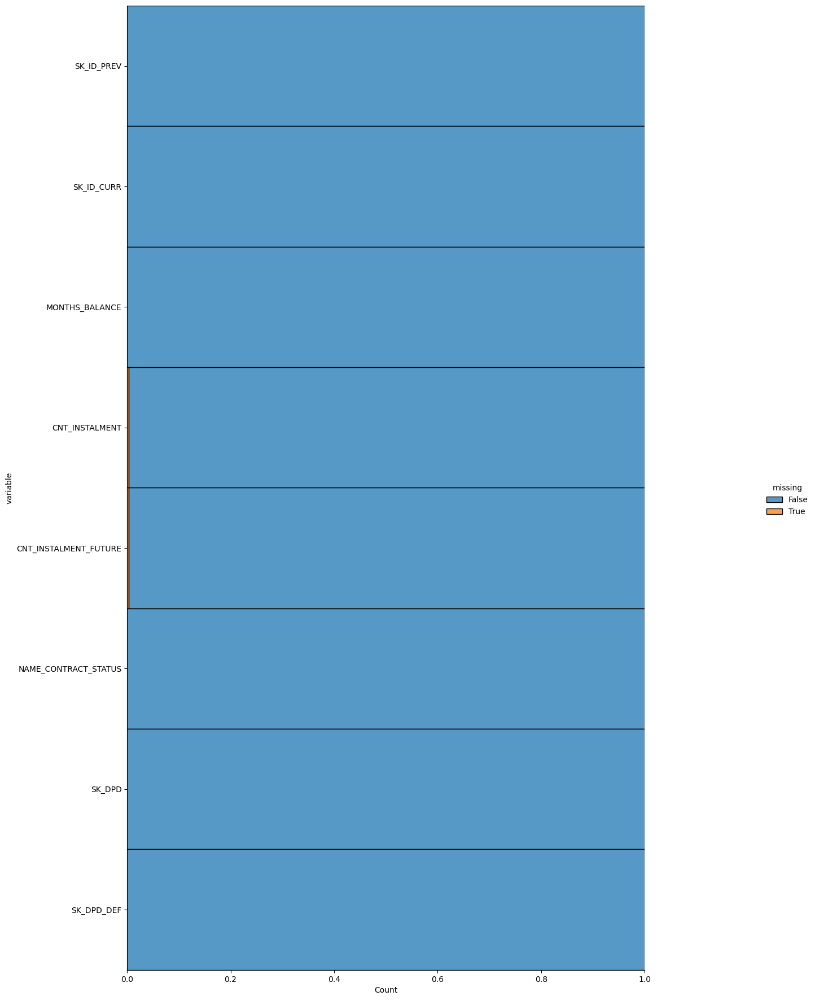

In [63]:
plot_missing_data("POS_CASH_balance",18,20)

## Summary of credit_card_balance

In [64]:
datasets["credit_card_balance"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_CURRENT    float64
 19  CNT_INSTALMENT_MATURE

In [65]:
datasets["credit_card_balance"].columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')

In [66]:
datasets["credit_card_balance"].dtypes

SK_ID_PREV                      int64
SK_ID_CURR                      int64
MONTHS_BALANCE                  int64
AMT_BALANCE                   float64
AMT_CREDIT_LIMIT_ACTUAL         int64
AMT_DRAWINGS_ATM_CURRENT      float64
AMT_DRAWINGS_CURRENT          float64
AMT_DRAWINGS_OTHER_CURRENT    float64
AMT_DRAWINGS_POS_CURRENT      float64
AMT_INST_MIN_REGULARITY       float64
AMT_PAYMENT_CURRENT           float64
AMT_PAYMENT_TOTAL_CURRENT     float64
AMT_RECEIVABLE_PRINCIPAL      float64
AMT_RECIVABLE                 float64
AMT_TOTAL_RECEIVABLE          float64
CNT_DRAWINGS_ATM_CURRENT      float64
CNT_DRAWINGS_CURRENT            int64
CNT_DRAWINGS_OTHER_CURRENT    float64
CNT_DRAWINGS_POS_CURRENT      float64
CNT_INSTALMENT_MATURE_CUM     float64
NAME_CONTRACT_STATUS           object
SK_DPD                          int64
SK_DPD_DEF                      int64
dtype: object

In [67]:
datasets["credit_card_balance"].describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF
count,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,...,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,3.840312e+06,3.840312e+06
mean,1.904504e+06,2.783242e+05,-3.452192e+01,5.830016e+04,1.538080e+05,5.961325e+03,7.433388e+03,2.881696e+02,2.968805e+03,3.540204e+03,...,5.596588e+04,5.808881e+04,5.809829e+04,3.094490e-01,7.031439e-01,4.812496e-03,5.594791e-01,2.082508e+01,9.283667e+00,3.316220e-01
std,5.364695e+05,1.027045e+05,2.666775e+01,1.063070e+05,1.651457e+05,2.822569e+04,3.384608e+04,8.201989e+03,2.079689e+04,5.600154e+03,...,1.025336e+05,1.059654e+05,1.059718e+05,1.100401e+00,3.190347e+00,8.263861e-02,3.240649e+00,2.005149e+01,9.751570e+01,2.147923e+01
min,1.000018e+06,1.000060e+05,-9.600000e+01,-4.202502e+05,0.000000e+00,-6.827310e+03,-6.211620e+03,0.000000e+00,0.000000e+00,0.000000e+00,...,-4.233058e+05,-4.202502e+05,-4.202502e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.434385e+06,1.895170e+05,-5.500000e+01,0.000000e+00,4.500000e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00,0.000000e+00,0.000000e+00
50%,1.897122e+06,2.783960e+05,-2.800000e+01,0.000000e+00,1.125000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.500000e+01,0.000000e+00,0.000000e+00
75%,2.369328e+06,3.675800e+05,-1.100000e+01,8.904669e+04,1.800000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.633911e+03,...,8.535924e+04,8.889949e+04,8.891451e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.200000e+01,0.000000e+00,0.000000e+00
max,2.843496e+06,4.562500e+05,-1.000000e+00,1.505902e+06,1.350000e+06,2.115000e+06,2.287098e+06,1.529847e+06,2.239274e+06,2.028820e+05,...,1.472317e+06,1.493338e+06,1.493338e+06,5.100000e+01,1.650000e+02,1.200000e+01,1.650000e+02,1.200000e+02,3.260000e+03,3.260000e+03


In [68]:
datasets["credit_card_balance"].describe(include="all")

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
count,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,...,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,3840312,3.840312e+06,3.840312e+06
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Active,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3698436,NaN,NaN
mean,1.904504e+06,2.783242e+05,-3.452192e+01,5.830016e+04,1.538080e+05,5.961325e+03,7.433388e+03,2.881696e+02,2.968805e+03,3.540204e+03,...,5.808881e+04,5.809829e+04,3.094490e-01,7.031439e-01,4.812496e-03,5.594791e-01,2.082508e+01,NaN,9.283667e+00,3.316220e-01
std,5.364695e+05,1.027045e+05,2.666775e+01,1.063070e+05,1.651457e+05,2.822569e+04,3.384608e+04,8.201989e+03,2.079689e+04,5.600154e+03,...,1.059654e+05,1.059718e+05,1.100401e+00,3.190347e+00,8.263861e-02,3.240649e+00,2.005149e+01,NaN,9.751570e+01,2.147923e+01
min,1.000018e+06,1.000060e+05,-9.600000e+01,-4.202502e+05,0.000000e+00,-6.827310e+03,-6.211620e+03,0.000000e+00,0.000000e+00,0.000000e+00,...,-4.202502e+05,-4.202502e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,0.000000e+00,0.000000e+00
25%,1.434385e+06,1.895170e+05,-5.500000e+01,0.000000e+00,4.500000e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00,NaN,0.000000e+00,0.000000e+00
50%,1.897122e+06,2.783960e+05,-2.800000e+01,0.000000e+00,1.125000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.500000e+01,NaN,0.000000e+00,0.000000e+00
75%,2.369328e+06,3.675800e+05,-1.100000e+01,8.904669e+04,1.800000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.633911e+03,...,8.889949e+04,8.891451e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.200000e+01,NaN,0.000000e+00,0.000000e+00


In [69]:
datasets["credit_card_balance"].corr()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF
SK_ID_PREV,1.000000,0.004723,0.003670,0.005046,0.006631,0.004342,0.002624,-0.000160,0.001721,0.006460,...,0.005140,0.005035,0.005032,0.002821,0.000367,-0.001412,0.000809,-0.007219,-0.001786,0.001973
SK_ID_CURR,0.004723,1.000000,0.001696,0.003510,0.005991,0.000814,0.000708,0.000958,-0.000786,0.003300,...,0.003589,0.003518,0.003524,0.002082,0.002654,-0.000131,0.002135,-0.000581,-0.000962,0.001519
MONTHS_BALANCE,0.003670,0.001696,1.000000,0.014558,0.199900,0.036802,0.065527,0.000405,0.118146,-0.087529,...,0.016266,0.013172,0.013084,0.002536,0.113321,-0.026192,0.160207,-0.008620,0.039434,0.001659
AMT_BALANCE,0.005046,0.003510,0.014558,1.000000,0.489386,0.283551,0.336965,0.065366,0.169449,0.896728,...,0.999720,0.999917,0.999897,0.309968,0.259184,0.046563,0.155553,0.005009,-0.046988,0.013009
AMT_CREDIT_LIMIT_ACTUAL,0.006631,0.005991,0.199900,0.489386,1.000000,0.247219,0.263093,0.050579,0.234976,0.467620,...,0.490445,0.488641,0.488598,0.221808,0.204237,0.030051,0.202868,-0.157269,-0.038791,-0.002236
AMT_DRAWINGS_ATM_CURRENT,0.004342,0.000814,0.036802,0.283551,0.247219,1.000000,0.800190,0.017899,0.078971,0.094824,...,0.280402,0.278290,0.278260,0.732907,0.298173,0.013254,0.076083,-0.103721,-0.022044,-0.003360
AMT_DRAWINGS_CURRENT,0.002624,0.000708,0.065527,0.336965,0.263093,0.800190,1.000000,0.236297,0.615591,0.124469,...,0.337117,0.332831,0.332796,0.594361,0.523016,0.140032,0.359001,-0.093491,-0.020606,-0.003137
AMT_DRAWINGS_OTHER_CURRENT,-0.000160,0.000958,0.000405,0.065366,0.050579,0.017899,0.236297,1.000000,0.007382,0.002158,...,0.066108,0.064929,0.064923,0.012008,0.021271,0.575295,0.004458,-0.023013,-0.003693,-0.000568
AMT_DRAWINGS_POS_CURRENT,0.001721,-0.000786,0.118146,0.169449,0.234976,0.078971,0.615591,0.007382,1.000000,0.063562,...,0.173745,0.168974,0.168950,0.072658,0.520123,0.007620,0.542556,-0.106813,-0.015040,-0.002384
AMT_INST_MIN_REGULARITY,0.006460,0.003300,-0.087529,0.896728,0.467620,0.094824,0.124469,0.002158,0.063562,1.000000,...,0.896030,0.897617,0.897587,0.170616,0.148262,0.014360,0.086729,0.064320,-0.061484,-0.005715


### Missing values for credit_card_balance

In [70]:
percent = (datasets["credit_card_balance"].isnull().sum()/datasets["credit_card_balance"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["credit_card_balance"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

,Percent,Test Missing Count
AMT_PAYMENT_CURRENT,20.00,767988
AMT_DRAWINGS_ATM_CURRENT,19.52,749816
CNT_DRAWINGS_POS_CURRENT,19.52,749816
AMT_DRAWINGS_OTHER_CURRENT,19.52,749816
AMT_DRAWINGS_POS_CURRENT,19.52,749816
CNT_DRAWINGS_OTHER_CURRENT,19.52,749816
CNT_DRAWINGS_ATM_CURRENT,19.52,749816
CNT_INSTALMENT_MATURE_CUM,7.95,305236
AMT_INST_MIN_REGULARITY,7.95,305236
SK_ID_PREV,0.00,0


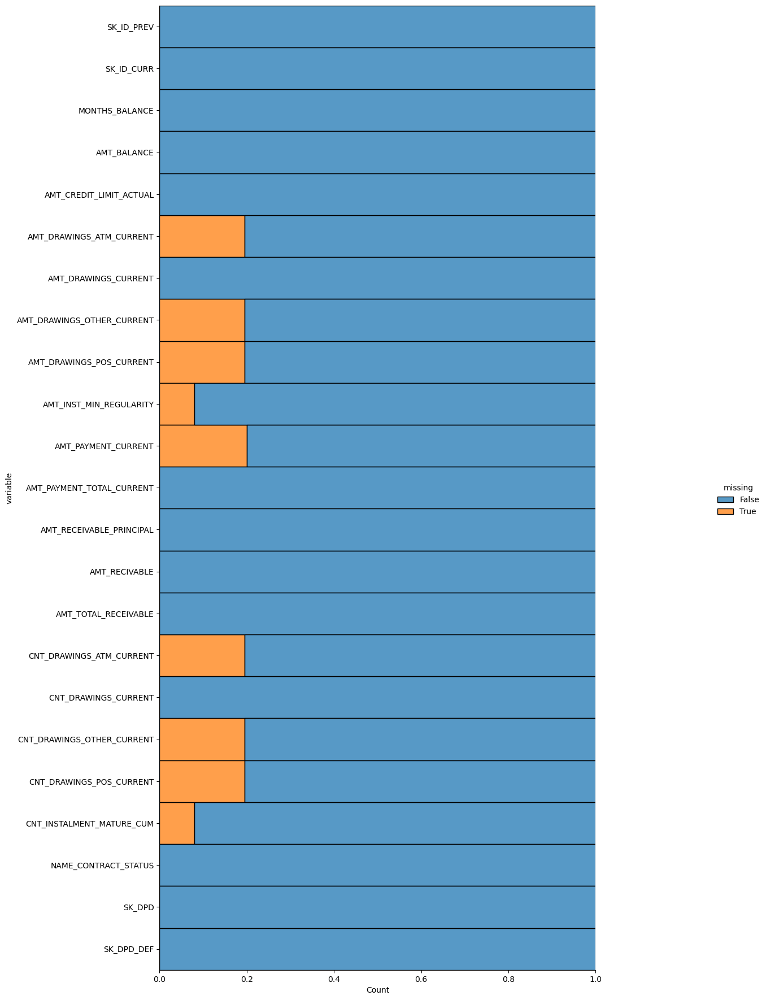

In [71]:
plot_missing_data('credit_card_balance',18,20)

## Summary of previous_application

In [72]:
datasets["previous_application"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [73]:
datasets["previous_application"].columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [74]:
datasets["previous_application"].dtypes

SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

In [75]:
datasets["previous_application"].describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,...,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,...,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,...,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,...,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,...,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,...,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,...,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,...,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [76]:
datasets["previous_application"].describe(include='all')

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1670214,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1670214,1.670214e+06,...,1670214,1.297984e+06,1670214,1669868,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
unique,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,7,NaN,...,11,NaN,5,17,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,NaN,NaN,NaN,NaN,NaN,TUESDAY,NaN,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,747553,NaN,NaN,NaN,NaN,NaN,255118,NaN,...,855720,NaN,517215,285990,NaN,NaN,NaN,NaN,NaN,NaN
mean,1.923089e+06,2.783572e+05,NaN,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,NaN,1.248418e+01,...,NaN,1.605408e+01,NaN,NaN,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,NaN,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,NaN,3.334028e+00,...,NaN,1.456729e+01,NaN,NaN,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,NaN,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,NaN,0.000000e+00,...,NaN,0.000000e+00,NaN,NaN,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,NaN,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,NaN,1.000000e+01,...,NaN,6.000000e+00,NaN,NaN,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,NaN,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,NaN,1.200000e+01,...,NaN,1.200000e+01,NaN,NaN,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,NaN,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,NaN,1.500000e+01,...,NaN,2.400000e+01,NaN,NaN,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000


In [77]:
datasets["previous_application"].corr()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
SK_ID_PREV,1.000000,-0.000321,0.011459,0.003302,0.003659,-0.001313,0.015293,-0.002652,-0.002828,-0.004051,...,-0.022312,0.019100,-0.001079,0.015589,-0.001478,-0.000071,0.001222,0.001915,0.001781,0.003986
SK_ID_CURR,-0.000321,1.000000,0.000577,0.000280,0.000195,-0.000063,0.000369,0.002842,0.000098,0.001158,...,-0.016757,-0.000637,0.001265,0.000031,-0.001329,-0.000757,0.000252,-0.000318,-0.000020,0.000876
AMT_ANNUITY,0.011459,0.000577,1.000000,0.808872,0.816429,0.267694,0.820895,-0.036201,0.020639,-0.103878,...,-0.202335,0.279051,-0.015027,0.394535,0.052839,-0.053295,-0.068877,0.082659,0.068022,0.283080
AMT_APPLICATION,0.003302,0.000280,0.808872,1.000000,0.975824,0.482776,0.999884,-0.014415,0.004310,-0.072479,...,-0.199733,0.133660,-0.007649,0.680630,0.074544,-0.049532,-0.084905,0.172627,0.148618,0.259219
AMT_CREDIT,0.003659,0.000195,0.816429,0.975824,1.000000,0.301284,0.993087,-0.021039,-0.025179,-0.188128,...,-0.205158,0.133763,-0.009567,0.674278,-0.036813,0.002881,0.044031,0.224829,0.214320,0.263932
AMT_DOWN_PAYMENT,-0.001313,-0.000063,0.267694,0.482776,0.301284,1.000000,0.482776,0.016776,0.001597,0.473935,...,-0.115343,-0.024536,0.003533,0.031659,-0.001773,-0.013586,-0.000869,-0.031425,-0.030702,-0.042585
AMT_GOODS_PRICE,0.015293,0.000369,0.820895,0.999884,0.993087,0.482776,1.000000,-0.045267,-0.017100,-0.072479,...,-0.199733,0.290422,-0.015842,0.672129,-0.024445,-0.021062,0.016883,0.211696,0.209296,0.243400
HOUR_APPR_PROCESS_START,-0.002652,0.002842,-0.036201,-0.014415,-0.021039,0.016776,-0.045267,1.000000,0.005789,0.025930,...,-0.045720,-0.039962,0.015671,-0.055511,0.014321,-0.002797,-0.016567,-0.018018,-0.018254,-0.117318
NFLAG_LAST_APPL_IN_DAY,-0.002828,0.000098,0.020639,0.004310,-0.025179,0.001597,-0.017100,0.005789,1.000000,0.004554,...,0.024640,0.016555,0.000912,0.063347,-0.000409,-0.002288,-0.001981,-0.002277,-0.000744,-0.007124
RATE_DOWN_PAYMENT,-0.004051,0.001158,-0.103878,-0.072479,-0.188128,0.473935,-0.072479,0.025930,0.004554,1.000000,...,-0.106143,-0.208742,-0.006489,-0.278875,-0.007969,-0.039178,-0.010934,-0.147562,-0.145461,-0.021633


### Missing values for previous_application

In [78]:
percent = (datasets["previous_application"].isnull().sum()/datasets["previous_application"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["previous_application"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

,Percent,Test Missing Count
RATE_INTEREST_PRIVILEGED,99.64,1664263
RATE_INTEREST_PRIMARY,99.64,1664263
AMT_DOWN_PAYMENT,53.64,895844
RATE_DOWN_PAYMENT,53.64,895844
NAME_TYPE_SUITE,49.12,820405
NFLAG_INSURED_ON_APPROVAL,40.30,673065
DAYS_TERMINATION,40.30,673065
DAYS_LAST_DUE,40.30,673065
DAYS_LAST_DUE_1ST_VERSION,40.30,673065
DAYS_FIRST_DUE,40.30,673065


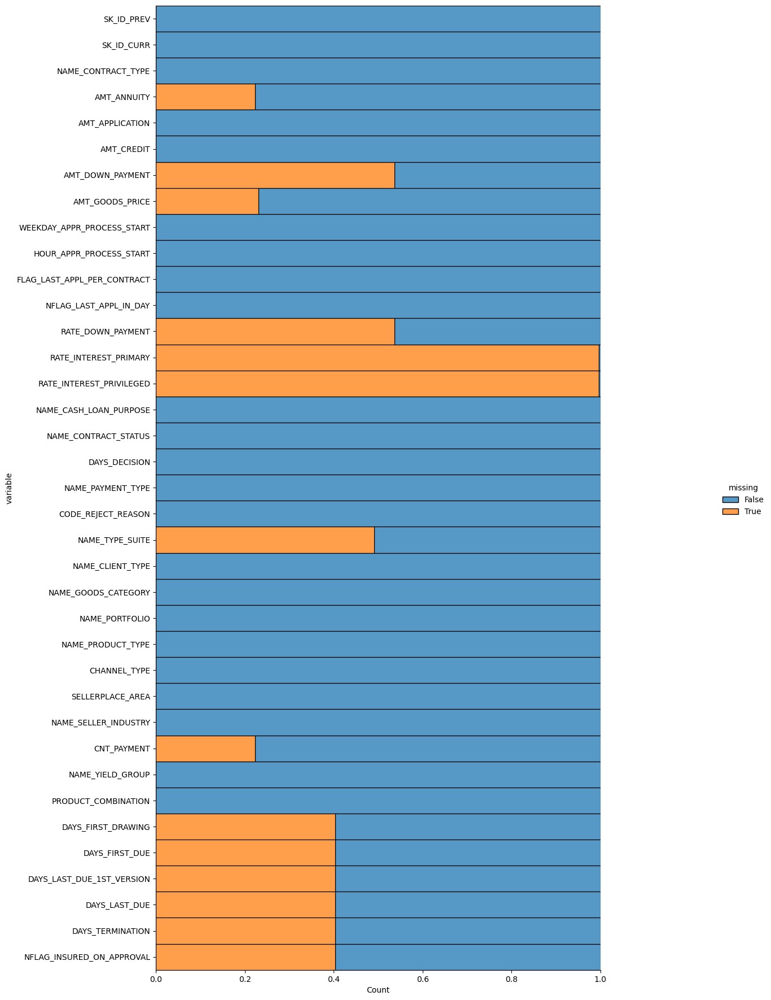

In [79]:
plot_missing_data("previous_application",18,20)

## Summary of installments_payments

In [80]:
datasets["installments_payments"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB


In [81]:
datasets["installments_payments"].columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'],
      dtype='object')

In [82]:
datasets["installments_payments"].dtypes

SK_ID_PREV                  int64
SK_ID_CURR                  int64
NUM_INSTALMENT_VERSION    float64
NUM_INSTALMENT_NUMBER       int64
DAYS_INSTALMENT           float64
DAYS_ENTRY_PAYMENT        float64
AMT_INSTALMENT            float64
AMT_PAYMENT               float64
dtype: object

In [83]:
datasets["installments_payments"].describe()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360250e+07,1.360540e+07,1.360250e+07
mean,1.903365e+06,2.784449e+05,8.566373e-01,1.887090e+01,-1.042270e+03,-1.051114e+03,1.705091e+04,1.723822e+04
std,5.362029e+05,1.027183e+05,1.035216e+00,2.666407e+01,8.009463e+02,8.005859e+02,5.057025e+04,5.473578e+04
min,1.000001e+06,1.000010e+05,0.000000e+00,1.000000e+00,-2.922000e+03,-4.921000e+03,0.000000e+00,0.000000e+00
25%,1.434191e+06,1.896390e+05,0.000000e+00,4.000000e+00,-1.654000e+03,-1.662000e+03,4.226085e+03,3.398265e+03
50%,1.896520e+06,2.786850e+05,1.000000e+00,8.000000e+00,-8.180000e+02,-8.270000e+02,8.884080e+03,8.125515e+03
75%,2.369094e+06,3.675300e+05,1.000000e+00,1.900000e+01,-3.610000e+02,-3.700000e+02,1.671021e+04,1.610842e+04
max,2.843499e+06,4.562550e+05,1.780000e+02,2.770000e+02,-1.000000e+00,-1.000000e+00,3.771488e+06,3.771488e+06


In [84]:
datasets["installments_payments"].describe(include='all')

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360250e+07,1.360540e+07,1.360250e+07
mean,1.903365e+06,2.784449e+05,8.566373e-01,1.887090e+01,-1.042270e+03,-1.051114e+03,1.705091e+04,1.723822e+04
std,5.362029e+05,1.027183e+05,1.035216e+00,2.666407e+01,8.009463e+02,8.005859e+02,5.057025e+04,5.473578e+04
min,1.000001e+06,1.000010e+05,0.000000e+00,1.000000e+00,-2.922000e+03,-4.921000e+03,0.000000e+00,0.000000e+00
25%,1.434191e+06,1.896390e+05,0.000000e+00,4.000000e+00,-1.654000e+03,-1.662000e+03,4.226085e+03,3.398265e+03
50%,1.896520e+06,2.786850e+05,1.000000e+00,8.000000e+00,-8.180000e+02,-8.270000e+02,8.884080e+03,8.125515e+03
75%,2.369094e+06,3.675300e+05,1.000000e+00,1.900000e+01,-3.610000e+02,-3.700000e+02,1.671021e+04,1.610842e+04
max,2.843499e+06,4.562550e+05,1.780000e+02,2.770000e+02,-1.000000e+00,-1.000000e+00,3.771488e+06,3.771488e+06


In [85]:
datasets["installments_payments"].corr()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
SK_ID_PREV,1.000000,0.002132,0.000685,-0.002095,0.003748,0.003734,0.002042,0.001887
SK_ID_CURR,0.002132,1.000000,0.000480,-0.000548,0.001191,0.001215,-0.000226,-0.000124
NUM_INSTALMENT_VERSION,0.000685,0.000480,1.000000,-0.323414,0.130244,0.128124,0.168109,0.177176
NUM_INSTALMENT_NUMBER,-0.002095,-0.000548,-0.323414,1.000000,0.090286,0.094305,-0.089640,-0.087664
DAYS_INSTALMENT,0.003748,0.001191,0.130244,0.090286,1.000000,0.999491,0.125985,0.127018
DAYS_ENTRY_PAYMENT,0.003734,0.001215,0.128124,0.094305,0.999491,1.000000,0.125555,0.126602
AMT_INSTALMENT,0.002042,-0.000226,0.168109,-0.089640,0.125985,0.125555,1.000000,0.937191
AMT_PAYMENT,0.001887,-0.000124,0.177176,-0.087664,0.127018,0.126602,0.937191,1.000000


### Missing values for installments_payments

In [86]:
percent = (datasets["installments_payments"].isnull().sum()/datasets["installments_payments"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["installments_payments"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

,Percent,Test Missing Count
DAYS_ENTRY_PAYMENT,0.02,2905
AMT_PAYMENT,0.02,2905
SK_ID_PREV,0.00,0
SK_ID_CURR,0.00,0
NUM_INSTALMENT_VERSION,0.00,0
NUM_INSTALMENT_NUMBER,0.00,0
DAYS_INSTALMENT,0.00,0
AMT_INSTALMENT,0.00,0


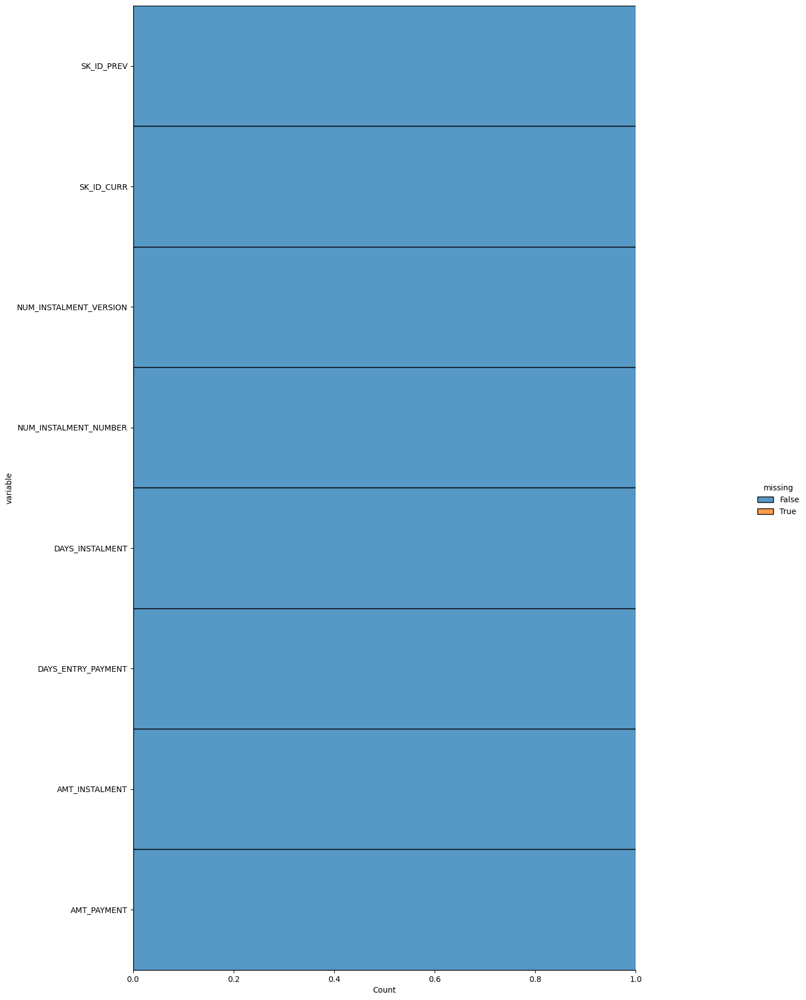

In [87]:
plot_missing_data("installments_payments",18,20)

# Visual Exploratory Data Analysis

## Distribution of the target column 

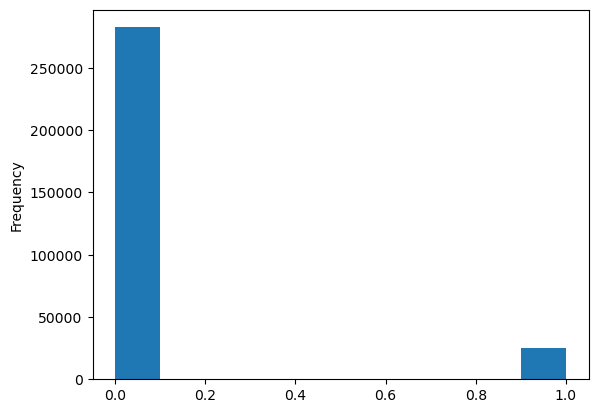

In [88]:
import matplotlib.pyplot as plt
%matplotlib inline

datasets["application_train"]['TARGET'].astype(int).plot.hist();

## Distribution of Income Total

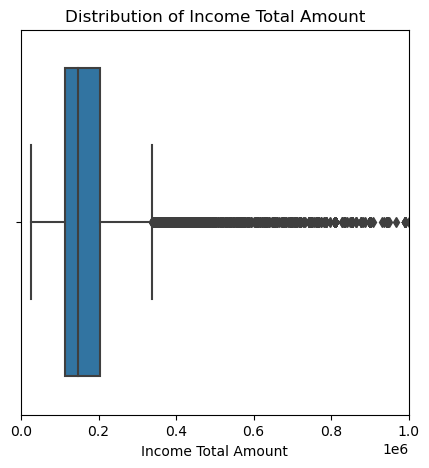

In [89]:
plt.figure(figsize = (5, 5))
sns.boxplot(data = datasets["application_train"], x = 'AMT_INCOME_TOTAL')
plt.xlim(0,1000000)
plt.xlabel('Income Total Amount'); 
plt.title('Distribution of Income Total Amount');
plt.show()


### Target vs borrowers based on income types

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'State servant'),
  Text(1, 0, 'Working'),
  Text(2, 0, 'Commercial associate'),
  Text(3, 0, 'Pensioner'),
  Text(4, 0, 'Unemployed'),
  Text(5, 0, 'Student'),
  Text(6, 0, 'Businessman'),
  Text(7, 0, 'Maternity leave')])

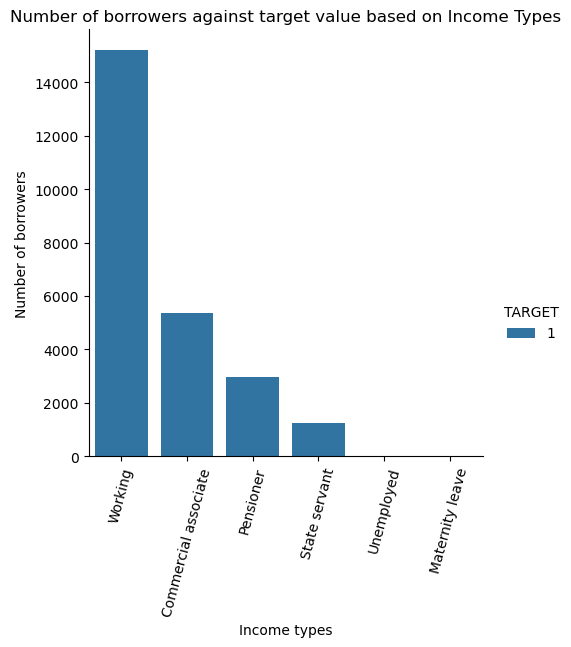

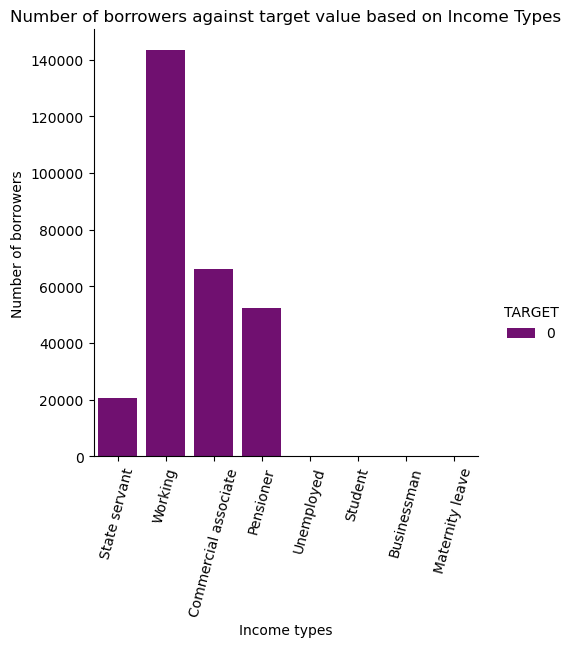

In [90]:
sns.catplot(data=datasets["application_train"][datasets["application_train"].TARGET==1],x='NAME_INCOME_TYPE',kind='count',hue="TARGET")
plt.xlabel('Income types')
plt.ylabel('Number of borrowers')
plt.title('Number of borrowers against target value based on Income Types')
plt.xticks(rotation=75)

sns.catplot(data=datasets["application_train"][datasets["application_train"].TARGET==0],x='NAME_INCOME_TYPE',kind='count',hue="TARGET", palette = ['purple'])
plt.xlabel('Income types')
plt.ylabel('Number of borrowers')
plt.title('Number of borrowers against target value based on Income Types')
plt.xticks(rotation=75)

## Distribution of the Amount Credit

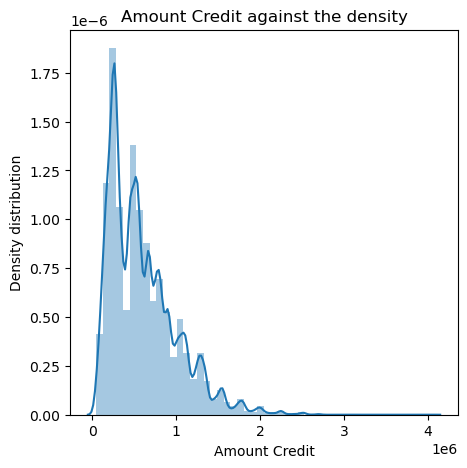

In [91]:
plt.figure(figsize = (5, 5))
sns.distplot(datasets["application_train"].AMT_CREDIT)
plt.xlabel('Amount Credit');
plt.ylabel('Density distribution');
plt.title('Amount Credit against the density');

plt.show()

### Target vs borrowers based on income and credit ratio

In [92]:
Income_credit = datasets["application_train"][['AMT_INCOME_TOTAL','AMT_CREDIT','TARGET']]
Income_credit['Ratio'] = (Income_credit['AMT_INCOME_TOTAL']/Income_credit['AMT_CREDIT'])
Income_credit

,AMT_INCOME_TOTAL,AMT_CREDIT,TARGET,Ratio
0,202500.0,406597.5,1,0.498036
1,270000.0,1293502.5,0,0.208736
2,67500.0,135000.0,0,0.500000
3,135000.0,312682.5,0,0.431748
4,121500.0,513000.0,0,0.236842
...,...,...,...,...
307506,157500.0,254700.0,0,0.618375
307507,72000.0,269550.0,0,0.267112
307508,153000.0,677664.0,0,0.225776
307509,171000.0,370107.0,1,0.462029


In [93]:
import numpy as np
def count_bins(df):
    count_dict={}
    for i in range(len(df)):
        
        if df["TARGET"].iloc[i] == 0 and (df["Ratio"].iloc[i]<0.1 and df["Ratio"].iloc[i]>=0):
            if(0 in count_dict):
                count_dict[0]+=1
            else:
                count_dict[0]=1
        if df["TARGET"].iloc[i] == 0 and (df["Ratio"].iloc[i]<0.2 and df["Ratio"].iloc[i]>=0.1):
            if(0 in count_dict):
                count_dict[1]+=1
            else:
                count_dict[1]=1
        if df["TARGET"].iloc[i] == 0 and (df["Ratio"].iloc[i]<0.3 and df["Ratio"].iloc[i]>=0.2):
            if(0 in count_dict):
                count_dict[2]+=1
            else:
                count_dict[2]=1
                
        if df["TARGET"].iloc[i] == 0 and (df["Ratio"].iloc[i]<0.4 and df["Ratio"].iloc[i]>=0.3):
            if(0 in count_dict):
                count_dict[3]+=1
            else:
                count_dict[3]=1
        if df["TARGET"].iloc[i] == 0 and (df["Ratio"].iloc[i]<0.5 and df["Ratio"].iloc[i]>=0.4):
            if(0 in count_dict):
                count_dict[4]+=1
            else:
                count_dict[4]=1
        if df["TARGET"].iloc[i] == 0 and (df["Ratio"].iloc[i]<0.6 and df["Ratio"].iloc[i]>=0.5):
            if(0 in count_dict):
                count_dict[5]+=1
            else:
                count_dict[5]=1
        if df["TARGET"].iloc[i] == 0 and (df["Ratio"].iloc[i]<0.7 and df["Ratio"].iloc[i]>=0.6):
            if(0 in count_dict):
                count_dict[6]+=1
            else:
                count_dict[6]=1
        if df["TARGET"].iloc[i] == 0 and (df["Ratio"].iloc[i]<0.8 and df["Ratio"].iloc[i]>=0.7):
            if(0 in count_dict):
                count_dict[7]+=1
            else:
                count_dict[7]=1
        if df["TARGET"].iloc[i] == 0 and (df["Ratio"].iloc[i]<0.9 and df["Ratio"].iloc[i]>=0.8):
            if(0 in count_dict):
                count_dict[8]+=1
            else:
                count_dict[8]=1
        if df["TARGET"].iloc[i] == 0 and (df["Ratio"].iloc[i]<=1.0 and df["Ratio"].iloc[i]>=0.9):
            if(0 in count_dict):
                count_dict[9]+=1
            else:
                count_dict[9]=1
    return count_dict
ff = count_bins(Income_credit)
ff

{2: 61411,
 5: 21745,
 4: 29151,
 1: 65667,
 3: 46588,
 8: 6843,
 7: 9488,
 9: 5401,
 6: 13881,
 0: 9171}

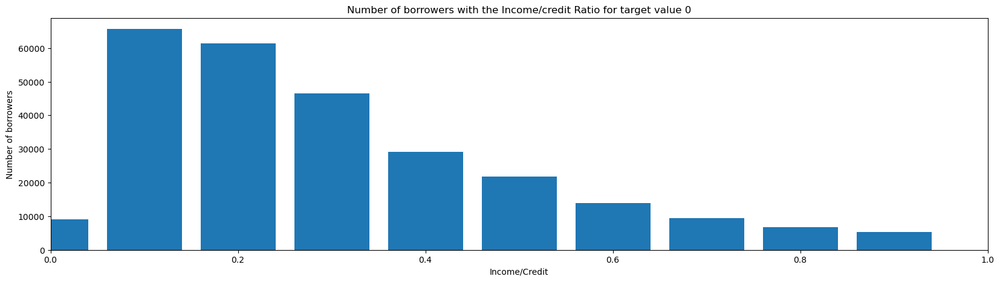

In [94]:
ratios = list(ff.keys())
count = list(ff.values())
AMT_INCOME_TOTAL_AMT_CREDIT = []
for i in ratios:
    AMT_INCOME_TOTAL_AMT_CREDIT.append(i / 10)
fig = plt.figure(figsize = (20, 5))
 
plt.bar(AMT_INCOME_TOTAL_AMT_CREDIT, count, width=0.08)
plt.xlim(0,1,0.1)
plt.xlabel("Income/Credit")
plt.ylabel('Number of borrowers')
plt.title('Number of borrowers with the Income/credit Ratio for target value 0');
plt.show()

## Distribution of Gender

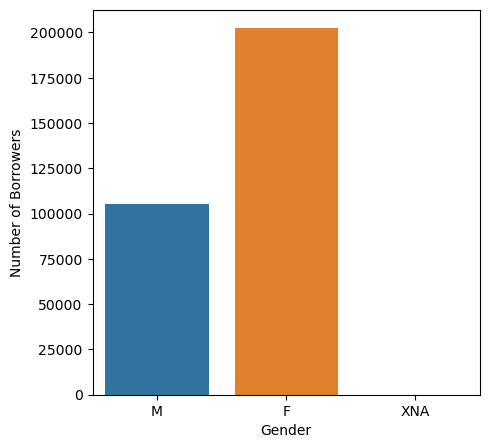

In [95]:
plt.figure(figsize=(5, 5))
sns.countplot(data=datasets["application_train"], x="CODE_GENDER")
plt.xlabel('Gender')
plt.ylabel('Number of Borrowers')
plt.show()


### Target vs borrowers based on gender

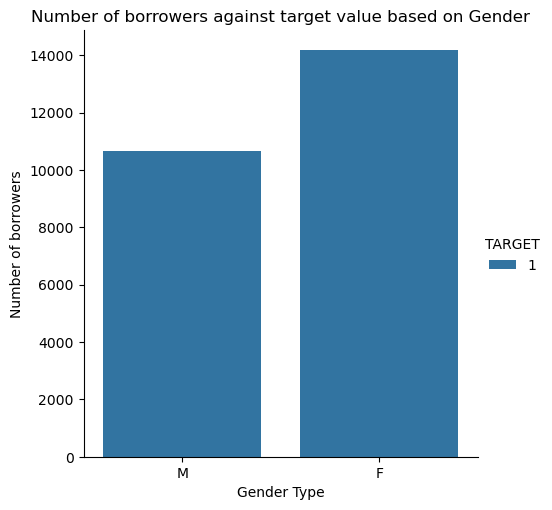

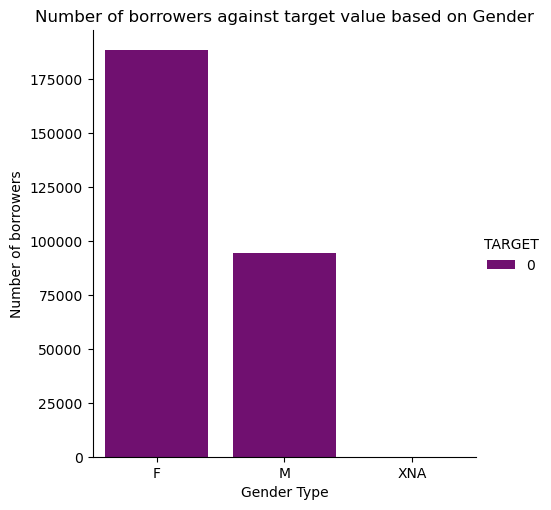

In [96]:
sns.catplot(data=datasets["application_train"][datasets["application_train"].TARGET==1],x='CODE_GENDER',kind='count',hue="TARGET");
plt.xlabel('Gender Type')
plt.ylabel('Number of borrowers')
plt.title('Number of borrowers against target value based on Gender')

sns.catplot(data=datasets["application_train"][datasets["application_train"].TARGET==0],x='CODE_GENDER',kind='count',hue="TARGET",palette = ['purple']);
plt.xlabel('Gender Type')
plt.ylabel('Number of borrowers')
plt.title('Number of borrowers against target value based on Gender')
plt.show()

## Distribution  of Applicants Age 

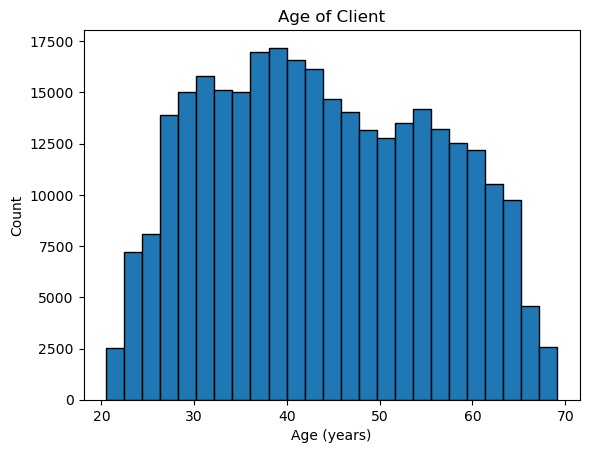

In [97]:
plt.hist(datasets["application_train"]['DAYS_BIRTH'] / -365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

### Target vs borrowers age group based on their failure rate to repay

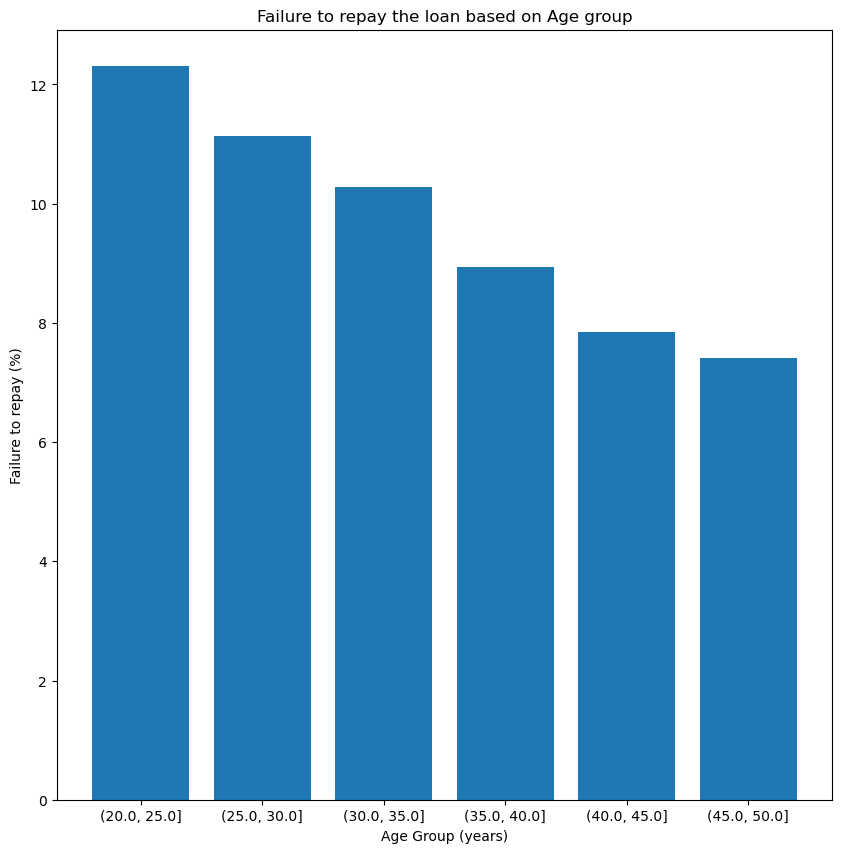

In [98]:
years=datasets["application_train"][['TARGET','DAYS_BIRTH']]
years['YEARS_BIRTH']=years['DAYS_BIRTH']/-365
years['group']=pd.cut(years['YEARS_BIRTH'],bins=np.linspace(0,50,num=11))
age_groups = years.groupby('group').mean()
age_groups

plt.figure(figsize=(10,10))
plt.bar(age_groups.index.astype(str), 100*age_groups['TARGET'])
plt.xlabel('Age Group (years)')
plt.ylabel('Failure to repay (%)')
plt.title('Failure to repay the loan based on Age group')
plt.show()

## Distribution of Marital status of Applicant

Text(0.5, 1.0, 'Family Status vs Count')

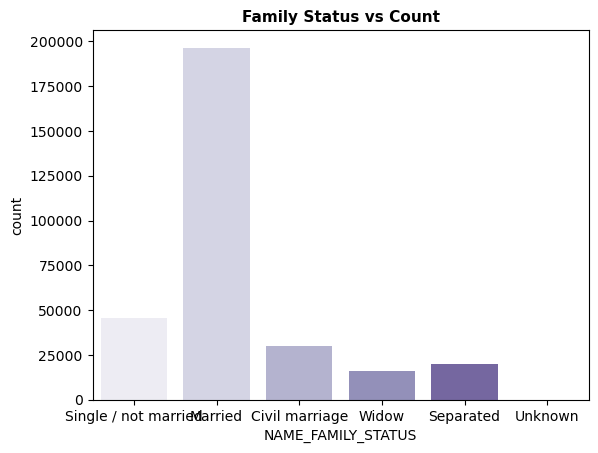

In [99]:
sns.countplot(data=datasets["application_train"], x='NAME_FAMILY_STATUS', palette='Purples')
plt.title("Family Status vs Count", fontweight = 'bold', fontsize = 11)


### Target vs borrowers based on Marital Status

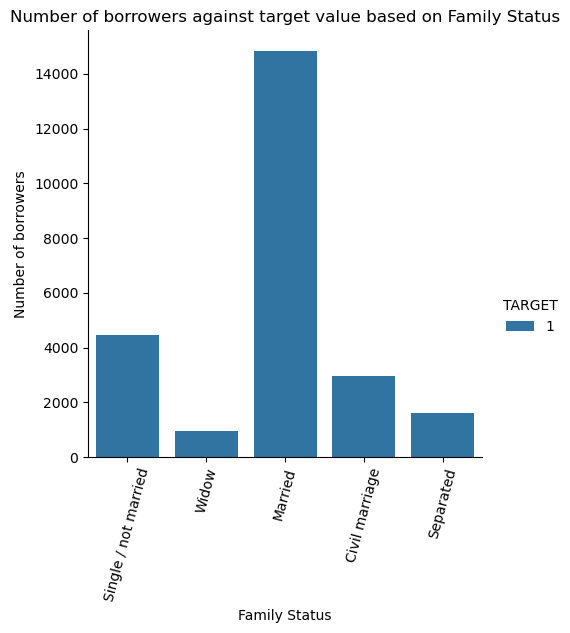

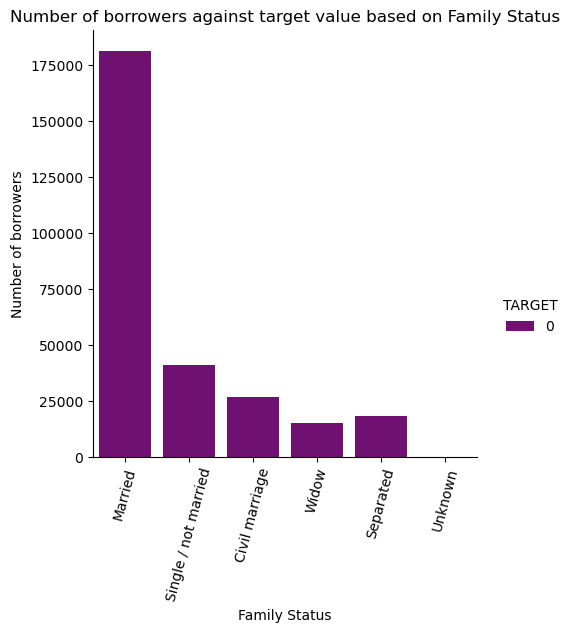

In [100]:
sns.catplot(data=datasets["application_train"][datasets["application_train"].TARGET==1],x='NAME_FAMILY_STATUS',kind='count',hue="TARGET")
plt.xlabel('Family Status')
plt.ylabel('Number of borrowers')
plt.title('Number of borrowers against target value based on Family Status')
plt.xticks(rotation=75)

sns.catplot(data=datasets["application_train"][datasets["application_train"].TARGET==0],x='NAME_FAMILY_STATUS',kind='count',hue="TARGET", palette = ['purple'])
plt.xlabel('Family Status')
plt.ylabel('Number of borrowers')
plt.title('Number of borrowers against target value based on Family Status')
plt.xticks(rotation=75)
plt.show()

### Target vs borrowers based Children count of applicant

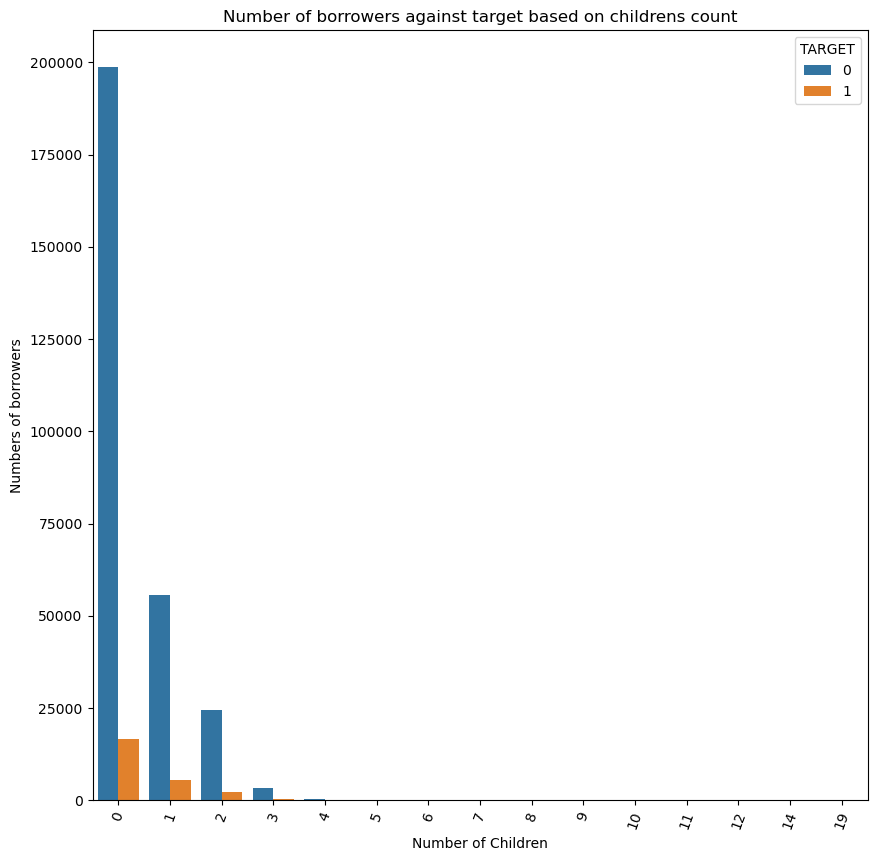

In [101]:
fig,ax = plt.subplots(figsize=(10,10))
sns.countplot(x='CNT_CHILDREN', hue = 'TARGET',data=datasets["application_train"])
plt.xlabel("Number of Children")
plt.ylabel('Numbers of borrowers')
plt.title('Number of borrowers against target based on childrens count');
plt.xticks(rotation=70)
plt.show()

## Distribution of Applicants occupations

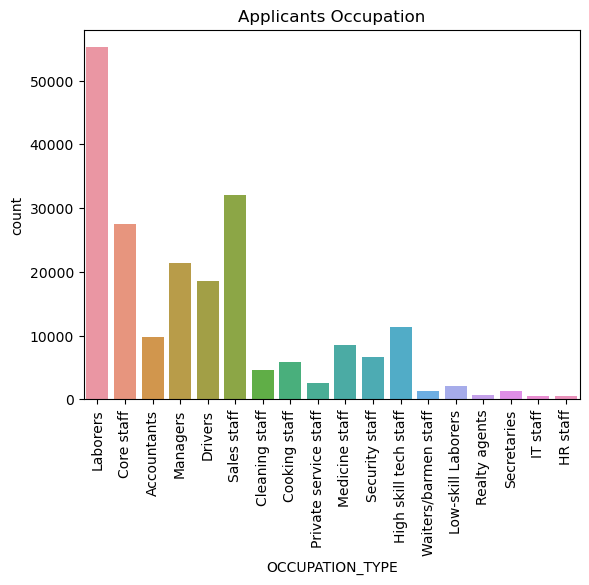

In [102]:
sns.countplot(x='OCCUPATION_TYPE', data=datasets["application_train"]);
plt.title('Applicants Occupation');
plt.xticks(rotation=90);

### Target vs borrowers based on Occupation type

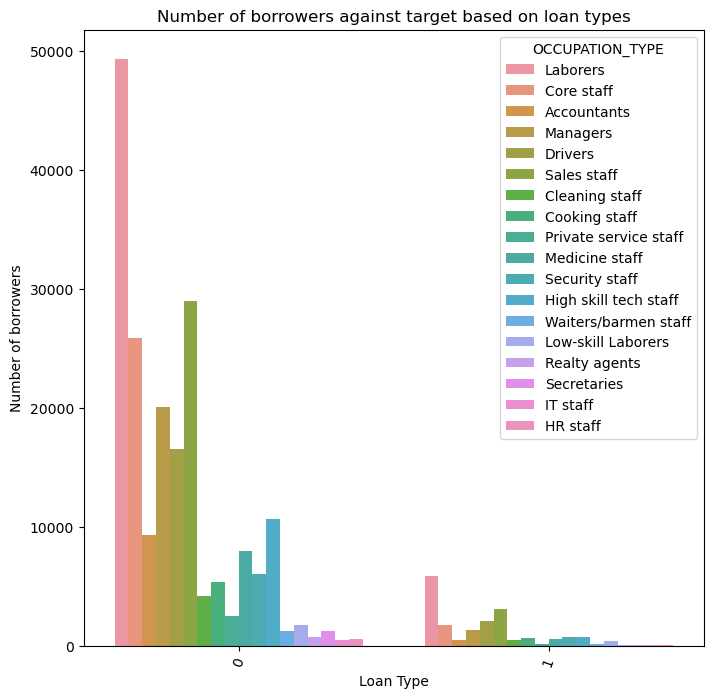

In [103]:
fig,ax = plt.subplots(figsize=(8,8))
sns.countplot(x='TARGET', hue = 'OCCUPATION_TYPE',data=datasets["application_train"])
plt.xlabel("Loan Type")
plt.ylabel('Number of borrowers')
plt.title('Number of borrowers against target based on loan types')
plt.xticks(rotation=70)
plt.show()

## Distribution of applicants who owns a car(percentage)

Text(0.5, 1.0, 'Percentage of car owners in the dataset')

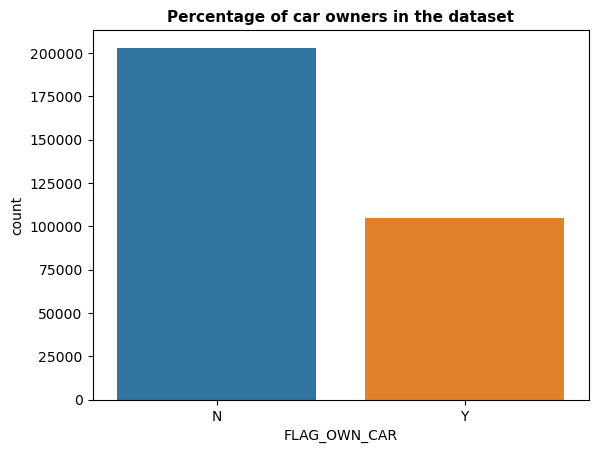

In [104]:
sns.countplot(datasets["application_train"], x = 'FLAG_OWN_CAR')
plt.title("Percentage of car owners in the dataset", fontweight = 'bold', fontsize = 11)

### Target vs borrowers based on applicants owns a car

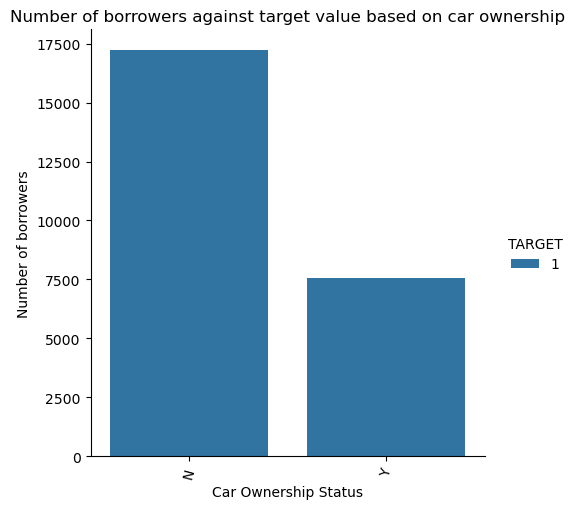

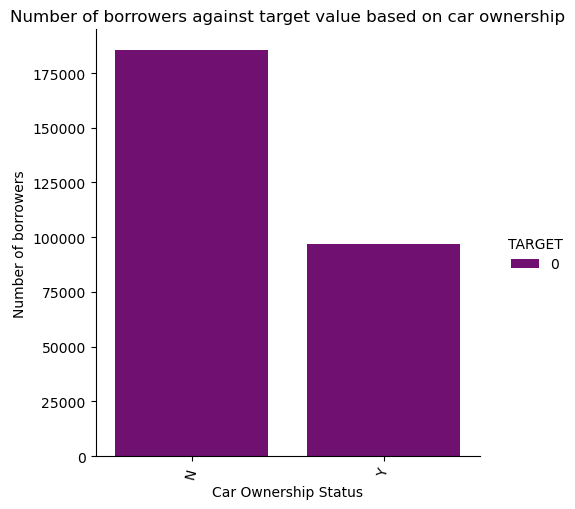

In [105]:
sns.catplot(data=datasets["application_train"][datasets["application_train"].TARGET==1],x='FLAG_OWN_CAR',kind='count',hue="TARGET")
plt.xlabel('Car Ownership Status')
plt.ylabel('Number of borrowers')
plt.title('Number of borrowers against target value based on car ownership')
plt.xticks(rotation=75)

sns.catplot(data=datasets["application_train"][datasets["application_train"].TARGET==0],x='FLAG_OWN_CAR',kind='count',hue="TARGET", palette = ['purple'])
plt.xlabel('Car Ownership Status')
plt.ylabel('Number of borrowers')
plt.title('Number of borrowers against target value based on car ownership')
plt.xticks(rotation=75)
plt.show()

## Correlation with  the target column 

In [106]:
correlations = datasets["application_train"].corr()['TARGET'].sort_values()
print('Most Positive Correlations:\n', correlations.tail(10))
print('\nMost Negative Correlations:\n', correlations.head(10))

Most Positive Correlations:
 FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645
REGION_POPULATION_RELATIVE   -0.037227
ELEVATORS_AVG                -0.034199
Name: TARGET, dtype: float64


In [107]:
corr_app_train = correlations.reset_index().rename(columns={'index':'Attributes','TARGET':'Correlation'})
corr_app_train

,Attributes,Correlation
0,EXT_SOURCE_3,-0.178919
1,EXT_SOURCE_2,-0.160472
2,EXT_SOURCE_1,-0.155317
3,DAYS_EMPLOYED,-0.044932
4,FLOORSMAX_AVG,-0.044003
...,...,...
101,DAYS_LAST_PHONE_CHANGE,0.055218
102,REGION_RATING_CLIENT,0.058899
103,REGION_RATING_CLIENT_W_CITY,0.060893
104,DAYS_BIRTH,0.078239


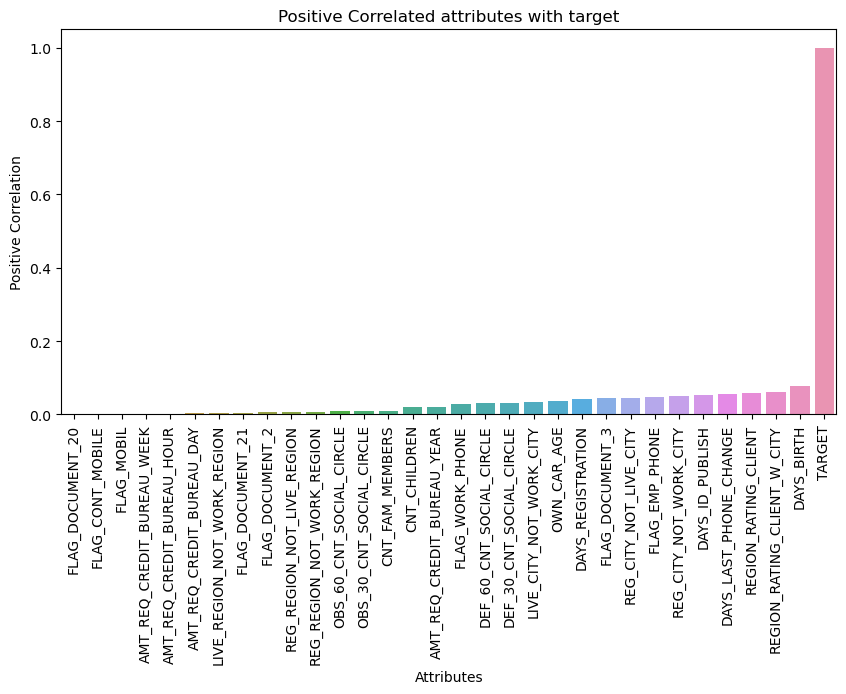

In [108]:
plt.figure(figsize = (10, 5))
sns.barplot(x='Attributes',y='Correlation',data= corr_app_train[corr_app_train.Correlation>0])
plt.xlabel('Attributes')
plt.ylabel('Positive Correlation')
plt.title('Positive Correlated attributes with target')
plt.xticks(rotation=90)
plt.show()

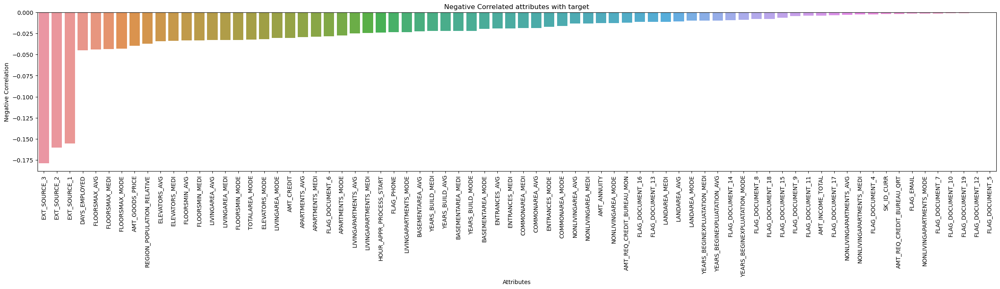

In [109]:
plt.figure(figsize = (30, 5))
sns.barplot(x='Attributes',y='Correlation',data= corr_app_train[corr_app_train.Correlation<=0])
plt.xlabel('Attributes')
plt.ylabel('Negative Correlation')
plt.title('Negative Correlated attributes with target')
plt.xticks(rotation=90)
plt.show()

In [110]:
from pandas.plotting import scatter_matrix
#We can take the top 10 features
top_corr_features = ["TARGET", "REGION_RATING_CLIENT","REGION_RATING_CLIENT_W_CITY","DAYS_LAST_PHONE_CHANGE",
               "DAYS_BIRTH", "EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3", "DAYS_ID_PUBLISH","REG_CITY_NOT_WORK_CITY"]
# scatter_matrix(datasets["application_train"][top_corr_features], figsize=(12, 8));
df = datasets["application_train"].copy()
df2 = df[top_corr_features]
corr = df2.corr()
corr.style.background_gradient(cmap='PuBu').set_precision(2)


,TARGET,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,DAYS_LAST_PHONE_CHANGE,DAYS_BIRTH,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_ID_PUBLISH,REG_CITY_NOT_WORK_CITY
TARGET,1.00,0.06,0.06,0.06,0.08,-0.16,-0.16,-0.18,0.05,0.05
REGION_RATING_CLIENT,0.06,1.00,0.95,0.03,0.01,-0.12,-0.29,-0.01,-0.01,0.01
REGION_RATING_CLIENT_W_CITY,0.06,0.95,1.00,0.03,0.01,-0.12,-0.29,-0.01,-0.01,0.03
DAYS_LAST_PHONE_CHANGE,0.06,0.03,0.03,1.00,0.08,-0.13,-0.20,-0.08,0.09,0.05
DAYS_BIRTH,0.08,0.01,0.01,0.08,1.00,-0.60,-0.09,-0.21,0.27,0.24
EXT_SOURCE_1,-0.16,-0.12,-0.12,-0.13,-0.60,1.00,0.21,0.19,-0.13,-0.19
EXT_SOURCE_2,-0.16,-0.29,-0.29,-0.20,-0.09,0.21,1.00,0.11,-0.05,-0.08
EXT_SOURCE_3,-0.18,-0.01,-0.01,-0.08,-0.21,0.19,0.11,1.00,-0.13,-0.08
DAYS_ID_PUBLISH,0.05,-0.01,-0.01,0.09,0.27,-0.13,-0.05,-0.13,1.00,0.10
REG_CITY_NOT_WORK_CITY,0.05,0.01,0.03,0.05,0.24,-0.19,-0.08,-0.08,0.10,1.00


Text(0.5, 1.0, 'Correlation Heatmap for features with highest correlations with target variables')

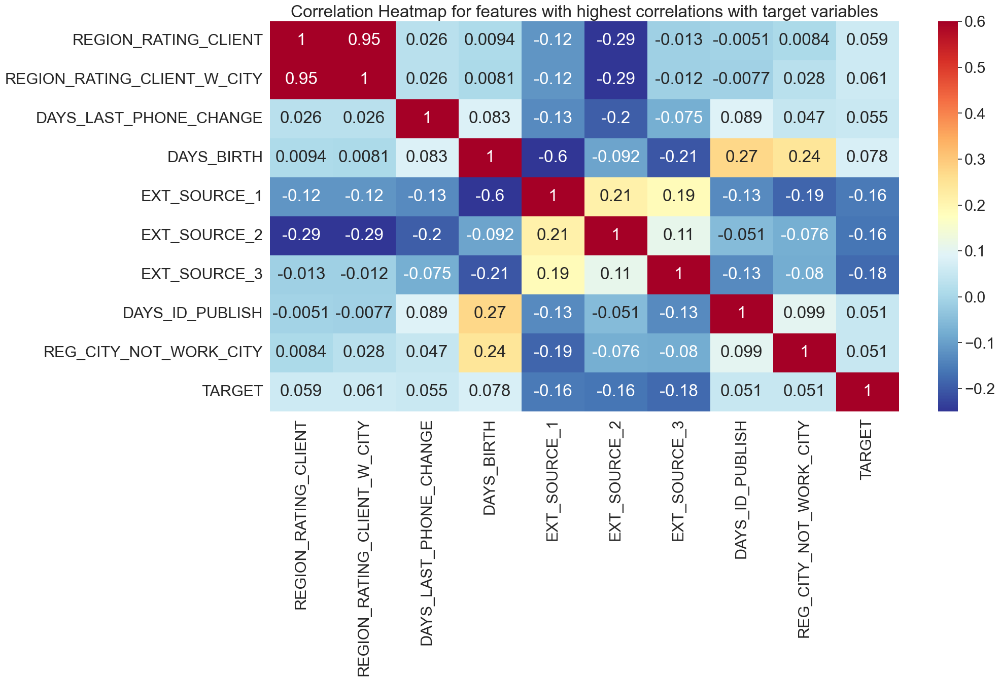

In [111]:
most_corr=datasets["application_train"][["REGION_RATING_CLIENT","REGION_RATING_CLIENT_W_CITY","DAYS_LAST_PHONE_CHANGE",
               "DAYS_BIRTH", "EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3", "DAYS_ID_PUBLISH","REG_CITY_NOT_WORK_CITY",'TARGET']]
most_corr_corr = most_corr.corr()

sns.set_style("dark")
sns.set_context("notebook", font_scale=2.0, rc={"lines.linewidth": 1.0})
fig, axes = plt.subplots(figsize = (20,10),sharey=True)
sns.heatmap(most_corr_corr,cmap=plt.cm.RdYlBu_r,vmin=-0.25,vmax=0.6,annot=True)
plt.title('Correlation Heatmap for features with highest correlations with target variables')


# Dataset questions
## Unique record for each SK_ID_CURR

In [112]:
list(datasets.keys())

['application_train',
 'application_test',
 'bureau',
 'bureau_balance',
 'credit_card_balance',
 'installments_payments',
 'previous_application',
 'POS_CASH_balance']

In [113]:
len(datasets["application_train"]["SK_ID_CURR"].unique()) == datasets["application_train"].shape[0]

True

In [114]:
# is there an overlap between the test and train customers 
np.intersect1d(datasets["application_train"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])

array([], dtype=int64)

In [115]:
# 
datasets["application_test"].shape

(48744, 121)

In [116]:
datasets["application_train"].shape

(307511, 122)

## previous applications for the submission file
The persons in the kaggle submission file have had previous applications in the `previous_application.csv`. 47,800 out 48,744 people have had previous appications.

In [117]:
appsDF = datasets["previous_application"]
display(appsDF.head())
print(f"{appsDF.shape[0]:,} rows, {appsDF.shape[1]:,} columns")

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


1,670,214 rows, 37 columns


In [118]:
print(f"There are  {appsDF.shape[0]:,} previous applications")

There are  1,670,214 previous applications


In [119]:
# Compute statistics on the number of previous applications per customer
previous_applications_df = datasets["previous_application"]
num_customers = previous_applications_df["SK_ID_CURR"].nunique()
num_apps = [5, 10, 40, 60]
num_apps_counts = [np.sum(previous_applications_df["SK_ID_CURR"].value_counts() >= n) for n in num_apps]
percent_apps = [np.round(100. * (count / num_customers), 2) for count in num_apps_counts]

# Print the percentage of customers with 5 or more, 10 or more, 40 or more, 60 or more, 70 or more, 80 or more, and 90 or more previous applications
for n, percent in zip(num_apps, percent_apps):
    print(f"Percentage of customers with {n} or more previous applications: {percent:.2f}%")


Percentage of customers with 5 or more previous applications: 41.77%
Percentage of customers with 10 or more previous applications: 11.84%
Percentage of customers with 40 or more previous applications: 0.03%
Percentage of customers with 60 or more previous applications: 0.00%


In [120]:
# Filter the training data to include only the observations with a target value of 1
application_train = datasets["application_train"]
unpaid_application_train = application_train[application_train['TARGET'] == 1]

# Sample 75,000 observations from the training data with a target value of 0 and append them to the filtered data
paid_application_train = application_train[application_train['TARGET'] == 0].reset_index(drop=True).sample(n=75000)
und_application_train = unpaid_application_train.append(paid_application_train)

# Add the undersampled training data to the dictionary of datasets
datasets["undersampled_application_train"] = und_application_train

# Print the number of observations with a target value of 0 and 1 in the undersampled training data
target_counts = und_application_train['TARGET'].value_counts()
print(f"Number of observations with a target value of 0: {target_counts[0]}")
print(f"Number of observations with a target value of 1: {target_counts[1]}")


Number of observations with a target value of 0: 75000
Number of observations with a target value of 1: 24825


In [121]:
# Create a copy of the training data containing only observations with a target value of 1 and add a weight column
undersampled_application_train_2 = datasets["application_train"][datasets["application_train"]["TARGET"] == 1].copy()
undersampled_application_train_2["weight"] = 1

# Count the number of default loans for cash loans and revolving loans separately
num_default_cash_loans = undersampled_application_train_2[(undersampled_application_train_2["TARGET"] == 1) & (undersampled_application_train_2["NAME_CONTRACT_TYPE"] == "Cash loans")].shape[0]
num_default_revolving_loans = undersampled_application_train_2[(undersampled_application_train_2["TARGET"] == 1) & (undersampled_application_train_2["NAME_CONTRACT_TYPE"] == "Revolving loans")].shape[0]

# Add the undersampled training data to the dictionary of datasets
datasets["undersampled_application_train_2"] = undersampled_application_train_2


In [122]:
# Undersample cash loans from the training data with a target value of 0 to balance the number of default loans for cash loans and revolving loans
cash_loans_target_0 = datasets["application_train"][(datasets["application_train"]["NAME_CONTRACT_TYPE"] == "Cash loans") & (datasets["application_train"]["TARGET"] == 0)]
cash_loans_target_0_sample = cash_loans_target_0.sample(n=int(1.5*num_default_cash_loans), random_state=1)
cash_loans_target_0_sample_weight = cash_loans_target_0.shape[0] / int(1.5*num_default_cash_loans)
cash_loans_target_0_sample["weight"] = cash_loans_target_0_sample_weight
undersampled_application_train_2 = pd.concat([datasets["undersampled_application_train_2"], cash_loans_target_0_sample])

# Add the undersampled training data to the dictionary of datasets
datasets["undersampled_application_train_2"] = undersampled_application_train_2


In [123]:
# Undersample revolving loans from the training data with a target value of 0 to balance the number of default loans for cash loans and revolving loans
revolving_loans_target_0 = datasets["application_train"][(datasets["application_train"]["NAME_CONTRACT_TYPE"] == "Revolving loans") & (datasets["application_train"]["TARGET"] == 0)]
revolving_loans_target_0_sample = revolving_loans_target_0.sample(n=int(1.5*num_default_revolving_loans), random_state=1)
revolving_loans_target_0_sample_weight = revolving_loans_target_0.shape[0] / int(1.5*num_default_revolving_loans)
revolving_loans_target_0_sample["weight"] = revolving_loans_target_0_sample_weight
undersampled_application_train_2 = pd.concat([datasets["undersampled_application_train_2"], revolving_loans_target_0_sample])

# Add the undersampled training data to the dictionary of datasets
datasets["undersampled_application_train_2"] = undersampled_application_train_2


In [124]:
# Create a copy of the undersampled training data and store it in a new variable
undersampled_application_train_2 = datasets["undersampled_application_train_2"].copy()


In [125]:
# Count the number of samples in the undersampled training data with a target value of 1 and 0
undersampled_application_train_2_target_counts = undersampled_application_train_2["TARGET"].value_counts()
undersampled_application_train_2_target_counts

0    37237
1    24825
Name: TARGET, dtype: int64

In [126]:
# Create a DataFrame containing the target variable and the client's age in years
age_data = datasets["undersampled_application_train_2"][["TARGET", "DAYS_BIRTH"]]
age_data["YEARS"] = age_data["DAYS_BIRTH"] / 365

# Bin the ages into 10 evenly spaced bins between 20 and 70 years old
age_data["AGE_BIN"] = pd.cut(age_data["YEARS"], bins=np.linspace(20, 70, num=10))

# Display the first 15 rows of the age DataFrame
age_data.head(15)


,TARGET,DAYS_BIRTH,YEARS,AGE_BIN
0,1,-9461,-25.920548,NaN
26,1,-18724,-51.298630,NaN
40,1,-17482,-47.895890,NaN
42,1,-13384,-36.668493,NaN
81,1,-24794,-67.928767,NaN
94,1,-10199,-27.942466,NaN
110,1,-10526,-28.838356,NaN
138,1,-16667,-45.663014,NaN
154,1,-17538,-48.049315,NaN
163,1,-7989,-21.887671,NaN


In [127]:
# Group the age DataFrame by the age bins and calculate the mean target variable and age in years for each bin
age_grouped = age_data.groupby("AGE_BIN").mean()

# Display the grouped DataFrame
age_grouped


,TARGET,DAYS_BIRTH,YEARS
AGE_BIN,,,
"(20.0, 25.556]",NaN,NaN,NaN
"(25.556, 31.111]",NaN,NaN,NaN
"(31.111, 36.667]",NaN,NaN,NaN
"(36.667, 42.222]",NaN,NaN,NaN
"(42.222, 47.778]",NaN,NaN,NaN
"(47.778, 53.333]",NaN,NaN,NaN
"(53.333, 58.889]",NaN,NaN,NaN
"(58.889, 64.444]",NaN,NaN,NaN
"(64.444, 70.0]",NaN,NaN,NaN


In [128]:
#Find the intersection of two arrays.
print(f'Number of train applicants with previous applications is {len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_train"]["SK_ID_CURR"])):,}')

Number of train applicants with previous applications is 291,057


In [129]:
#Find the intersection of two arrays.
print(f'Number of train applicants with previous applications is {len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])):,}')

Number of train applicants with previous applications is 47,800


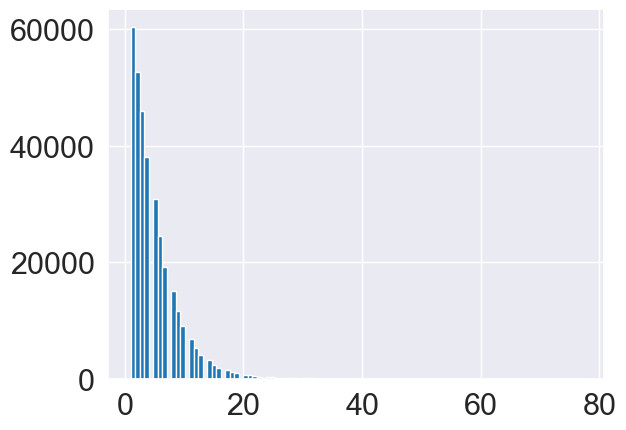

In [130]:
# How many previous applciations  per applicant in the previous_application 
prevAppCounts = appsDF['SK_ID_CURR'].value_counts(dropna=False)
len(prevAppCounts[prevAppCounts >40])  #more that 40 previous applications
plt.hist(prevAppCounts[prevAppCounts>=0], bins=100)
plt.grid()

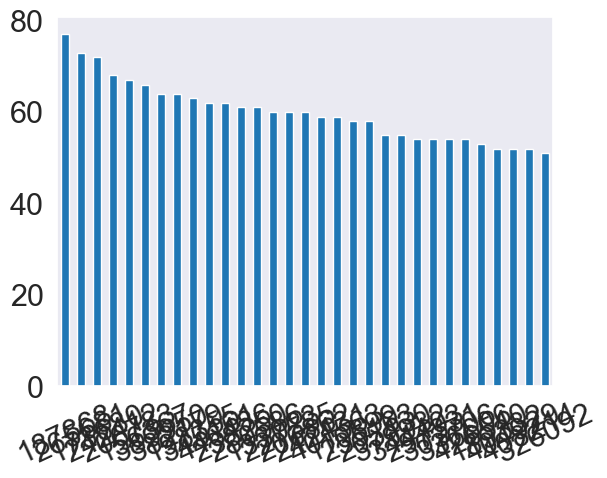

In [131]:
prevAppCounts[prevAppCounts >50].plot(kind='bar')
plt.xticks(rotation=25)
plt.show()

### Histogram of Number of previous applications for an ID

In [132]:
sum(appsDF['SK_ID_CURR'].value_counts()==1)

60458

Text(0.5, 1.0, 'Histogram of Number of previous applications for an ID')

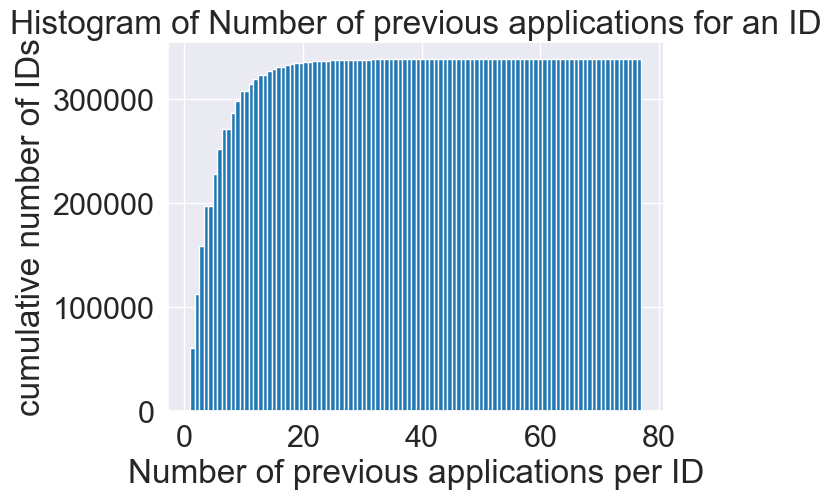

In [133]:
plt.hist(appsDF['SK_ID_CURR'].value_counts(), cumulative =True, bins = 100);
plt.grid()
plt.ylabel('cumulative number of IDs')
plt.xlabel('Number of previous applications per ID')
plt.title('Histogram of Number of previous applications for an ID')


##### **Can we differentiate applications by low, medium and high previous apps?**
    * Low = <5 claims (22%)
    * Medium = 10 to 39 claims (58%)
    * High = 40 or more claims (20%)

In [134]:
apps_all = appsDF['SK_ID_CURR'].nunique()
apps_5plus = appsDF['SK_ID_CURR'].value_counts()>=5
apps_40plus = appsDF['SK_ID_CURR'].value_counts()>=40
print('Percentage with 10 or more previous apps:', np.round(100.*(sum(apps_5plus)/apps_all),5))
print('Percentage with 40 or more previous apps:', np.round(100.*(sum(apps_40plus)/apps_all),5))

Percentage with 10 or more previous apps: 41.76895
Percentage with 40 or more previous apps: 0.03453


# Joining secondary tables with the primary table

In the case of the HCDR competition (and many other machine learning problems that involve multiple tables in 3NF or not)  we need to join these datasets (denormalize) when using a machine learning pipeline. Joining the secondary tables with the primary table will lead to lots of new features about each loan application; these features will tend to be aggregate type features or meta data about the loan or its application. How can we do this when using Machine Learning Pipelines?

## Joining `previous_application` with `application_x`
We refer to the `application_train` data (and also `application_test` data also) as the **primary table** and the other files as the **secondary tables** (e.g., `previous_application` dataset). All tables can be joined using the primary key `SK_ID_PREV`.

Let's assume we wish to generate a feature based on previous application attempts. In this case, possible features here could be:

* A simple feature could be the number of previous applications.
* Other summary features of original features such as `AMT_APPLICATION`, `AMT_CREDIT` could be based on average, min, max, median, etc.
 
To build such features, we need to join the `application_train` data (and also `application_test` data also) with the 'previous_application' dataset (and the other available datasets).

When joining this data in the context of pipelines, different strategies come to mind with various tradeoffs:

1. Preprocess each of the non-application data sets, thereby generating many new (derived) features, and then joining (aka merge) the results with the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset) prior to processing the data (in a train, valid, test partition) via your machine learning pipeline. [This approach is recommended for this HCDR competition. WHY?]

* Do the joins as part of the transformation steps. [Not recommended here. WHY?]. How can this be done? Will it work?
  * This would be necessary if we had dataset wide features such as IDF (inverse document frequency) which depend on the entire subset of data as opposed to a single loan application (e.g., a feature about the relative amount applied for such as the percentile of the loan amount being applied for).
 
I want you to think about this section and build on this.

## Roadmap for secondary table processing

1. Transform all the secondary tables to features that can be joined into the main table the application table (labeled and unlabeled)
   * 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
   * 'previous_application', 'POS_CASH_balance'
* Merge the transformed secondary tables with the primary tables (i.e., the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset)), thereby leading to X_train, y_train, X_valid, etc.
* Proceed with the learning pipeline using X_train, y_train, X_valid, etc.
* Generate a submission file using the learnt model


## agg detour

Aggregate using one or more operations over the specified axis.

For more details see [agg](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.agg.html)
```python
DataFrame.agg(func, axis=0, *args, **kwargs**)
```
Aggregate using one or more operations over the specified axis.


In [135]:
df = pd.DataFrame([[1, 2, 3],
                    [4, 5, 6],
                   [7, 8, 9],
                   [np.nan, np.nan, np.nan]],
                   columns=['A', 'B', 'C'])
display(df)

,A,B,C
0,1.0,2.0,3.0
1,4.0,5.0,6.0
2,7.0,8.0,9.0
3,NaN,NaN,NaN


In [136]:
df.agg({'A' : ['sum', 'min'], 'B' : ['min', 'max']})
#        A    B
#max   NaN  8.0
#min   1.0  2.0
#sum  12.0  NaN

,A,B
sum,12.0,NaN
min,1.0,2.0
max,NaN,8.0


In [137]:
df = pd.DataFrame({'A': [1, 1, 2, 2],
                    'B': [1, 2, 3, 4],
                    'C': np.random.randn(4)})
display(df)

,A,B,C
0,1,1,-0.231354
1,1,2,-0.399951
2,2,3,0.330044
3,2,4,-0.327769


In [138]:
# group by column A: 
df.groupby('A').agg({'B': ['min', 'max'], 'C': 'sum'})
#    B             C
#  min max       sum
#A
#1   1   2  0.590716
#2   3   4  0.704907

B             C
  min max       sum
A                  
1   1   2 -0.631305
2   3   4  0.002275

In [139]:
appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [140]:
funcs = ["a","b","c"]
{f:f"{f}_max" for f in funcs}

{'a': 'a_max', 'b': 'b_max', 'c': 'c_max'}

### Multiple condition expressions in Pandas
So far, both our boolean selections have involved a single condition. You can, of course, have as many conditions as you would like. To do so, you will need to combine your boolean expressions using the three logical operators and, or and not.

Use &, | , ~
Although Python uses the syntax and, or, and not, these will not work when testing multiple conditions with pandas. The details of why are explained [here](https://medium.com/dunder-data/selecting-subsets-of-data-in-pandas-39e811c81a0c).

You must use the following operators with pandas:

* & for and
* | for or
* ~ for not

In [141]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704)]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


In [142]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704)]["AMT_CREDIT"]

6    0.0
Name: AMT_CREDIT, dtype: float64

In [143]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704) & ~(appsDF["AMT_CREDIT"]==1.0)]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


## Missing values in prevApps

In [144]:
appsDF.isna().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [145]:
appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

## feature engineering for prevApp table

The groupby output will have an index or multi-index on rows corresponding to your chosen grouping variables. To avoid setting this index, pass “as_index=False” to the groupby operation.

```python
import pandas as pd
import dateutil

# Load data from csv file
data = pd.DataFrame.from_csv('phone_data.csv')
# Convert date from string to date times
data['date'] = data['date'].apply(dateutil.parser.parse, dayfirst=True)

data.groupby('month', as_index=False).agg({"duration": "sum"})
```
Pandas `reset_index()` to convert Multi-Index to Columns
We can simplify the multi-index dataframe using reset_index() function in Pandas. By default, Pandas reset_index() converts the indices to columns.

#### Fixing Column names after Pandas agg() function to summarize grouped data
Since we have both the variable name and the operation performed in two rows in the Multi-Index dataframe, we can use that and name our new columns correctly.

For more details unstacking groupby results and examples please see [here](https://cmdlinetips.com/2020/05/fun-with-pandas-groupby-aggregate-multi-index-and-unstack/)




For more details and examples please see [here](https://www.shanelynn.ie/summarising-aggregation-and-grouping-data-in-python-pandas/)

In [147]:
features = ['AMT_ANNUITY', 'AMT_APPLICATION']
print(f"{appsDF[features].describe()}")
agg_ops = ["min", "max", "mean"]
result = appsDF.groupby(["SK_ID_CURR"], as_index=False).agg("mean") #group by ID
display(result.head())
print("-"*50)
result = appsDF.groupby(["SK_ID_CURR"], as_index=False).agg({'AMT_ANNUITY' : agg_ops, 'AMT_APPLICATION' : agg_ops})
result.columns = result.columns.map('_'.join)
display(result)
result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
print(f"result.shape: {result.shape}")
result[0:10]

        AMT_ANNUITY  AMT_APPLICATION
count  1.297979e+06     1.670214e+06
mean   1.595512e+04     1.752339e+05
std    1.478214e+04     2.927798e+05
min    0.000000e+00     0.000000e+00
25%    6.321780e+03     1.872000e+04
50%    1.125000e+04     7.104600e+04
75%    2.065842e+04     1.803600e+05
max    4.180581e+05     6.905160e+06


,SK_ID_CURR,SK_ID_PREV,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100001,1.369693e+06,3951.000,24835.50,23787.00,2520.0,24835.5,13.000000,1.0,0.104326,...,NaN,-1740.0,23.0,8.0,365243.0,-1709.000000,-1499.000000,-1619.000000,-1612.000000,0.000000
1,100002,1.038818e+06,9251.775,179055.00,179055.00,0.0,179055.0,9.000000,1.0,0.000000,...,NaN,-606.0,500.0,24.0,365243.0,-565.000000,125.000000,-25.000000,-17.000000,0.000000
2,100003,2.281150e+06,56553.990,435436.50,484191.00,3442.5,435436.5,14.666667,1.0,0.050030,...,NaN,-1305.0,533.0,10.0,365243.0,-1274.333333,-1004.333333,-1054.333333,-1047.333333,0.666667
3,100004,1.564014e+06,5357.250,24282.00,20106.00,4860.0,24282.0,5.000000,1.0,0.212008,...,NaN,-815.0,30.0,4.0,365243.0,-784.000000,-694.000000,-724.000000,-714.000000,0.000000
4,100005,2.176837e+06,4813.200,22308.75,20076.75,4464.0,44617.5,10.500000,1.0,0.108964,...,NaN,-536.0,18.0,12.0,365243.0,-706.000000,-376.000000,-466.000000,-460.000000,0.000000


--------------------------------------------------


,SK_ID_CURR_,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750
...,...,...,...,...,...,...,...
338852,456251,6605.910,6605.910,6605.910000,40455.0,40455.0,40455.000
338853,456252,10074.465,10074.465,10074.465000,57595.5,57595.5,57595.500
338854,456253,3973.095,5567.715,4770.405000,19413.0,28912.5,24162.750
338855,456254,2296.440,19065.825,10681.132500,18846.0,223789.5,121317.750


result.shape: (338857, 8)


,SK_ID_CURR_,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean,range_AMT_APPLICATION
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500000,0.0
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000000,0.0
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500000,831190.5
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000000,0.0
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750000,44617.5
5,100006,2482.920,39954.510,23651.175000,0.0,688500.0,272203.260000,688500.0
6,100007,1834.290,22678.785,12278.805000,17176.5,247500.0,150530.250000,230323.5
7,100008,8019.090,25309.575,15839.696250,0.0,450000.0,155701.800000,450000.0
8,100009,7435.845,17341.605,10051.412143,40455.0,110160.0,76741.714286,69705.0
9,100010,27463.410,27463.410,27463.410000,247212.0,247212.0,247212.000000,0.0


In [148]:
result.isna().sum()

SK_ID_CURR_                0
AMT_ANNUITY_min          480
AMT_ANNUITY_max          480
AMT_ANNUITY_mean         480
AMT_APPLICATION_min        0
AMT_APPLICATION_max        0
AMT_APPLICATION_mean       0
range_AMT_APPLICATION      0
dtype: int64

## feature transformer for prevApp table

In [150]:
# Define a list of features to include in the analysis
features_to_analyze = ["AMT_ANNUITY", "AMT_APPLICATION"]

# Calculate descriptive statistics for the selected features in the previous applications DataFrame
feature_stats = datasets["previous_application"][features_to_analyze].describe()

# Display the descriptive statistics
print(feature_stats)

# Define a list of aggregation operations to perform on the previous applications DataFrame
aggregation_operations = ["min", "max", "mean"]

# Group the previous applications DataFrame by client ID and calculate the mean of each group for the selected features
grouped_results = datasets["previous_application"].groupby("SK_ID_CURR")[features_to_analyze].agg(aggregation_operations)

# Display the first 5 rows of the grouped results DataFrame
display(grouped_results.head())


        AMT_ANNUITY  AMT_APPLICATION
count  1.297979e+06     1.670214e+06
mean   1.595512e+04     1.752339e+05
std    1.478214e+04     2.927798e+05
min    0.000000e+00     0.000000e+00
25%    6.321780e+03     1.872000e+04
50%    1.125000e+04     7.104600e+04
75%    2.065842e+04     1.803600e+05
max    4.180581e+05     6.905160e+06


AMT_ANNUITY                       AMT_APPLICATION            \
                   min        max       mean             min       max   
SK_ID_CURR                                                               
100001        3951.000   3951.000   3951.000         24835.5   24835.5   
100002        9251.775   9251.775   9251.775        179055.0  179055.0   
100003        6737.310  98356.995  56553.990         68809.5  900000.0   
100004        5357.250   5357.250   5357.250         24282.0   24282.0   
100005        4813.200   4813.200   4813.200             0.0   44617.5   

                       
                 mean  
SK_ID_CURR             
100001       24835.50  
100002      179055.00  
100003      435436.50  
100004       24282.00  
100005       22308.75

In [151]:
# Create aggregate features (via pipeline)
class FeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None, agg_needed=["mean"]): # no *args or **kargs
        self.features = features
        self.agg_needed = agg_needed
        self.agg_op_features = {}
        for f in features:
            self.agg_op_features[f] = self.agg_needed[:]

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        result = X.groupby(["SK_ID_CURR"]).agg(self.agg_op_features)
        df_result = pd.DataFrame()
        for x1, x2 in result.columns:
            new_col = x1 + "_" + x2
            df_result[new_col] = result[x1][x2]
        df_result = df_result.reset_index(level=["SK_ID_CURR"])
        return df_result

In [152]:
from sklearn.pipeline import make_pipeline
previous_feature = ["AMT_APPLICATION", "AMT_CREDIT", "AMT_ANNUITY", "approved_credit_ratio", 
                    "AMT_ANNUITY_credit_ratio", "Interest_ratio", "LTV_ratio", "SK_ID_PREV", "approved"]

agg_needed = ["min", "max", "mean", "count", "sum"]

def previous_feature_aggregation(df, feature, agg_needed):
    df['approved_credit_ratio'] = (df['AMT_APPLICATION']/df['AMT_CREDIT']).replace(np.inf, 0)
    # installment over credit approved ratio
    df['AMT_ANNUITY_credit_ratio'] = (df['AMT_ANNUITY']/df['AMT_CREDIT']).replace(np.inf, 0)
    # total interest payment over credit ratio
    df['Interest_ratio'] = (df['AMT_ANNUITY']/df['AMT_CREDIT']).replace(np.inf, 0)
    #  loan cover ratio
    df['LTV_ratio'] = (df['AMT_CREDIT']/df['AMT_GOODS_PRICE']).replace(np.inf, 0)
    df['approved'] = np.where(df.AMT_CREDIT >0 ,1, 0)
    
    test_pipeline = make_pipeline(FeaturesAggregater(feature, agg_needed))
    return(test_pipeline.fit_transform(df))
    
datasets['previous_application_agg'] = previous_feature_aggregation(datasets["previous_application"], previous_feature, agg_needed)

In [153]:
datasets['previous_application_agg'].head()
print(datasets["previous_application_agg"].isna().sum())
datasets['previous_application_agg'].columns

#	SK_ID_CURR	SK_ID_PREV	AMT_ANNUITY	AMT_APPLICATION	AMT_CREDIT	AMT_DOWN_PAYMENT	AMT_GOODS_PRICE	HOUR_APPR_PROCESS_START	NFLAG_LAST_APPL_IN_DAY	RATE_DOWN_PAYMENT	...	RATE_INTEREST_PRIVILEGED	DAYS_DECISION	SELLERPLACE_AREA	CNT_PAYMENT	DAYS_FIRST_DRAWING	DAYS_FIRST_DUE	DAYS_LAST_DUE_1ST_VERSION	DAYS_LAST_DUE	DAYS_TERMINATION	NFLAG_INSURED_ON_APPROVAL

SK_ID_CURR                           0
AMT_APPLICATION_min                  0
AMT_APPLICATION_max                  0
AMT_APPLICATION_mean                 0
AMT_APPLICATION_count                0
AMT_APPLICATION_sum                  0
AMT_CREDIT_min                       0
AMT_CREDIT_max                       0
AMT_CREDIT_mean                      0
AMT_CREDIT_count                     0
AMT_CREDIT_sum                       0
AMT_ANNUITY_min                    480
AMT_ANNUITY_max                    480
AMT_ANNUITY_mean                   480
AMT_ANNUITY_count                    0
AMT_ANNUITY_sum                      0
approved_credit_ratio_min          252
approved_credit_ratio_max          252
approved_credit_ratio_mean         252
approved_credit_ratio_count          0
approved_credit_ratio_sum            0
AMT_ANNUITY_credit_ratio_min       481
AMT_ANNUITY_credit_ratio_max       481
AMT_ANNUITY_credit_ratio_mean      481
AMT_ANNUITY_credit_ratio_count       0
AMT_ANNUITY_credit_ratio_

Index(['SK_ID_CURR', 'AMT_APPLICATION_min', 'AMT_APPLICATION_max',
       'AMT_APPLICATION_mean', 'AMT_APPLICATION_count', 'AMT_APPLICATION_sum',
       'AMT_CREDIT_min', 'AMT_CREDIT_max', 'AMT_CREDIT_mean',
       'AMT_CREDIT_count', 'AMT_CREDIT_sum', 'AMT_ANNUITY_min',
       'AMT_ANNUITY_max', 'AMT_ANNUITY_mean', 'AMT_ANNUITY_count',
       'AMT_ANNUITY_sum', 'approved_credit_ratio_min',
       'approved_credit_ratio_max', 'approved_credit_ratio_mean',
       'approved_credit_ratio_count', 'approved_credit_ratio_sum',
       'AMT_ANNUITY_credit_ratio_min', 'AMT_ANNUITY_credit_ratio_max',
       'AMT_ANNUITY_credit_ratio_mean', 'AMT_ANNUITY_credit_ratio_count',
       'AMT_ANNUITY_credit_ratio_sum', 'Interest_ratio_min',
       'Interest_ratio_max', 'Interest_ratio_mean', 'Interest_ratio_count',
       'Interest_ratio_sum', 'LTV_ratio_min', 'LTV_ratio_max',
       'LTV_ratio_mean', 'LTV_ratio_count', 'LTV_ratio_sum', 'SK_ID_PREV_min',
       'SK_ID_PREV_max', 'SK_ID_PREV_mean', 'SK_I

In [154]:

payments_features = ["DAYS_INSTALMENT_DIFF", "AMT_PATMENT_PCT"]

agg_needed = ["mean"]

def payments_feature_aggregation(df, feature, agg_needed):
    df['DAYS_INSTALMENT_DIFF'] = df['DAYS_INSTALMENT'] - df['DAYS_ENTRY_PAYMENT']
    df['AMT_PATMENT_PCT'] = [x/y if (y != 0) & pd.notnull(y) else np.nan for x,y in zip(df.AMT_PAYMENT,df.AMT_INSTALMENT)]
    
    test_pipeline = make_pipeline(FeaturesAggregater(feature, agg_needed))
    return(test_pipeline.fit_transform(df))
    
datasets['installments_payments_agg'] = payments_feature_aggregation(datasets["installments_payments"], payments_features, agg_needed)

In [155]:
datasets["installments_payments"].isna().sum()

SK_ID_PREV                   0
SK_ID_CURR                   0
NUM_INSTALMENT_VERSION       0
NUM_INSTALMENT_NUMBER        0
DAYS_INSTALMENT              0
DAYS_ENTRY_PAYMENT        2905
AMT_INSTALMENT               0
AMT_PAYMENT               2905
DAYS_INSTALMENT_DIFF      2905
AMT_PATMENT_PCT           3150
dtype: int64

In [156]:
credit_features = [
    "AMT_BALANCE",
    "AMT_DRAWINGS_PCT",
    "AMT_DRAWINGS_ATM_PCT",
    "AMT_DRAWINGS_OTHER_PCT",
    "AMT_DRAWINGS_POS_PCT",
    "AMT_PRINCIPAL_RECEIVABLE_PCT",
    "CNT_DRAWINGS_ATM_CURRENT",
    "CNT_DRAWINGS_CURRENT",
    "CNT_DRAWINGS_OTHER_CURRENT",
    "CNT_DRAWINGS_POS_CURRENT",
    "SK_DPD",
    "SK_DPD_DEF",
]

agg_needed = ["mean"]


def calculate_pct(x, y):
    return x / y if (y != 0) & pd.notnull(y) else np.nan


def credit_feature_aggregation(df, feature, agg_needed):
    pct_columns = [
        ("AMT_DRAWINGS_CURRENT", "AMT_DRAWINGS_PCT"),
        ("AMT_DRAWINGS_ATM_CURRENT", "AMT_DRAWINGS_ATM_PCT"),
        ("AMT_DRAWINGS_OTHER_CURRENT", "AMT_DRAWINGS_OTHER_PCT"),
        ("AMT_DRAWINGS_POS_CURRENT", "AMT_DRAWINGS_POS_PCT"),
        ("AMT_RECEIVABLE_PRINCIPAL", "AMT_PRINCIPAL_RECEIVABLE_PCT"),
    ]

    for col_x, col_pct in pct_columns:
        df[col_pct] = [calculate_pct(x, y) for x, y in zip(df[col_x], df["AMT_CREDIT_LIMIT_ACTUAL"])]

    pipeline = make_pipeline(FeaturesAggregater(feature, agg_needed))
    return pipeline.fit_transform(df)


datasets["credit_card_balance_agg"] = credit_feature_aggregation(
    datasets["credit_card_balance"], credit_features, agg_needed
)


In [157]:
datasets["credit_card_balance_agg"].isna().sum()

SK_ID_CURR                               0
AMT_BALANCE_mean                         0
AMT_DRAWINGS_PCT_mean                 1113
AMT_DRAWINGS_ATM_PCT_mean            32278
AMT_DRAWINGS_OTHER_PCT_mean          32278
AMT_DRAWINGS_POS_PCT_mean            32278
AMT_PRINCIPAL_RECEIVABLE_PCT_mean     1113
CNT_DRAWINGS_ATM_CURRENT_mean        31364
CNT_DRAWINGS_CURRENT_mean                0
CNT_DRAWINGS_OTHER_CURRENT_mean      31364
CNT_DRAWINGS_POS_CURRENT_mean        31364
SK_DPD_mean                              0
SK_DPD_DEF_mean                          0
dtype: int64

In [158]:
datasets.keys()

dict_keys(['application_train', 'application_test', 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 'previous_application', 'POS_CASH_balance', 'undersampled_application_train', 'undersampled_application_train_2', 'previous_application_agg', 'installments_payments_agg', 'credit_card_balance_agg'])

### Bureau

In [159]:
B = datasets['bureau']
print(B.shape)
B.head()

(1716428, 17)


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [160]:
import gc
B = datasets['bureau']
grp = B[['SK_ID_CURR', 'DAYS_CREDIT']].groupby(by = ['SK_ID_CURR'])['DAYS_CREDIT'].count().reset_index().rename(index=str, columns={'DAYS_CREDIT': 'BUREAU_LOAN_COUNT'})
B = B.merge(grp, on = ['SK_ID_CURR'], how = 'left')
print(B.shape)
# B.head()

################################
# Percentage OF ACTIVE LOANS FROM BUREAU DATA
# Create a new dummy column for whether CREDIT is ACTIVE OR CLOSED 


# B['CREDIT_ACTIVE_BINARY'] = B['CREDIT_ACTIVE']

# def f(x):
#     if x == 'Closed':
#         y = 0
#     else:
#         y = 1    
#     return y

# B['CREDIT_ACTIVE_BINARY'] = B.apply(lambda x: f(x.CREDIT_ACTIVE), axis = 1)

# # Calculate mean number of loans that are ACTIVE per CUSTOMER 
# grp = B.groupby(by = ['SK_ID_CURR'])['CREDIT_ACTIVE_BINARY'].mean().reset_index().rename(index=str, columns={'CREDIT_ACTIVE_BINARY': 'ACTIVE_LOANS_PERCENTAGE'})
# B = B.merge(grp, on = ['SK_ID_CURR'], how = 'left')
# del B['CREDIT_ACTIVE_BINARY']
# import gc
# gc.collect()
# print(B.shape)


################################################################################################
# DEBT OVER CREDIT RATIO

# B = datasets['bureau'][:100]
B['AMT_CREDIT_SUM_DEBT'] = B['AMT_CREDIT_SUM_DEBT'].fillna(0)
B['AMT_CREDIT_SUM'] = B['AMT_CREDIT_SUM'].fillna(0)

grp1 = B[['SK_ID_CURR', 'AMT_CREDIT_SUM_DEBT']].groupby(by = ['SK_ID_CURR'])['AMT_CREDIT_SUM_DEBT'].sum().reset_index().rename( index = str, columns = { 'AMT_CREDIT_SUM_DEBT': 'TOTAL_CUSTOMER_DEBT'})
grp2 = B[['SK_ID_CURR', 'AMT_CREDIT_SUM']].groupby(by = ['SK_ID_CURR'])['AMT_CREDIT_SUM'].sum().reset_index().rename( index = str, columns = { 'AMT_CREDIT_SUM': 'TOTAL_CUSTOMER_CREDIT'})

B = B.merge(grp1, on = ['SK_ID_CURR'], how = 'left')
B = B.merge(grp2, on = ['SK_ID_CURR'], how = 'left')
del grp1, grp2
gc.collect()

B['DEBT_CREDIT_RATIO'] = B['TOTAL_CUSTOMER_DEBT']/B['TOTAL_CUSTOMER_CREDIT']

del B['TOTAL_CUSTOMER_DEBT'], B['TOTAL_CUSTOMER_CREDIT']
gc.collect()

################################
B['CNT_CREDIT_PROLONG'] = B['CNT_CREDIT_PROLONG'].fillna(0)
grp = B[['SK_ID_CURR', 'CNT_CREDIT_PROLONG']].groupby(by = ['SK_ID_CURR'])['CNT_CREDIT_PROLONG'].mean().reset_index().rename( index = str, columns = { 'CNT_CREDIT_PROLONG': 'AVG_CREDITDAYS_PROLONGED'})
B = B.merge(grp, on = ['SK_ID_CURR'], how = 'left')


print(B.shape)


B.head()


(1716428, 18)
(1716428, 20)


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,BUREAU_LOAN_COUNT,DEBT_CREDIT_RATIO,AVG_CREDITDAYS_PROLONGED
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN,11,0.047617,0.0
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN,11,0.047617,0.0
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,0.0,NaN,0.0,Consumer credit,-16,NaN,11,0.047617,0.0
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,0.0,NaN,0.0,Credit card,-16,NaN,11,0.047617,0.0
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,0.0,NaN,0.0,Consumer credit,-21,NaN,11,0.047617,0.0


## HCDR preprocessing

In [163]:
# Load the train dataset
train_data = datasets["application_train"]

# Compute the distribution of the target variable
target_counts = train_data['TARGET'].value_counts()

# Display the target distribution
print("Target variable distribution:\n")
print(target_counts)
print("\n")

# Compute the percentage of positive and negative examples in the dataset
positive_count = target_counts[1]
negative_count = target_counts[0]
total_count = positive_count + negative_count
positive_percentage = (positive_count / total_count) * 100
negative_percentage = (negative_count / total_count) * 100

# Display the percentages of positive and negative examples
print(f"Percentage of positive examples: {positive_percentage:.2f}%")
print(f"Percentage of negative examples: {negative_percentage:.2f}%")


Target variable distribution:

0    282686
1     24825
Name: TARGET, dtype: int64


Percentage of positive examples: 8.07%
Percentage of negative examples: 91.93%


In [164]:
class_labels = ["No Default","Default"]

In [165]:
# Create a class to select numerical or categorical columns since Scikit-Learn doesn't handle DataFrames yet
from sklearn.base import BaseEstimator, TransformerMixin

# Create a transformer to select numerical or categorical columns
class ColumnSelector(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        return X[self.columns].values


In [166]:
# Identify numerical and categorical columns in the train dataset
num_cols = train_data.select_dtypes(include=["float64", "int64"]).columns.tolist()
cat_cols = train_data.select_dtypes(include=["object"]).columns.tolist()

# Remove the target and ID columns from the numerical columns list
num_cols.remove("TARGET")
num_cols.remove("SK_ID_CURR")


In [167]:
categorical_pipeline = Pipeline([
    ('category_selector', ColumnSelector(cat_cols)),
    ('category_imputer', SimpleImputer(strategy='most_frequent')),
    ('one_hot_encoder', OneHotEncoder(sparse=False, handle_unknown="ignore"))
])

numerical_pipeline = Pipeline([
    ('number_selector', ColumnSelector(num_cols)),
    ('number_imputer', SimpleImputer(strategy='mean')),
    ('standard_scaler', StandardScaler()),
])

data_preparation_pipeline = FeatureUnion(transformer_list=[
    ("numerical_pipeline", numerical_pipeline),
    ("categorical_pipeline", categorical_pipeline),
])

data_preparation_pipeline

FeatureUnion(transformer_list=[('numerical_pipeline',
                                Pipeline(steps=[('number_selector',
                                                 ColumnSelector(columns=['CNT_CHILDREN',
                                                                         'AMT_INCOME_TOTAL',
                                                                         'AMT_CREDIT',
                                                                         'AMT_ANNUITY',
                                                                         'AMT_GOODS_PRICE',
                                                                         'REGION_POPULATION_RELATIVE',
                                                                         'DAYS_BIRTH',
                                                                         'DAYS_EMPLOYED',
                                                                         'DAYS_REGISTRATION',
                                                                         'DAYS_ID_PUBLISH',
                                                                         'OWN_CAR_AGE',
                                                                         'FLAG_MOBIL',
                                                                         'FLAG_EMP_PHONE',
                                                                         'FLAG_WORK_PHONE',
                                                                         '...
                                                                         'NAME_EDUCATION_TYPE',
                                                                         'NAME_FAMILY_STATUS',
                                                                         'NAME_HOUSING_TYPE',
                                                                         'OCCUPATION_TYPE',
                                                                         'WEEKDAY_APPR_PROCESS_START',
                                                                         'ORGANIZATION_TYPE',
                                                                         'FONDKAPREMONT_MODE',
                                                                         'HOUSETYPE_MODE',
                                                                         'WALLSMATERIAL_MODE',
                                                                         'EMERGENCYSTATE_MODE'])),
                                                ('category_imputer',
                                                 SimpleImputer(strategy='most_frequent')),
                                                ('one_hot_encoder',
                                                 OneHotEncoder(handle_unknown='ignore',
                                                               sparse=False))]))])

In [168]:
# Combine the numerical and categorical features into a single list
selected_features = num_cols + cat_cols + ["SK_ID_CURR"]

# Compute the total number of features and their breakdown by type
num_features = len(num_cols)
cat_features = len(cat_cols)
tot_features = f"{len(selected_features)}:   Num:{num_features},    Cat:{cat_features}"
tot_features

'121:   Num:104,    Cat:16'

In [169]:
X_kaggle_test= datasets["application_test"]

In [170]:
# Import necessary libraries
from sklearn.model_selection import train_test_split

# Split the train dataset into train, validation, and test sets
y_train = train_data['TARGET']
X_train = train_data[selected_features]
X_train_valid, X_test, y_train_valid, y_test = train_test_split(
    X_train,
    y_train,
    test_size=0.15,
    random_state=42
)
X_train, X_valid, y_train, y_valid = train_test_split(
    X_train_valid,
    y_train_valid,
    test_size=0.15,
    random_state=42
)

# Filter the selected features in the Kaggle test dataset
X_kaggle_test = X_kaggle_test[selected_features]

# Display the shapes of the resulting datasets
print(f"X train           shape: {X_train.shape}")
print(f"X validation      shape: {X_valid.shape}")
print(f"X test            shape: {X_test.shape}")
print(f"X Kaggle test     shape: {X_kaggle_test.shape}")


X train           shape: (222176, 121)
X validation      shape: (39208, 121)
X test            shape: (46127, 121)
X Kaggle test     shape: (48744, 121)


# Experiment Log



Prior to embarking on model selection through the process of model comparison and model design, it is imperative to initialize a logbook and establish a precise loss metric framework. This shall allow for the systematic tracking and monitoring of model performance across various iterations, and facilitate the comprehensive evaluation of model efficacy in accordance with pre-defined objectives. Such a structured approach is essential to ensure robust and accurate analyses, and to enable the identification of optimal model configurations that deliver maximal predictive power and generalizability.

In [171]:
try:
    expLog
except NameError:
    expLog = pd.DataFrame(columns=["exp_name", 
                                   "Train Acc", 
                                   "Valid Acc",
                                   "Test  Acc",
                                   "Train AUC", 
                                   "Valid AUC",
                                   "Test  AUC",
                                   "Train F1 Score",
                                   "Valid F1 Score",
                                   "Test F1 Score"
                                  ])


## Evaluation metrics
Submissions are evaluated on [area under the ROC curve](http://en.wikipedia.org/wiki/Receiver_operating_characteristic) between the predicted probability and the observed target.

The SkLearn `roc_auc_score` function computes the area under the receiver operating characteristic (ROC) curve, which is also denoted by AUC or AUROC. By computing the area under the roc curve, the curve information is summarized in one number. 

```python
from sklearn.metrics import roc_auc_score
>>> y_true = np.array([0, 0, 1, 1])
>>> y_scores = np.array([0.1, 0.4, 0.35, 0.8])
>>> roc_auc_score(y_true, y_scores)
0.75
```

## Accuracy

It refers to the proportion of accurately classified data instances in relation to the overall number of data instances.

<!-- # @latexify.function
# def Accuracy():
#     return (TN + TP) / (TN + FP + TP + FN)
# Accuracy -->
$$ \operatorname{Accuracy} =  \frac{TN+TP}{TN+FP+TP+FN}\ $$

## Log Loss 
It is a metric that reflects the degree of proximity between the predicted probability and the true value (which is typically 0 or 1 in the context of binary classification). The log-loss value increases as the predicted probability increasingly deviates from the true value.

$$ \operatorname{LogLoss} =  -\frac{1}{m}\sum^m_{i=1}\left(y_i\cdot\:\log\:\left(p_i\right)\:+\:\left(1-y_i\right)\cdot\log\left(1-p_i\right)\right) + \lambda \sum_{j=1}^{n}|\theta_j| $$

## Precision:
    
Precision refers to the ratio of true positives to the sum of true positives and false positives.


<!-- # @latexify.function
# def Precision():
#     return (TP) / (TP + FP)
# Precision -->
$$ \operatorname{Precision} =  \frac{TP}{TP+FP}\ $$

## Recall

It denotes the fraction of positive instances that are correctly identified as positive by the model. This metric is equivalent to the TPR (True Positive Rate).

<!-- # @latexify.function
# def Recall():
#     return (TP) / (TP + FN)
# Recall -->

$$ \operatorname{Recall} =  \frac{TP}{TP+FN}\ $$

## F1 Score 

It is the harmonic mean of accuracy and recall, taking into account both false positives and false negatives. It is a useful metric for evaluating models on imbalanced datasets.

<!-- # @latexify.function
# def F1Score():
#     return (2) * (Precision * Recall) / (Precision + Recall)
# F1Score -->

$$ \operatorname{F1Score} =  \frac{Precision * Recall}{Precision + Recall}\ $$

## A Confusion Matrix

It is a tabular representation consisting of two axes - one representing the actual values and the other representing the predicted values. The matrix is of size 2x2 and is commonly used in classification tasks to assess the performance of a model.

# Model-1 Baseline using training columns for the paplication with LogisticRegrssion()

To get a baseline, we will use some of the features after being preprocessed through the pipeline.
The baseline model is a logistic regression model

## Block diagram

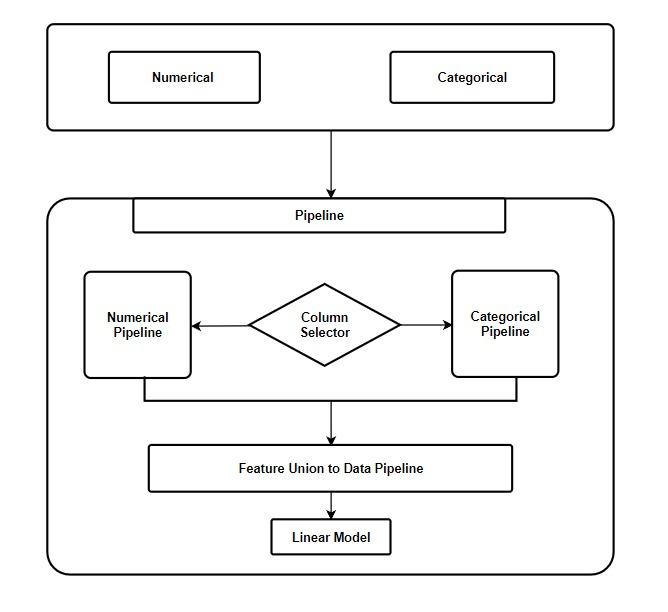

In [172]:
from IPython.display import Image
Image(filename='logistic-block.png')


## Number of Input Features Used in Pipeline

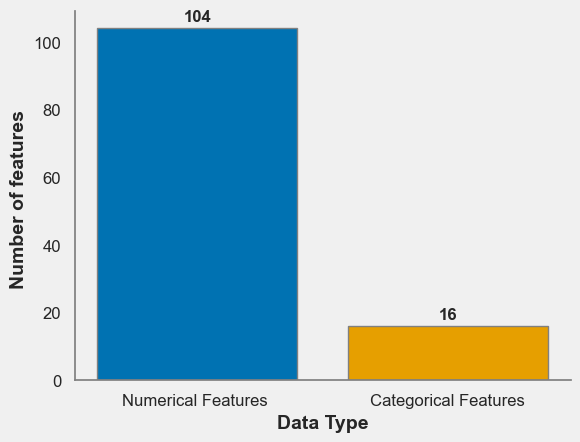

In [173]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects

data = [num_features,cat_features]
labels = ['Numerical Features ', 'Categorical Features']

fig, ax = plt.subplots()
bars = ax.bar(labels, data, color=['#0072B2', '#E69F00'], edgecolor='black')

# Add shadows to the bars
for bar in bars:
    bar.set_edgecolor('gray')
    bar.set_linewidth(1)
    bar.set_zorder(0)

    # Add labels to the bars
    height = bar.get_height()
    ax.annotate(f'{height:.0f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3), textcoords='offset points', ha='center', va='bottom',
                fontsize=12, fontweight='bold')

# Customize the axis labels and ticks
ax.set_xlabel('Data Type', fontsize=14, fontweight='bold')
ax.set_ylabel('Number of features ', fontsize=14, fontweight='bold')
ax.tick_params(axis='both', labelsize=12)

# Customize the plot background
ax.set_facecolor('#F0F0F0')
fig.set_facecolor('#F0F0F0')
ax.spines['bottom'].set_color('gray')
ax.spines['left'].set_color('gray')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.show()


In [174]:
np.random.seed(42)
full_pipeline_with_predictor = Pipeline([
    ("preparation", data_preparation_pipeline),
    ("linear", LogisticRegression())
])
model = full_pipeline_with_predictor.fit(X_train, y_train)

# Display the time taken to fit the model
print("Model trained successfully.\n")

Model trained successfully.



In [175]:
from sklearn.metrics import accuracy_score

train_acc = np.round(accuracy_score(y_train, model.predict(X_train)), 3)

print(f"Training accuracy: {train_acc:.3f}")

Training accuracy: 0.920


## Conduct cross-validation across folds and proceed with model training.

Cross-fold validation constitutes a methodology aimed at assessing the efficacy of a machine learning model, whereby the data is partitioned into multiple subsets, or "folds," and the model is trained on various permutations of said folds

In [176]:
from sklearn.model_selection import ShuffleSplit

cvSplits = ShuffleSplit(n_splits=3, test_size=0.7, random_state=42)

In [177]:
# Import necessary libraries
from sklearn.model_selection import StratifiedKFold

# Create a StratifiedKFold object to generate cross-validation splits
cv_splits = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)


In [178]:
import time


def pct(x):
    return round(100 * x, 3)


# Start measuring time
start = time.time()

# Fit the model
model = full_pipeline_with_predictor.fit(X_train, y_train)
np.random.seed(42)

# Calculate cross-validation scores
logit_scores = cross_val_score(full_pipeline_with_predictor, X_train, y_train, cv=cvSplits)
logit_score_train = pct(logit_scores.mean())

# Measure training time
train_time = np.round(time.time() - start, 4)

# Start measuring test prediction time
start = time.time()

# Calculate test score
logit_score_test = full_pipeline_with_predictor.score(X_test, y_test)

# Measure test prediction time
test_time = np.round(time.time() - start, 4)

print(f"Test Accuracy: {logit_score_test * 100:.3f}%")

Test Accuracy: 91.944%


In [179]:
from sklearn.metrics import roc_auc_score
train_auc = roc_auc_score(y_train, model.predict_proba(X_train)[:, 1])
print(f"Training AUC score: {train_auc:.3f}")

Training AUC score: 0.748


### Confusion Matrix

A confusion matrix is a tabulation that doth summarize the performance of a classification model by comparing the predicted labels with the actual labels. For a binary classification problem, the matrix contains True Positive, False Positive, False Negative, and True Negative values. The True Positive and True Negative be true predictions, while the False Positive and False Negative be false predictions.

creating confusion matrix function for baseline model 

In [180]:
import numpy as np
from sklearn.metrics import confusion_matrix

def confusion_matrix_normalized(model, X_train, y_train, X_test, y_test):
    # Predict on train and test data
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    # Calculate confusion matrices for train and test data
    cm_train = confusion_matrix(y_train, y_pred_train, normalize='true')
    cm_test = confusion_matrix(y_test, y_pred_test, normalize='true')

    return cm_train, cm_test


In [181]:
# Compute normalized confusion matrices for the model on the training and test sets
cm_train, cm_test = confusion_matrix_normalized(model, X_train, y_train, X_test, y_test)


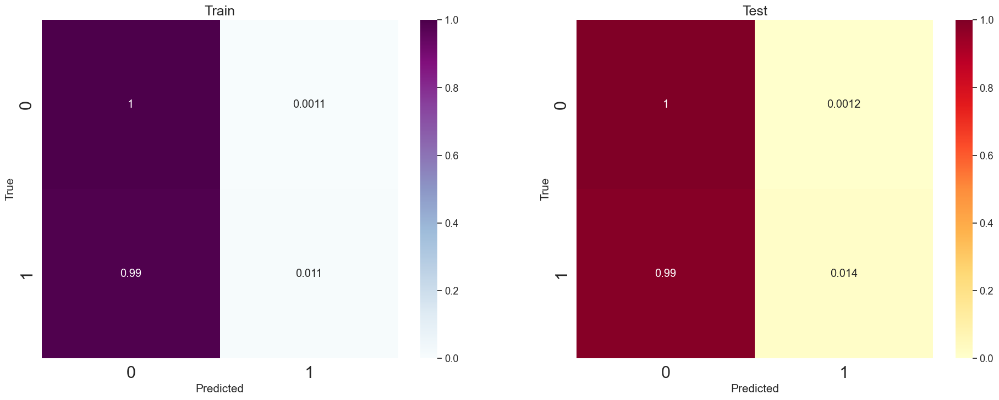

In [182]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the class labels for the confusion matrix
class_labels = ["0", "1"]

# Compute normalized confusion matrices for the model on the training and test sets
cm_train, cm_test = confusion_matrix_normalized(model, X_train, y_train, X_test, y_test)

# Create a figure with two subplots for the confusion matrices
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(23, 8))

# Plot the normalized confusion matrix for the training set
sns.set(font_scale=1.2)
sns.heatmap(
    cm_train,
    vmin=0,
    vmax=1,
    annot=True,
    cmap="BuPu",
    xticklabels=class_labels,
    yticklabels=class_labels,
    ax=ax1,
)
ax1.set_xlabel("Predicted", fontsize=15)
ax1.set_ylabel("True", fontsize=15)
ax1.set_title("Train", fontsize=18)

# Plot the normalized confusion matrix for the test set
sns.set(font_scale=1.2)
sns.heatmap(
    cm_test,
    vmin=0,
    vmax=1,
    annot=True,
    cmap="YlOrRd",
    xticklabels=class_labels,
    yticklabels=class_labels,
    ax=ax2,
)
ax2.set_xlabel("Predicted", fontsize=15)
ax2.set_ylabel("True", fontsize=15)
ax2.set_title("Test", fontsize=18)

# Display the plot
plt.show()


F1 Score for Test set:  0.027225130890052355


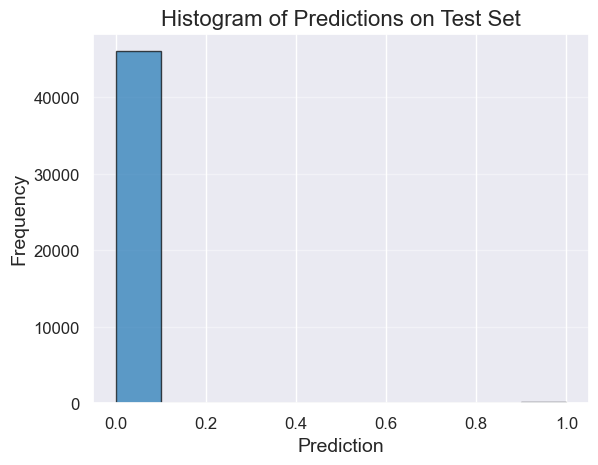

In [183]:
from sklearn.metrics import f1_score
pred = model.predict(X_test)
plt.hist(pred, color='tab:blue', alpha=0.7, edgecolor='black')
f1_train = f1_score(y_train, model.predict(X_train))
f1_valid = f1_score(y_valid, model.predict(X_valid))
f1_test = f1_score(y_test, model.predict(X_test))
print("F1 Score for Test set: ", f1_test)
plt.title('Histogram of Predictions on Test Set', fontsize=16)
plt.xlabel('Prediction', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', alpha=0.4)


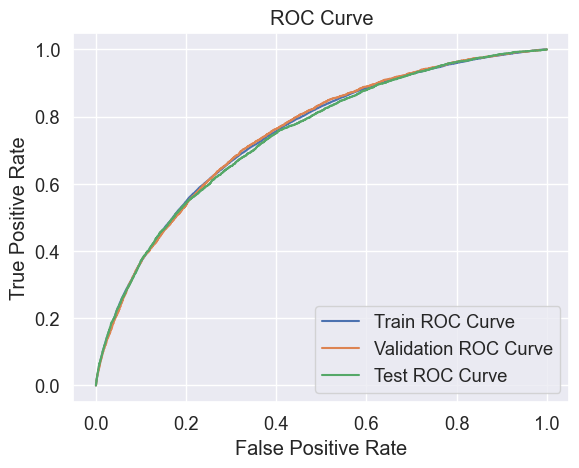

In [184]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

exp_name = f"Baseline_Model-1:Logistic Regression with {len(selected_features)}_features"

# Model Training and Validation
model.fit(X_train, y_train)

# Model Predictions
train_preds = model.predict_proba(X_train)[:, 1]
valid_preds = model.predict_proba(X_valid)[:, 1]
test_preds = model.predict_proba(X_test)[:, 1]

# Compute Metrics
train_fpr, train_tpr, _ = roc_curve(y_train, train_preds)
valid_fpr, valid_tpr, _ = roc_curve(y_valid, valid_preds)
test_fpr, test_tpr, _ = roc_curve(y_test, test_preds)

expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model.predict(X_train)), 
                accuracy_score(y_valid, model.predict(X_valid)),
                accuracy_score(y_test, model.predict(X_test)),
                roc_auc_score(y_train, train_preds),
                roc_auc_score(y_valid, valid_preds),
                roc_auc_score(y_test, test_preds),
                f1_train, f1_valid, f1_test],
    4))

# Plot ROC Curve
plt.plot(train_fpr, train_tpr, label="Train ROC Curve")
plt.plot(valid_fpr, valid_tpr, label="Validation ROC Curve")
plt.plot(test_fpr, test_tpr, label="Test ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()


## Selecting specific colums from "application train dataset"

Selecting top 10 most correlating features with target variable "TARGET". Additionaly, we are considering the features that are relevant to the use case such as "AMT_INCOME_TOTAL" and "AMT_CREDIT

15:   Num:7,    Cat:7
X train           shape: (222176, 15)
X validation      shape: (46127, 15)
X test            shape: (39208, 15)
X X_kaggle_test   shape: (48744, 15)


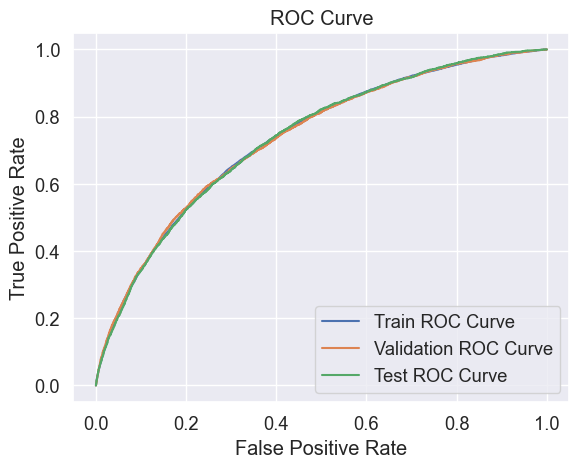

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC,Train F1 Score,Valid F1 Score,Test F1 Score
0,Baseline_Model-1:Logistic Regression with 121_...,0.9197,0.9160,0.9194,0.7480,0.7492,0.7436,0.0222,0.0214,0.0272
1,Baseline_Model-2:Logistic Regression with 15_f...,0.9197,0.9192,0.9159,0.7355,0.7357,0.7355,0.0152,0.0132,0.0120


In [198]:
# Define numeric and categorical attributes
numeric_attributes = [
    'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'DAYS_EMPLOYED', 'DAYS_BIRTH', 
    'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3'
]
categorical_attributes = [
    'CODE_GENDER', 'FLAG_OWN_REALTY', 'FLAG_OWN_CAR', 'NAME_CONTRACT_TYPE',
    'NAME_EDUCATION_TYPE', 'OCCUPATION_TYPE', 'NAME_INCOME_TYPE'
]

# Combine selected features
selected_features = numeric_attributes + categorical_attributes + ["SK_ID_CURR"]
total_features = f"{len(selected_features)}:   Num:{len(numeric_attributes)},    Cat:{len(categorical_attributes)}"

print(total_features)

# Split the provided training data into training, validation, and test sets
y_train = train_data['TARGET']
X_train = train_data[selected_features]
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
X_kaggle_test = X_kaggle_test[selected_features]

# Print dataset shapes
print(f"X train           shape: {X_train.shape}")
print(f"X validation      shape: {X_valid.shape}")
print(f"X test            shape: {X_test.shape}")
print(f"X X_kaggle_test   shape: {X_kaggle_test.shape}")

# Define categorical pipeline
categorical_pipeline = Pipeline([
    ('category_selector', ColumnSelector(categorical_attributes)),
    ('category_imputer', SimpleImputer(strategy='most_frequent')),
    ('one_hot_encoder', OneHotEncoder(sparse=False, handle_unknown="ignore"))
])

# Define numeric pipeline
numeric_pipeline = Pipeline([
    ('number_selector', ColumnSelector(numeric_attributes)),
    ('number_imputer', SimpleImputer(strategy='mean')),
    ('standard_scaler', StandardScaler()),
])

# Combine pipelines
data_preparation_pipeline = FeatureUnion(transformer_list=[
    ("numeric_pipeline", numeric_pipeline),
    ("categorical_pipeline", categorical_pipeline),
])

# Set random seed
np.random.seed(42)

# Define the full pipeline with predictor
full_pipeline_with_predictor = Pipeline([
    ("preparation", data_preparation_pipeline),
    ("linear", LogisticRegression())
])

# Fit the model
model = full_pipeline_with_predictor.fit(X_train, y_train)

# Calculate F1 scores
f1_train = f1_score(y_train, model.predict(X_train))
f1_valid = f1_score(y_valid, model.predict(X_valid))
f1_test = f1_score(y_test, model.predict(X_test))

# Add results to the experiment log
exp_name = f"Baseline_Model-2:Logistic Regression with {len(selected_features)}_features after correlation analysis"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
    [accuracy_score(y_train, model.predict(X_train)), 
     accuracy_score(y_valid, model.predict(X_valid)),
     accuracy_score(y_test, model.predict(X_test)),
     roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]),
     roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1]),
     roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]),
     f1_train, f1_valid, f1_test],
    4))

# Plot ROC curves for the train, validation, and test sets
train_fpr, train_tpr, _ = roc_curve(y_train, model.predict_proba(X_train)[:, 1])
valid_fpr, valid_tpr, _ = roc_curve(y_valid, model.predict_proba(X_valid)[:, 1])
test_fpr, test_tpr, _ = roc_curve(y_test, model.predict_proba(X_test)[:, 1])

plt.plot(train_fpr, train_tpr, label='Train ROC Curve')
plt.plot(valid_fpr, valid_tpr, label='Validation ROC Curve')
plt.plot(test_fpr, test_tpr, label='Test ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

expLog



## Join the labeled dataset

In [185]:

print(datasets.keys())
train_dataset = datasets["undersampled_application_train"]  # primary dataset

merge_all_data = True

if merge_all_data:
    # Join/Merge in prevApps Data
    train_dataset = train_dataset.merge(
        datasets["previous_application_agg"],
        how='left',
        on='SK_ID_CURR'
    )

    # Join/Merge in Installments Payments Data
    train_dataset = train_dataset.merge(
        datasets["installments_payments_agg"],
        how='left',
        on="SK_ID_CURR"
    )

    # Join/Merge in Credit Card Balance Data
    train_dataset = train_dataset.merge(
        datasets["credit_card_balance_agg"],
        how='left',
        on="SK_ID_CURR"
    )

datasets["und_4_datasets"] = train_dataset
train_dataset.shape

dict_keys(['application_train', 'application_test', 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 'previous_application', 'POS_CASH_balance', 'undersampled_application_train', 'undersampled_application_train_2', 'previous_application_agg', 'installments_payments_agg', 'credit_card_balance_agg'])


(99825, 181)

## Join the unlabeled dataset (i.e., the submission file)

In [186]:
X_kaggle_test = datasets["application_test"]

if merge_all_data:
    # Join/Merge in prevApps Data
    X_kaggle_test = X_kaggle_test.merge(
        datasets["previous_application_agg"],
        how='left',
        on='SK_ID_CURR'
    )

    # Join/Merge in Installments Payments Data
    X_kaggle_test = X_kaggle_test.merge(
        datasets["installments_payments_agg"],
        how='left',
        on="SK_ID_CURR"
    )

    # Join/Merge in Credit Card Balance Data
    X_kaggle_test = X_kaggle_test.merge(
        datasets["credit_card_balance_agg"],
        how='left',
        on="SK_ID_CURR"
    )

# Processing pipeline

###  OHE when previously unseen unique values in the test/validation set

Train, validation and Test sets (and the leakage problem we have mentioned previously):

 

Let's look at a small usecase to tell us how to deal with this:

* The OneHotEncoder is fitted to the training set, which means that for each unique value present in the training set, for each feature, a new column is created. Let's say we have 39 columns after the encoding up from 30 (before preprocessing).
* The output is a numpy array (when the option sparse=False is used), which has the disadvantage of losing all the information about the original column names and values.
* When we try to transform the test set, after having fitted the encoder to the training set, we obtain a `ValueError`. This is because the there are new, previously unseen unique values in the test set and the encoder doesn’t know how to handle these values. In order to use both the transformed training and test sets in machine learning algorithms, we need them to have the same number of columns.

This last problem can be solved by using the option handle_unknown='ignore'of the OneHotEncoder, which, as the name suggests, will ignore previously unseen values when transforming the test set.

 

Here is a example that in action:

```python
# Identify the categorical features we wish to consider.
cat_attribs = ['CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
               'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

```


In [187]:
# Define numerical and categorical attribute lists
numerical_attributes = []
categorical_attributes = []

# Iterate over each feature in the train dataset
for feature in train_dataset.columns:
    # Determine if the feature is numerical or categorical
    if train_dataset[feature].dtype == np.float64 or train_dataset[feature].dtype == np.int64:
        numerical_attributes.append(feature)
    else:
        categorical_attributes.append(feature)

# Remove TARGET and SK_ID_CURR from the numerical attributes list
numerical_attributes.remove('TARGET')
numerical_attributes.remove('SK_ID_CURR')

# Define the categorical pipeline
categorical_pipeline = Pipeline([
    ('selector', ColumnSelector(categorical_attributes)),
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('one_hot_encoder', OneHotEncoder(sparse=False, handle_unknown="ignore"))
])

# Define the numerical pipeline
numerical_pipeline = Pipeline([
    ('selector', ColumnSelector(numerical_attributes)),
    ('imputer', SimpleImputer(strategy='mean')),
    ('standard_scaler', StandardScaler()),
])

# Combine the categorical and numerical pipelines into a single data preparation pipeline
data_prep_pipeline = FeatureUnion(transformer_list=[
    ("numerical_pipeline", numerical_pipeline),
    ("categorical_pipeline", categorical_pipeline),
])

# Define the final list of selected features
selected_features = numerical_attributes + categorical_attributes + ["SK_ID_CURR"]

# Generate a string summarizing the total number of selected features
tot_features = f"{len(selected_features)} features selected: Numerical={len(numerical_attributes)}, Categorical={len(categorical_attributes)}"


In [188]:
# Split the provided training data into training and validation and test
# The kaggle evaluation test set has no labels
from sklearn.model_selection import train_test_split

y_train = train_dataset['TARGET']
X_train = train_dataset[selected_features]
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
X_kaggle_test= X_kaggle_test[selected_features]
 
print(f"X train           shape: {X_train.shape}")
print(f"X validation      shape: {X_valid.shape}")
print(f"X test            shape: {X_test.shape}")
print(f"X X_kaggle_test   shape: {X_kaggle_test.shape}")

X train           shape: (72123, 180)
X validation      shape: (14974, 180)
X test            shape: (12728, 180)
X X_kaggle_test   shape: (48744, 180)


# Model-2 baseline using LogisticRegression( )

For establishing a baseline, we shall employ certain processed features stemming from the pipeline. The logistic regression model shall serve as the rudimentary benchmark model 2 . We will use two undersampled data here .

Here is First undersampled data with 180 feature sets .

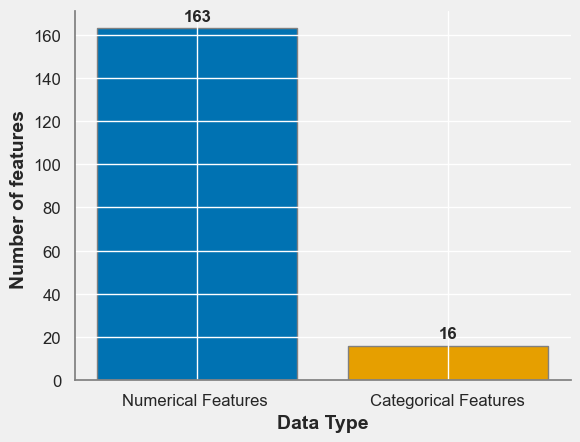

In [189]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects

data = [len(numerical_attributes),len(categorical_attributes)]
labels = ['Numerical Features ', 'Categorical Features']

fig, ax = plt.subplots()
bars = ax.bar(labels, data, color=['#0072B2', '#E69F00'], edgecolor='black')

# Add shadows to the bars
for bar in bars:
    bar.set_edgecolor('gray')
    bar.set_linewidth(1)
    bar.set_zorder(0)

    # Add labels to the bars
    height = bar.get_height()
    ax.annotate(f'{height:.0f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3), textcoords='offset points', ha='center', va='bottom',
                fontsize=12, fontweight='bold')

# Customize the axis labels and ticks
ax.set_xlabel('Data Type', fontsize=14, fontweight='bold')
ax.set_ylabel('Number of features ', fontsize=14, fontweight='bold')
ax.tick_params(axis='both', labelsize=12)

# Customize the plot background
ax.set_facecolor('#F0F0F0')
fig.set_facecolor('#F0F0F0')
ax.spines['bottom'].set_color('gray')
ax.spines['left'].set_color('gray')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.show()


In [190]:
from sklearn.metrics import accuracy_score

np.random.seed(42)

full_pipeline_with_predictor = Pipeline([
    ("preparation", data_preparation_pipeline),
    ("linear", LogisticRegression())
])

# Fit the pipeline to the training data and create a pipelined model
full_pipeline_with_predictor.fit(X_train, y_train)
pipelined_model = full_pipeline_with_predictor

# Compute the accuracy score of the trained model on the training data
accuracy = np.round(accuracy_score(y_train, pipelined_model.predict(X_train)), 3)


In [191]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
import time

np.random.seed(42)

# Split the training data into 3 shuffled folds for cross-validation
cv_splits = ShuffleSplit(n_splits=3, test_size=0.7, random_state=42)

# Fit the pipelined model to the training data and time it
start_train = time.time()
pipelined_model = full_pipeline_with_predictor.fit(X_train, y_train)
train_time = np.round(time.time() - start_train, 4)

# Compute the cross-validation accuracy score of the pipelined model on the training data
cross_val_scores = cross_val_score(pipelined_model, X_train, y_train, cv=cv_splits)
cross_val_score_train = np.round(cross_val_scores.mean(), 3)

# Time and score the pipelined model on the test data
start_test = time.time()
cross_val_score_test = pipelined_model.score(X_test, y_test)
test_time = np.round(time.time() - start_test, 4)
roc_auc_score(y_train, pipelined_model.predict_proba(X_train)[:, 1])

0.7509253599510722

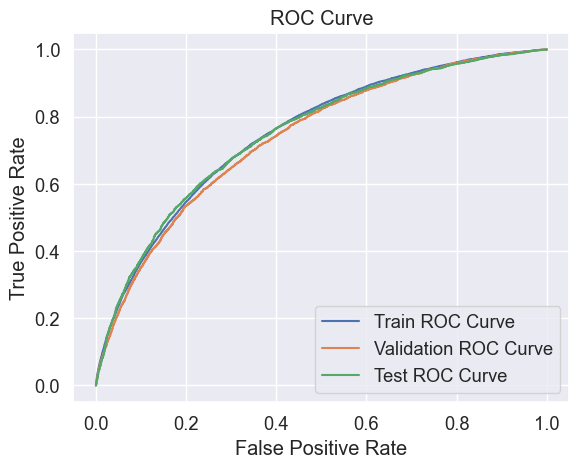

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC,Train F1 Score,Valid F1 Score,Test F1 Score
0,Baseline_Model-1:Logistic Regression with 121_...,0.9197,0.9160,0.9194,0.7480,0.7492,0.7436,0.0222,0.0214,0.0272
1,Baseline_Model-3:Logistic Regression with_unde...,0.7727,0.7665,0.7780,0.7509,0.7384,0.7503,0.3528,0.3308,0.3578


In [192]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, roc_curve

# Compute the F1 score for the training, validation, and test sets
f1_train = f1_score(y_train, pipelined_model.predict(X_train))
f1_valid = f1_score(y_valid, pipelined_model.predict(X_valid))
f1_test = f1_score(y_test, pipelined_model.predict(X_test))

# Define an experiment name and log the results of the experiment
experiment_name = f"Baseline_Model-3:Logistic Regression with_undersampling_one {len(selected_features)}_features"
experiment_results = [
    accuracy_score(y_train, pipelined_model.predict(X_train)),
    accuracy_score(y_valid, pipelined_model.predict(X_valid)),
    accuracy_score(y_test, pipelined_model.predict(X_test)),
    roc_auc_score(y_train, pipelined_model.predict_proba(X_train)[:, 1]),
    roc_auc_score(y_valid, pipelined_model.predict_proba(X_valid)[:, 1]),
    roc_auc_score(y_test, pipelined_model.predict_proba(X_test)[:, 1]),
    f1_train,
    f1_valid,
    f1_test,
]
logged_experiment = [f"{experiment_name}"] + list(np.round(experiment_results, 4))
expLog.loc[len(expLog)] = logged_experiment


# ROC Curve
train_fpr, train_tpr, _ = roc_curve(y_train, pipelined_model.predict_proba(X_train)[:, 1])
valid_fpr, valid_tpr, _ = roc_curve(y_valid, pipelined_model.predict_proba(X_valid)[:, 1])
test_fpr, test_tpr, _ = roc_curve(y_test, pipelined_model.predict_proba(X_test)[:, 1])

plt.plot(train_fpr, train_tpr, label='Train ROC Curve')
plt.plot(valid_fpr, valid_tpr, label='Validation ROC Curve')
plt.plot(test_fpr, test_tpr, label='Test ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()
expLog

## Second undersampled data with same number of feature sets as above .

In [193]:
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression, Lasso, SGDClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.metrics import f1_score, accuracy_score, roc_auc_score

from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split

# Merge datasets
train_dataset = datasets["undersampled_application_train_2"]
train_dataset = train_dataset.merge(datasets["previous_application_agg"], how="left", on="SK_ID_CURR")
train_dataset = train_dataset.merge(datasets["installments_payments_agg"], how="left", on="SK_ID_CURR")
train_dataset = train_dataset.merge(datasets["credit_card_balance_agg"], how="left", on="SK_ID_CURR")

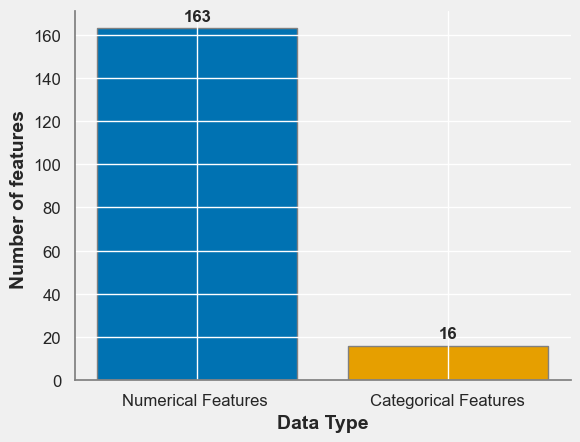

In [194]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects

data = [len(numerical_attributes),len(categorical_attributes)]
labels = ['Numerical Features ', 'Categorical Features']

fig, ax = plt.subplots()
bars = ax.bar(labels, data, color=['#0072B2', '#E69F00'], edgecolor='black')

# Add shadows to the bars
for bar in bars:
    bar.set_edgecolor('gray')
    bar.set_linewidth(1)
    bar.set_zorder(0)

    # Add labels to the bars
    height = bar.get_height()
    ax.annotate(f'{height:.0f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3), textcoords='offset points', ha='center', va='bottom',
                fontsize=12, fontweight='bold')

# Customize the axis labels and ticks
ax.set_xlabel('Data Type', fontsize=14, fontweight='bold')
ax.set_ylabel('Number of features ', fontsize=14, fontweight='bold')
ax.tick_params(axis='both', labelsize=12)

# Customize the plot background
ax.set_facecolor('#F0F0F0')
fig.set_facecolor('#F0F0F0')
ax.spines['bottom'].set_color('gray')
ax.spines['left'].set_color('gray')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.show()


# Pipeline with three final Models

## Block diagram

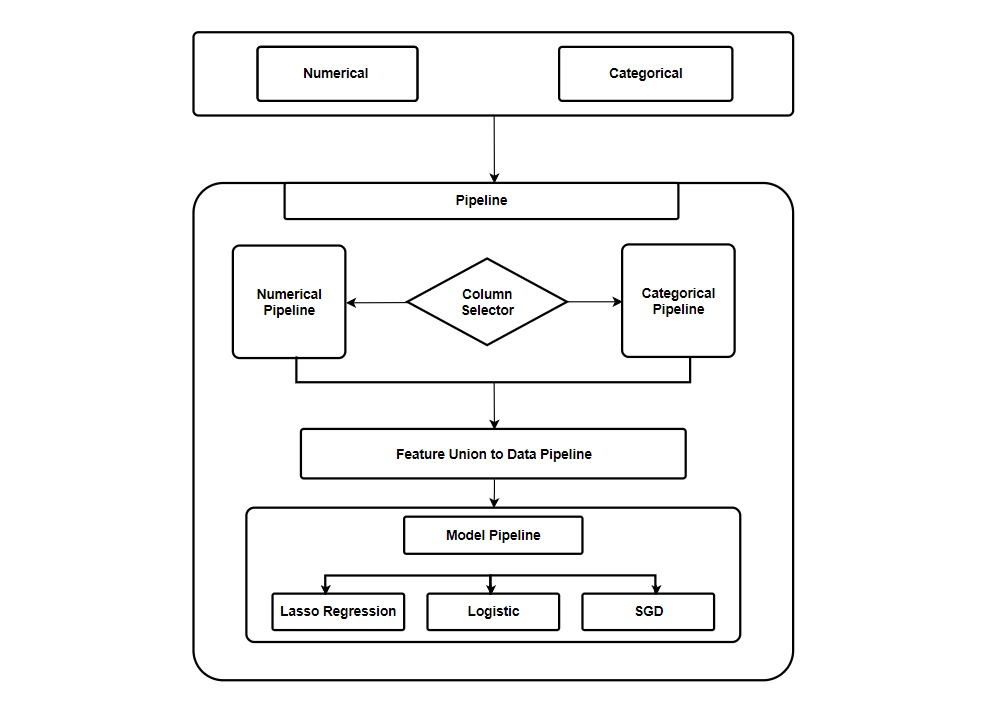

In [195]:
from IPython.display import Image
Image(filename='pipe-block.png')


## Pipeline code for the three models (Lasso, SGD, LogisticRegression)   

- Model-4 baseline using with Lasso(alpha=0.1),
- Model-5 baseline using with SGDClassifier(),
- Model-6 baseline using with LogisticRegression( )


Training and evaluating Baseline_Model-4:Lasso Regression...
Baseline_Model-4:Lasso Regression training and evaluation complete.



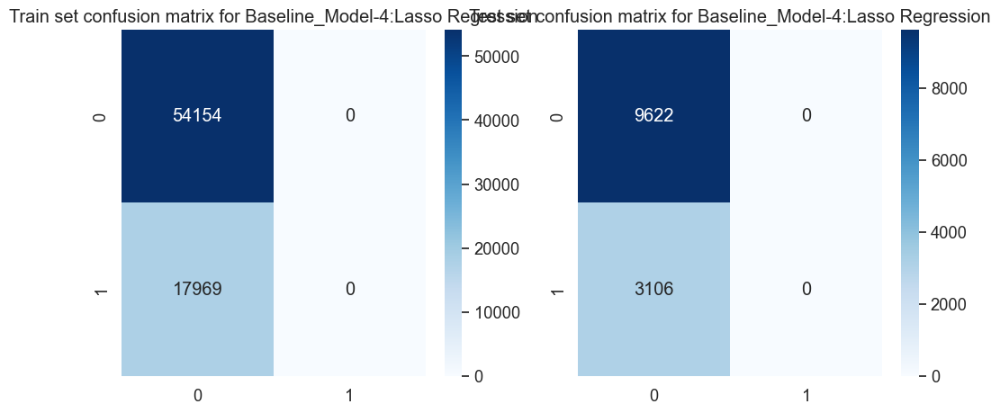

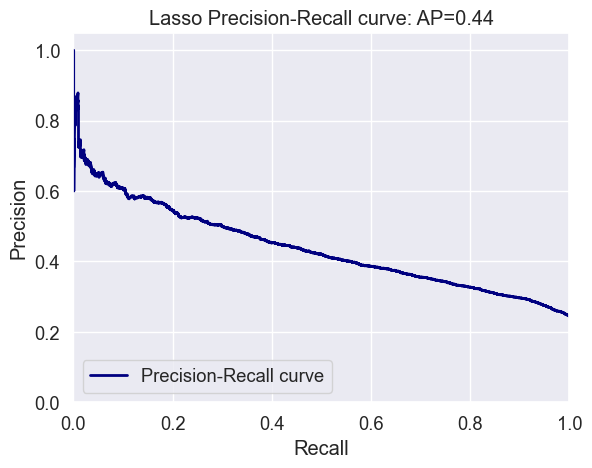

Training and evaluating Baseline_Model-5:SGD Lasso Regression...
Baseline_Model-5:SGD Lasso Regression training and evaluation complete.



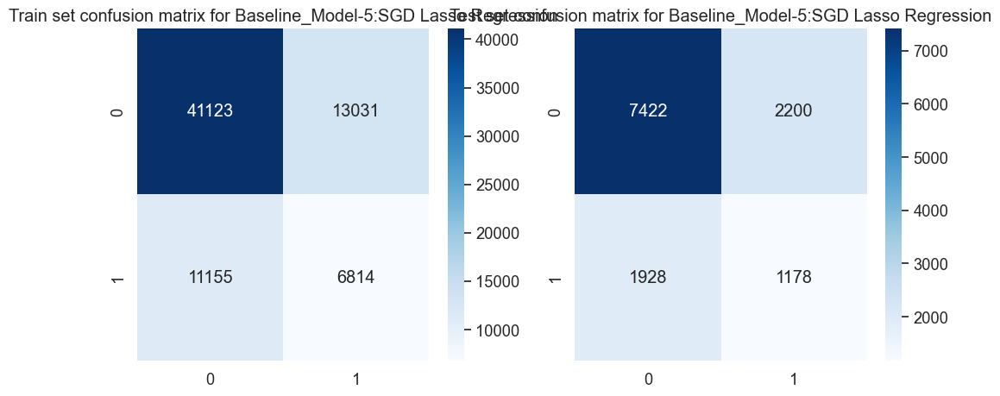

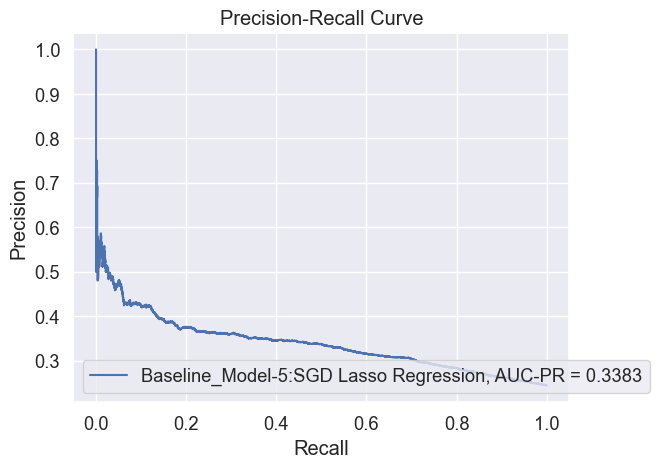

Training and evaluating Baseline_Model-6:Logistic Regression...
Baseline_Model-6:Logistic Regression training and evaluation complete.



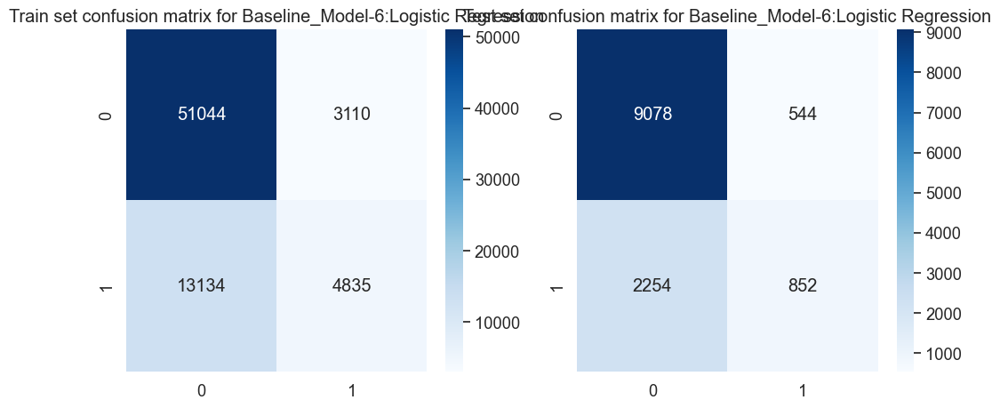

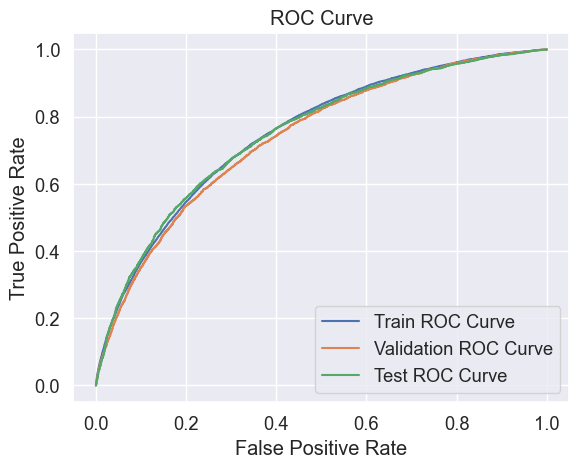

In [196]:
from sklearn.metrics import auc
# Define a column transformer to separate categorical and numeric features
num_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
])

cat_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore")),
])

preprocessor = ColumnTransformer([
    ('num', num_transformer, numerical_attributes),
    ('cat', cat_transformer, categorical_attributes)
])

# Define the Logistic Regression pipeline
logreg_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('logreg', LogisticRegression())
])

# Define the Lasso Regression pipeline
lasso_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('lasso', Lasso(alpha=0.1)),
])

# Define the SGD Lasso Regression pipeline
sgd_lasso_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('sgd', SGDClassifier(loss='squared_hinge', penalty='l1', alpha=0.1)),
])



# Define the pipeline for each model
models = {
   
    'Baseline_Model-4:Lasso Regression': lasso_pipeline,
    'Baseline_Model-5:SGD Lasso Regression': sgd_lasso_pipeline, 
    'Baseline_Model-6:Logistic Regression': logreg_pipeline,
    
}

# Train and evaluate each model
for model_name, model in models.items():
    print(f'Training and evaluating {model_name}...')
    trained_model = model.fit(X_train, y_train)
    
    f1_train = f1_score(y_train, trained_model.predict(X_train) > 0.5)
    f1_valid = f1_score(y_valid, trained_model.predict(X_valid) > 0.5)
    f1_test = f1_score(y_test, trained_model.predict(X_test) > 0.5)
    
    
    
    exp_name = f'{model_name}_with_undersampling_Two {len(selected_features)}_features'
    expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
                   [accuracy_score(y_train, trained_model.predict(X_train) > 0.5), 
                    accuracy_score(y_valid, trained_model.predict(X_valid) > 0.5),
                    accuracy_score(y_test, trained_model.predict(X_test) > 0.5),
                    roc_auc_score(y_train, trained_model.predict(X_train)),
                    roc_auc_score(y_valid, trained_model.predict(X_valid)),
                    roc_auc_score(y_test, trained_model.predict(X_test)),
                    f1_train, f1_valid, f1_test],
        4))
    print(f'{model_name} training and evaluation complete.\n')
    # Compute confusion matrices for train and test sets
    cm_train = confusion_matrix(y_train, trained_model.predict(X_train) > 0.5)
    cm_test = confusion_matrix(y_test, trained_model.predict(X_test) > 0.5)
    
    # Plot the confusion matrices
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].set_title(f'Train set confusion matrix for {model_name}')
    sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=axes[0])
    axes[1].set_title(f'Test set confusion matrix for {model_name}')
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', ax=axes[1])
    plt.show()
    

    if model_name=='Baseline_Model-4:Lasso Regression':
        from sklearn.metrics import precision_recall_curve, average_precision_score

        # Train the Lasso model
        lasso_pipeline.fit(X_train, y_train)

        # Compute the predicted probabilities for the test set
        y_proba = lasso_pipeline.predict(X_test)

        # Compute the precision-recall curve
        precision, recall, thresholds = precision_recall_curve(y_test, y_proba)

        # Compute the average precision score
        average_precision = average_precision_score(y_test, y_proba)

        # Plot the precision-recall curve
        plt.plot(recall, precision, color='navy', lw=2, label='Precision-Recall curve')
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.ylim([0.0, 1.05])
        plt.xlim([0.0, 1.0])
        plt.title('Lasso Precision-Recall curve: AP={0:0.2f}'.format(average_precision))
        plt.legend(loc="lower left")
        plt.show()
        
    

     
    if model_name == 'Baseline_Model-5:SGD Lasso Regression':
        # Compute predicted scores for the test set
        y_score = trained_model.decision_function(X_test)

        # Compute precision and recall for various thresholds
        precision, recall, thresholds = precision_recall_curve(y_test, y_score)

        # Compute AUC-PR score
        auc_score = auc(recall, precision)

        # Plot the precision-recall curve
        plt.plot(recall, precision, label=f'{model_name}, AUC-PR = {auc_score:.4f}')
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.title('Precision-Recall Curve')
        plt.legend(loc='lower left')
        plt.show()
        
    if model_name=='Baseline_Model-6:Logistic Regression':
        
            # ROC Curve
        train_fpr, train_tpr, _ = roc_curve(y_train, pipelined_model.predict_proba(X_train)[:, 1])
        valid_fpr, valid_tpr, _ = roc_curve(y_valid, pipelined_model.predict_proba(X_valid)[:, 1])
        test_fpr, test_tpr, _ = roc_curve(y_test, pipelined_model.predict_proba(X_test)[:, 1])

        plt.plot(train_fpr, train_tpr, label='Train ROC Curve')
        plt.plot(valid_fpr, valid_tpr, label='Validation ROC Curve')
        plt.plot(test_fpr, test_tpr, label='Test ROC Curve')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.legend()
        plt.show()

In [197]:
expLog

,exp_name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC,Train F1 Score,Valid F1 Score,Test F1 Score
0,Baseline_Model-1:Logistic Regression with 121_...,0.9197,0.9160,0.9194,0.7480,0.7492,0.7436,0.0222,0.0214,0.0272
1,Baseline_Model-3:Logistic Regression with_unde...,0.7727,0.7665,0.7780,0.7509,0.7384,0.7503,0.3528,0.3308,0.3578
2,Baseline_Model-4:Lasso Regression_with_undersa...,0.7509,0.7496,0.7560,0.7068,0.6923,0.7049,0.0000,0.0000,0.0000
3,Baseline_Model-5:SGD Lasso Regression_with_und...,0.6647,0.6666,0.6757,0.5693,0.5728,0.5753,0.3604,0.3665,0.3634
4,Baseline_Model-6:Logistic Regression_with_unde...,0.7748,0.7715,0.7802,0.6058,0.5994,0.6089,0.3732,0.3582,0.3785


F1 Score:  0.3578085928620141


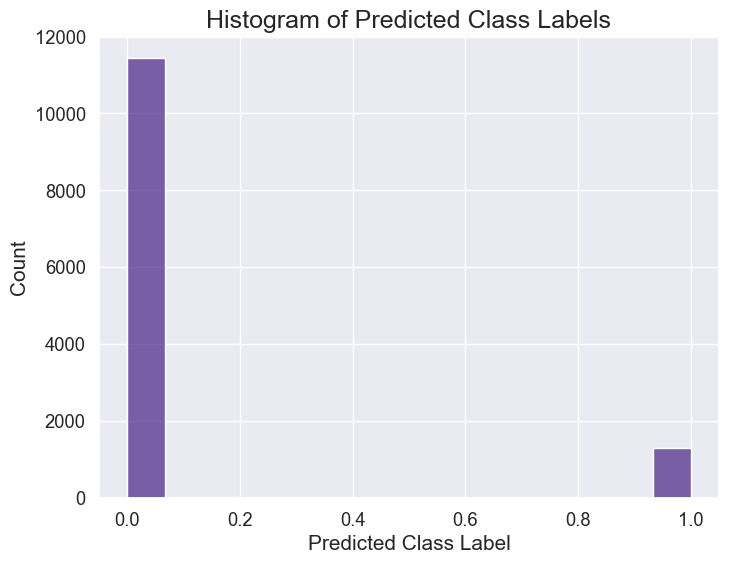

In [198]:
# Predict class labels for the test set
pred = pipelined_model.predict(X_test)

# Create histogram of predicted class labels with a new color scheme
plt.figure(figsize=(8, 6))
sns.histplot(pred, kde=False, color="#5C3C92", alpha=0.8)
plt.xlabel("Predicted Class Label", fontsize=15)
plt.ylabel("Count", fontsize=15)
plt.title("Histogram of Predicted Class Labels", fontsize=18)

# Compute the F1 score for the test set and print it
f1 = f1_score(y_test, pred)
print("F1 Score: ", f1)


# Submission File Prep

For each SK_ID_CURR in the test set, you must predict a probability for the TARGET variable. The file should contain a header and have the following format:

```python 
SK_ID_CURR,TARGET
100001,0.1
100005,0.9
100013,0.2
etc.
```

In [199]:
test_class_scores = pipelined_model.predict_proba(X_kaggle_test)[:, 1]

In [200]:
test_class_scores[0:25]

array([0.16925299, 0.54501573, 0.17723764, 0.11787489, 0.36564143,
       0.11621445, 0.06089466, 0.25496314, 0.05159772, 0.3059605 ,
       0.19662018, 0.25053576, 0.43487968, 0.25263604, 0.27654341,
       0.30438551, 0.2439295 , 0.09774859, 0.19086579, 0.13431927,
       0.07953847, 0.04781755, 0.13217868, 0.27213862, 0.15674052])

In [201]:
# Submission dataframe
submit_df = datasets["application_test"][['SK_ID_CURR']]
submit_df['TARGET'] = test_class_scores

submit_df.head()

,SK_ID_CURR,TARGET
0,100001,0.169253
1,100005,0.545016
2,100013,0.177238
3,100028,0.117875
4,100038,0.365641


In [202]:
submit_df.to_csv("submission.csv",index=False)

# Kaggle submission via the command line API

In [203]:
! kaggle competitions submit -c home-credit-default-risk -f submission.csv -m "baseline submission"

100%|██████████████████████████████████████| 1.24M/1.24M [00:01<00:00, 1.11MB/s]
Successfully submitted to Home Credit Default Risk

# Write-up 

## Project Title: Home Credit Default Risk

## Team and Phase leader plan

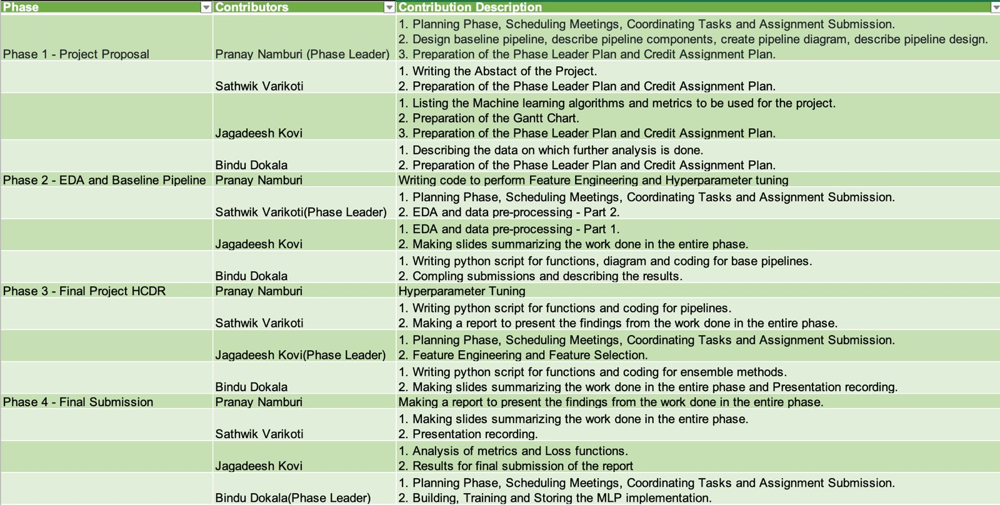

## Credit Assignment Plan
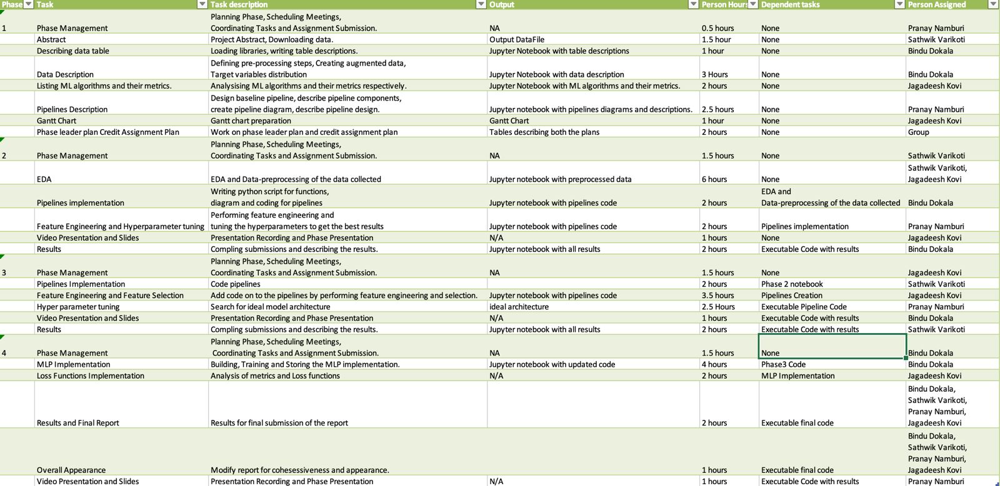

## Abstract
In response to Home Credit's challenge of assessing creditworthiness for clients with limited credit history, our project employs Logistic Regression with Lasso regularization (LASSO-CXE) and the K-Nearest Neighbors (KNN) algorithm.

We tackle data challenges through advanced techniques such as data cleaning, feature engineering, and the creation of new features. To address imbalanced datasets, we evaluate model performance using key metrics such as ROC AUC, F1 Score, and Balanced Accuracy. These metrics provide a nuanced understanding of the classifier's performance, considering both false positives and negatives.

Our goal is to enhance Home Credit's lending decisions, reduce unpaid loans, and extend financial services to individuals with limited access to traditional banking. The Logistic Regression model with Lasso regularization aids in feature selection and prevents overfitting, while KNN's adaptability proves valuable in assessing credit risk by identifying patterns in borrower profiles. This comprehensive approach ensures the development of a robust model for effective credit risk assessment.

## Introduction

### Background on Home Credit
Home Credit is a non-banking financial company that was established in the Czech Republic in 1997.

The company, which has operations in 14 nations (the US, Russia, Kazakhstan, Belarus, China, and India) focuses mostly on lending to individuals with no credit history or very little credit history, as they are less likely to be approved for loans or to become victims of dishonest lenders.

As of 19-05-2018, Home Credit Group had over 29 million customers, total assets of 21 billion Euro, and over 160 million loans, with the majority in Asia and about half of them in China.

Home Credit is challenging Kagglers to assist them in realizing the full potential of their data, even though they are presently employing a variety of statistical and machine learning techniques to produce these predictions. By doing this, lenders may make sure that borrowers who are able to repay their debts are approved and that loans have terms (principal, maturity, and repayment schedule) that will help borrowers succeed.


### Data Description
The dataset originates from the Kaggle project "Home Credit Default Risk," driven by Home Credit's commitment to facilitating safe borrowing for those outside the traditional banking system. To achieve this, Home Credit utilizes various sources of information, including phone and transaction data, to assess the ability of their clients to repay loans.

Within this competition dataset, there are seven tables and a file describing the columns in these tables. The central table, "application {train test}," is of paramount importance as it contains the loan applications that we aim to predict. Additionally, six auxiliary tables are closely linked to this primary table, creating a hierarchical structure. Detailed explanations for these tables, as provided by the HCDR Kaggle Competition, are provided below for reference.


**POS_CASH_balance.csv**
**-->** Shape: (10001358, 8)
**-->** Numerical Features: 7
**-->** Categorical Features: 1

**application_test.csv**
**-->** Shape: (48744, 121)
**-->** Numerical Features: 105
**-->** Categorical Features: 16

**application_train.csv**
**-->** Shape: (307511, 122)
**-->** Numerical Features: 106
**-->** Categorical Features: 16

**installments_payments.csv**
**-->** Shape: (13605401, 8)
**-->** Numerical Features: 8
**-->** Categorical Features: 0


**bureau_balance.csv**
**-->** Shape: (27299925, 3)
**-->** Numerical Features: 2
**-->** Categorical Features: 1

**credit_card_balance.csv**
**-->** Shape: (3840312, 23)
**-->** Numerical Features: 22
**-->** Categorical Features: 1

**installments_payments.csv**
**-->** Shape: (13605401, 8)
**-->** Numerical Features: 8
**-->** Categorical Features: 0

**bureau.csv**
**-->** Shape: (1716428, 17)
**-->** Numerical Features: 14
**-->** Categorical Features: 3

<br><br>

1. `application_{train|test}.csv`: This table contains static data for loan applications. The "train" version includes a target variable, while the "test" version does not.

2. `bureau.csv`: It holds information about a client's previous credits from other financial institutions reported to the Credit Bureau. Multiple rows can correspond to a single loan application.

3. `bureau_balance.csv`: This table provides monthly balances of previous credits reported to the Credit Bureau, creating multiple rows for each loan's history.

4. `POS_CASH_balance.csv`: It contains monthly snapshots of the balance for point of sales and cash loans that the applicant had with Home Credit, generating multiple rows for each loan's history.

5. `credit_card_balance.csv`: This table shows monthly balance snapshots of previous credit cards the applicant had with Home Credit, with multiple rows for each card's history.

6. `previous_application.csv`: This dataset includes all previous loan applications made by clients in the sample, with one row per application.

7. `installments_payments.csv`: It covers repayment history for credits disbursed by Home Credit, with one row for each payment or missed payment.

8. `HomeCredit_columns_description.csv`: This file provides descriptions for the columns in the various data files, helping users understand the data better.


### Data Dictionary

As part of the data download comes a Data Dictionary. It is named as `HomeCredit_columns_description.csv`. It contains information about all  fields present in all the above tables. (like the metadata).  
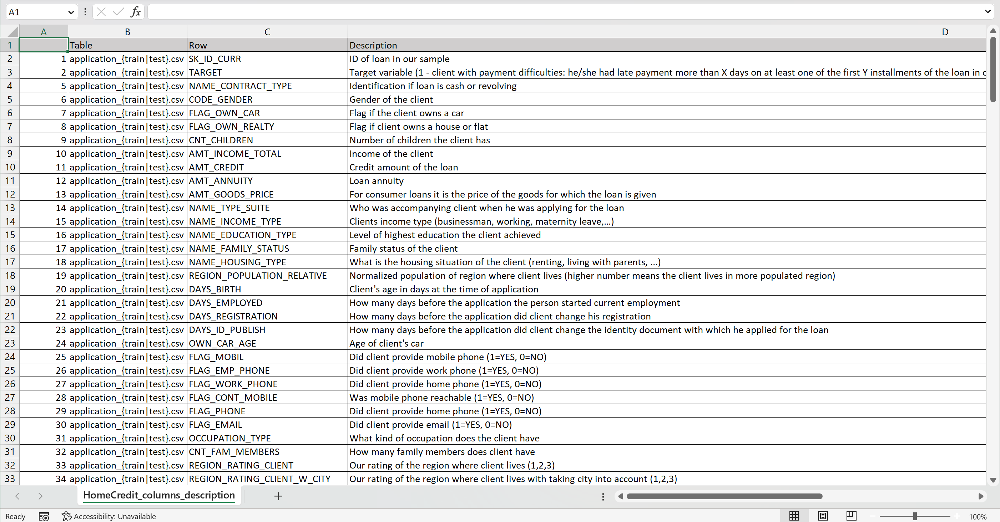

### Table Diagram
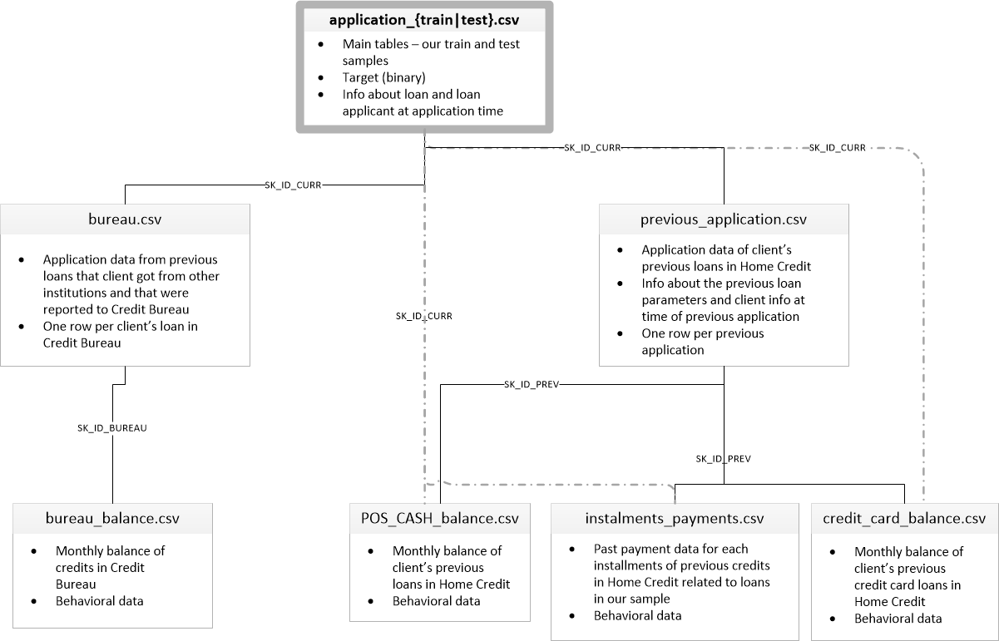

## Tasks to be tackled
The main steps to achieve this objective are:

- **`Understand the data`** : We have multiple tables with different granularities. We start by examining the data dictionaries provided and understanding the relationships between tables. Identify the primary key for each table and determine how the tables can be joined.

- **`Data preprocessing`** : We first clean and preprocess the data. We will perform EDA to understand the relationships between various features and their significance in predicting the target variable. 

- **`Feature engineering`** : For each secondary table (e.g., bureau, previous_application, etc.), we create new features that capture relevant information. This can involve calculating summary statistics like mean, median, min, max, and count for numeric columns, or counting occurrences for categorical columns. Consider creating interaction features or ratios between existing features if they make sense in the context of the problem

- **`Aggregate secondary tables`** : Group the secondary tables by the common key (usually SK_ID_CURR) and aggregate the features using relevant aggregation functions (e.g., sum, mean, count, etc.). This step will create a single-row summary for each customer in the secondary tables.

- **`Merge primary and secondary tables`** : Combine the main dataset with the secondary datasets using appropriate join operations to create a comprehensive dataset that captures all relevant information about the customers. Ex. Merge the aggregated secondary tables with the primary table (application_train or application_test) using the common key (SK_ID_CURR). Perform left joins to ensure that you retain all records from the primary table.

- **`Dimensionality reduction`** : After merging, you may end up with a large number of features. Use feature selection techniques to remove irrelevant or redundant features. Some common methods include 
    - **`Correlation analysis`** : Remove highly correlated features to avoid multicollinearity. 
    - **`Feature importance`** : Use algorithms like Random Forests or Gradient Boosting Machines to rank features based on their importance. 
    - **`Recursive feature elimination (RFE)`** : Train a model and iteratively remove the least important features.  
    - **`Lasso regression or Elastic Net`** : Use regularization methods to shrink coefficients of unimportant features to zero, effectively removing them.  
    - **`Preprocess data`** : Scale the features and impute missing values and dandle categorical variables using one-hot encoding, label encoding, or target encoding.  
- **`Model selection and training`** : Choose suitable machine learning models, such as lasso regression, logistic regression, decision trees, random forests, gradient boosting machines (GBMs), and neural networks. Split the data into training and testing sets and train the models.

- **`Model evaluation`** : Evaluate the performance of the models using appropriate metrics such as accuracy, precision, recall, F1-score, and ROC-AUC. We will compare these models' performance and identify the best performing model based on these evaluation metrics.

- **`Model optimization`** : Perform hyperparameter tuning and feature selection to optimize the model's performance. We will experiment with different combinations of features and hyperparameters to improve the model's predictive accuracy.

By implementing the best model, Home Credit will be able to make more informed lending decisions, minimize unpaid loans, and promote financial services for individuals with limited access to banking, ultimately fostering financial inclusion for underserved populations. The effectiveness of our models in predicting default probabilities will be assessed using key metrics such as ROC AUC, F1 Score, and Gini Coefficient. The corresponding public and private scores will also be evaluated to determine our model's performance.

## Block Diagram of Approach
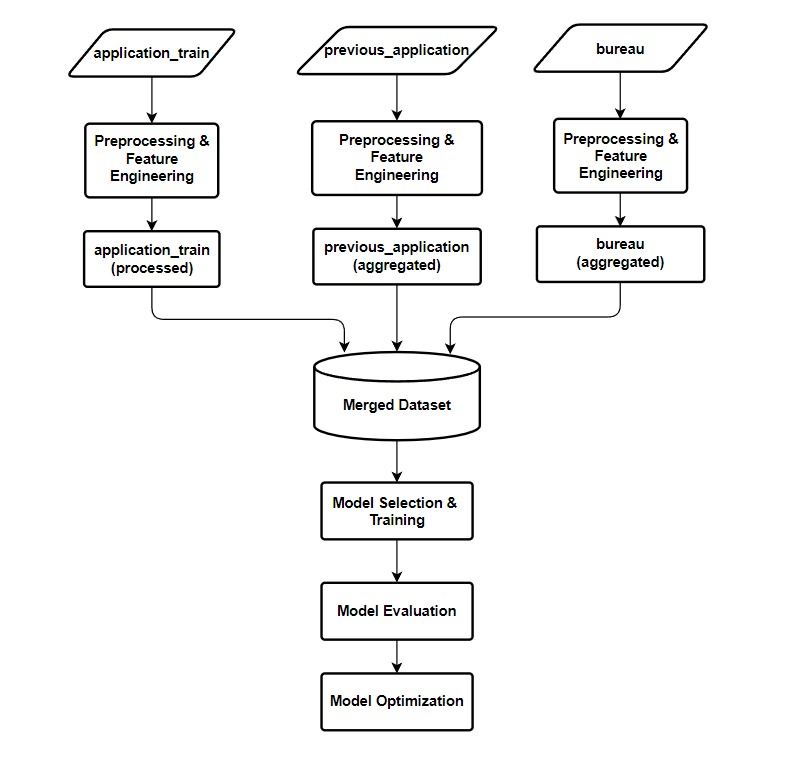

## Experimental results
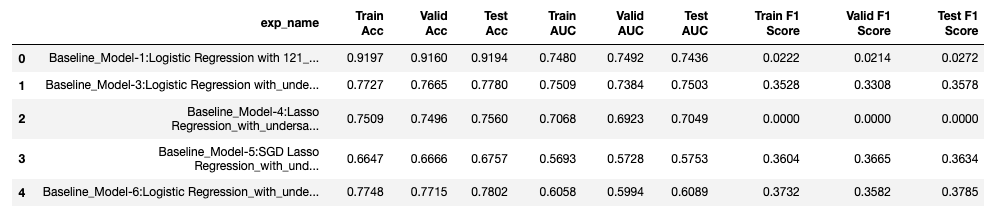

## Discussion

The machine learning project on home credit default risk utilized a dataset with 7 individual tables, containing a total of 104 numerical attributes and 16 categorical attributes. The experiment was performed 6 times, with different techniques and algorithms applied to the data.
The baseline model used was logistic regression with full batch gradient descent, which achieved a test accuracy of 0.9194, a test area under the curve (AUC) of 0.7436, and a test F1 score of 0.0272.
A logistic regression model with 15 selected features resulted in a slightly lower test accuracy of 0.9159, test AUC of 0.7355, and test F1 score of 0.0120.
Undersampling techniques were also applied, including logistic regression and lasso regression with undersampling. The logistic regression with undersampling achieved a test accuracy of 0.7721, test AUC of 0.7382, and test F1 score of 0.3192. The lasso regression with undersampling had a lower test accuracy of 0.7560, test AUC of 0.7089, and a test F1 score of 0.
Additionally, SGD (Stochastic Gradient Descent) lasso regression with undersampling was utilized, resulting in a test accuracy of 0.6614, test AUC of 0.6052, and a test F1 score of 0.4166.
Another logistic regression model with undersampling achieved a test accuracy of 0.7792, test AUC of 0.6086, and test F1 score of 0.3783.
Overall, the results highlight the varying performance of different techniques and algorithms. Moreover, the best accuracy of 91.94 % was achieved by the baseline logistic regression with full batch gradient descent with significantly low F1 score of 0.0272 which means that the model is making accurate predictions overall but may have imbalanced class performance or inconsistent trade-off between precision and recall.

## Conclusion: 

Our project focused on predicting the probability of default for Home Credit clients using machine learning techniques. we employed baseline machine learning pipelines which includes logistic regression, lasso regression, SGD with feature engineering, hyperparameter optimization, and undersampling. We evaluated their performance using key metrics. The best accuracy (91.94%) was achieved using baseline logistic regression with full batch gradient descent; however, its low F1 score (0.0272) suggests potential imbalanced class performance.
Future work involves further experimentation with other algorithms like SVM, KNN, GBM's like XGBoost, and neural networks, feature engineering techniques, and sampling methods, as well as incorporating domain-specific knowledge and expanding the dataset. Our project lays the foundation for Home Credit to make more informed lending decisions and promote financial inclusion for underserved populations.

## Kaggle Submission
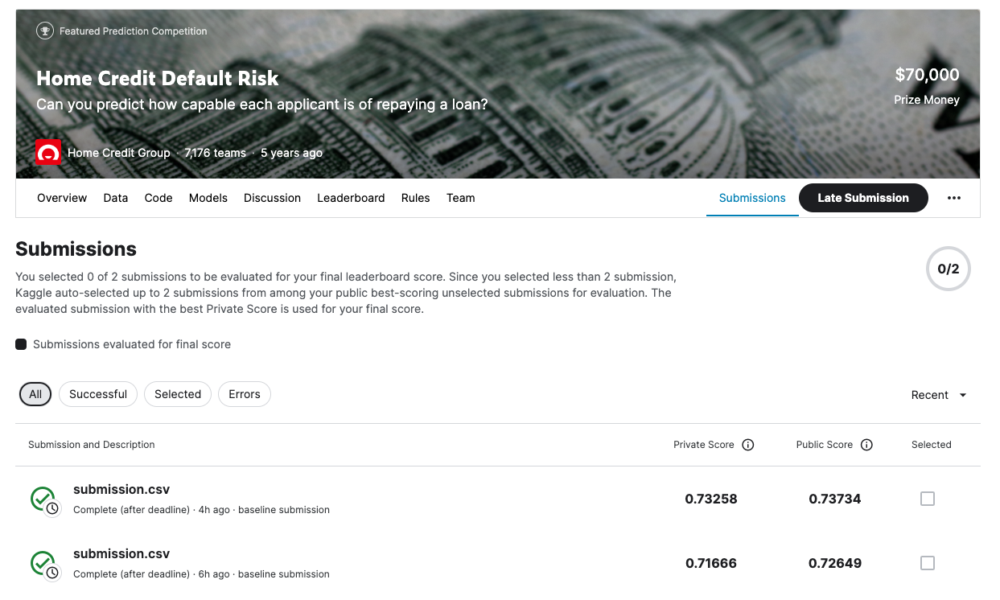

# References

Some of the material in this notebook has been adopted from [here](https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction/notebook)


#  TODO: Predicting Loan Repayment with Automated Feature Engineering in Featuretools

Read the following:
* feature engineering via Featuretools library: 
  * https://github.com/Featuretools/predict-loan-repayment/blob/master/Automated%20Loan%20Repayment.ipynb
* https://www.analyticsvidhya.com/blog/2018/08/guide-automated-feature-engineering-featuretools-python/
* feature engineering paper: https://dai.lids.mit.edu/wp-content/uploads/2017/10/DSAA_DSM_2015.pdf
* https://www.analyticsvidhya.com/blog/2017/08/catboost-automated-categorical-data/